# 02 — Modelli interpretabili su KANDY Easy

## Obiettivo

Questo notebook studia quanto le task di **KANDY Easy** possano essere affrontate utilizzando una rappresentazione interpretabile costruita direttamente dalle immagini.

Il flusso sperimentale è:

**immagine -> percezione oggetti -> feature interpretabili -> classificatore -> predizione task**

La percezione riconosce gli oggetti in termini di **forma, colore, dimensione e posizione**. A questa rappresentazione aggiungiamo anche alcune **relazioni spaziali generiche** tra coppie di oggetti.

## Regola metodologica

L'annotazione `symbol` **non viene utilizzata per costruire le feature e non viene utilizzata come target dei classificatori**. Viene consultata soltanto nella diagnostica post-hoc del detector, per misurare quanto la rappresentazione visiva sia affidabile.

In questo modo possiamo distinguere due possibili fonti di errore:

1. errori della percezione;
2. errori del classificatore interpretabile.


In [22]:
from pathlib import Path
import ast
import math
import random
import warnings
import os

warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from scipy import ndimage
from sklearn.tree import DecisionTreeClassifier, plot_tree
import cv2
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn.metrics import (
    accuracy_score,
    precision_recall_fscore_support,
    f1_score,
)

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

TASK_NAMES = {
    0: "triangle vs any",
    1: "square vs any",
    2: "circle vs any",
    3: "red vs any",
    4: "green vs any",
    5: "blue vs any",
    6: "cyan vs any",
    7: "magenta vs any",
    8: "yellow vs any",
    9: "red triangle on the right",
    10: "red triangle on the right and arbitrary objects",
    11: "red triangle on the right and at least one circle and arbitrary objects",
    12: "red triangle on the right and at least one blue object and arbitrary objects",
    13: "triangle and square, same color",
    14: "palindrome aba",
    15: "house",
    16: "car",
    17: "tower",
    18: "wagon",
    19: "traffic light",
}

SHAPES = ["triangle", "square", "circle"]
COLORS = ["red", "green", "blue", "cyan", "magenta", "yellow"]
SIZES = ["small", "large"]

In [8]:
EXPECTED = Path("data") / "samples" / "sets"

def is_root(path):
    base = path / EXPECTED
    return all(
        (base / split / "annotations.csv").is_file()
        for split in ["train", "val", "test"]
    )

roots = [
    Path.cwd(),
    Path.home() / "Downloads" / "kandy-xai",
    Path("/home/cosimo/Downloads/kandy-xai"),
    *list(Path.cwd().parents)[:4],
]

ROOT = next(
    (path.resolve() for path in roots if path.exists() and is_root(path)),
    None,
)

SPLIT_DIRS = {
    split: ROOT / EXPECTED / split
    for split in ["train", "val", "test"]
}

def load_split(split):
    frame = pd.read_csv(SPLIT_DIRS[split] / "annotations.csv").copy()

    for column in ["task_id", "label"]:
        frame[column] = pd.to_numeric(frame[column], errors="raise").astype(int)

    if "supervised" not in frame.columns:
        frame["supervised"] = 1

    frame["supervised"] = (
        pd.to_numeric(frame["supervised"], errors="coerce")
        .fillna(1)
        .astype(int)
    )
    frame["split"] = split

    return frame

splits = {
    split: load_split(split)
    for split in SPLIT_DIRS
}

print("ROOT:", ROOT)
for split, frame in splits.items():
    print(f"{split:>5}: {len(frame)} immagini")

ROOT: /home/cosimo/Downloads/kandy-xai
train: 1000 immagini
  val: 500 immagini
 test: 500 immagini


In [9]:
def resolve_image_path(filename, split):
    base = SPLIT_DIRS[split]
    filename = Path(str(filename))

    candidates = [
        base / filename,
        base / filename.name,
    ]

    for path in candidates:
        if path.is_file():
            return path

    matches = list(base.rglob(filename.name))
    if matches:
        return matches[0]

    raise FileNotFoundError(
        f"Immagine non trovata: {filename} ({split})"
    )

for split, frame in splits.items():
    print(
        split,
        resolve_image_path(frame.iloc[0]["filename"], split)
    )

train /home/cosimo/Downloads/kandy-xai/data/samples/sets/train/0/0000.png
val /home/cosimo/Downloads/kandy-xai/data/samples/sets/val/0/0000.png
test /home/cosimo/Downloads/kandy-xai/data/samples/sets/test/0/0000.png


## 1. Percezione degli oggetti

La prima fase consiste nel trasformare l'immagine in una descrizione strutturata degli oggetti.

KANDY Easy utilizza sei colori discreti. Per questo motivo segmentiamo l'immagine separatamente per colore e individuiamo le componenti connesse.

Per il riconoscimento della forma utilizziamo un confronto geometrico dei contorni:

- **triangolo**;
- **quadrato**;
- **cerchio**.

La classificazione della forma non usa una rete neurale: è una procedura deterministica di computer vision.


In [10]:
COLOR_RGB = {
    "red": np.array([255, 0, 0], dtype=np.float32),
    "green": np.array([0, 255, 0], dtype=np.float32),
    "blue": np.array([0, 0, 255], dtype=np.float32),
    "cyan": np.array([0, 255, 255], dtype=np.float32),
    "magenta": np.array([255, 0, 255], dtype=np.float32),
    "yellow": np.array([255, 255, 0], dtype=np.float32),
}

TEMPLATE_SIZE = 96

def load_rgb(path):
    return np.asarray(
        Image.open(path).convert("RGB"),
        dtype=np.uint8,
    )

def color_label_image(image, threshold=100.0):
    values = image.astype(np.float32)
    names = list(COLOR_RGB)

    distances = np.stack(
        [
            np.linalg.norm(values - COLOR_RGB[name], axis=2)
            for name in names
        ],
        axis=2,
    )

    nearest = distances.argmin(axis=2)
    minimum = distances.min(axis=2)

    labels = np.full(
        nearest.shape,
        -1,
        dtype=np.int16,
    )

    for index in range(len(names)):
        labels[
            (nearest == index) & (minimum <= threshold)
        ] = index

    return labels, names

In [11]:
def make_shape_templates(size=TEMPLATE_SIZE):
    templates = {}

    canvas = np.zeros((size, size), dtype=np.uint8)

    #cerchio
    circle = canvas.copy()
    cv2.circle(
        circle,
        (size // 2, size // 2),
        int(0.31 * size),
        255,
        thickness=-1,
    )
    circle_contours, _ = cv2.findContours(
        circle,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE,
    )
    templates["circle"] = max(circle_contours, key=cv2.contourArea)

    #quadrato
    square = canvas.copy()
    margin = int(0.18 * size)
    cv2.rectangle(
        square,
        (margin, margin),
        (size - margin - 1, size - margin - 1),
        255,
        thickness=-1,
    )
    square_contours, _ = cv2.findContours(
        square,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE,
    )
    templates["square"] = max(square_contours, key=cv2.contourArea)

    #triangolo equilatero
    triangle = canvas.copy()
    points = np.array(
        [
            [size // 2, int(0.12 * size)],
            [int(0.15 * size), int(0.84 * size)],
            [int(0.85 * size), int(0.84 * size)],
        ],
        dtype=np.int32,
    )
    cv2.fillPoly(triangle, [points], 255)

    triangle_contours, _ = cv2.findContours(
        triangle,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE,
    )
    templates["triangle"] = max(
        triangle_contours,
        key=cv2.contourArea,
    )

    return templates

SHAPE_TEMPLATES = make_shape_templates()

def crop_and_normalize_mask(mask, size=TEMPLATE_SIZE):
    ys, xs = np.where(mask)

    if len(xs) == 0:
        return None

    crop = mask[
        ys.min():ys.max() + 1,
        xs.min():xs.max() + 1,
    ].astype(np.uint8) * 255

    h, w = crop.shape
    side = max(h, w)

    canvas = np.zeros(
        (side + 8, side + 8),
        dtype=np.uint8,
    )

    y0 = (canvas.shape[0] - h) // 2
    x0 = (canvas.shape[1] - w) // 2

    canvas[
        y0:y0 + h,
        x0:x0 + w,
    ] = crop

    resized = cv2.resize(
        canvas,
        (size, size),
        interpolation=cv2.INTER_NEAREST,
    )

    contours, _ = cv2.findContours(
        resized,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE,
    )

    if not contours:
        return None

    return max(
        contours,
        key=cv2.contourArea,
    )

def classify_shape(component):
    contour = crop_and_normalize_mask(component)

    if contour is None or cv2.contourArea(contour) < 5:
        return "unknown"

    distances = {
        shape: cv2.matchShapes(
            contour,
            template,
            cv2.CONTOURS_MATCH_I1,
            0.0,
        )
        for shape, template in SHAPE_TEMPLATES.items()
    }

    return min(distances, key=distances.get)

def detect_objects(image):
    labels, names = color_label_image(image)
    height, width = image.shape[:2]
    objects = []

    for color_index, color in enumerate(names):
        mask = labels == color_index

        #collegamento leggero dei pixel antialias senza eliminare
        #gli oggetti piccoli.
        mask = ndimage.binary_closing(
            mask,
            structure=np.ones((2, 2), dtype=bool),
        )

        component_labels, n_components = ndimage.label(mask)

        for component_id in range(1, n_components + 1):
            component = component_labels == component_id
            area = int(component.sum())

            if area < 8:
                continue

            ys, xs = np.where(component)

            objects.append({
                "shape": classify_shape(component),
                "color": color,
                "size": None,
                "area": area,
                "area_fraction": area / float(height * width),
                "cx": float(xs.mean()) / width,
                "cy": float(ys.mean()) / height,
            })

    return objects

def fit_size_threshold(paths):
    areas = []

    for path in paths:
        image = load_rgb(path)
        for obj in detect_objects(image):
            areas.append(obj["area_fraction"])

    areas = np.asarray(areas, dtype=float)
    areas = areas[areas > 0]

    if len(areas) < 10:
        return float(np.median(areas)) if len(areas) else 0.01

    from sklearn.cluster import KMeans

    model = KMeans(
        n_clusters=2,
        n_init=20,
        random_state=SEED,
    )
    model.fit(np.log(areas).reshape(-1, 1))

    centers = np.sort(
        model.cluster_centers_.ravel()
    )

    return float(np.exp(centers.mean()))

TRAIN_PATHS = [
    resolve_image_path(row["filename"], "train")
    for _, row in splits["train"].iterrows()
]

SIZE_THRESHOLD = fit_size_threshold(TRAIN_PATHS)

print(
    "Soglia automatica small/large:",
    round(SIZE_THRESHOLD, 6),
)

def extract_objects(image):
    objects = detect_objects(image)

    for obj in objects:
        obj["size"] = (
            "large"
            if obj["area_fraction"] >= SIZE_THRESHOLD
            else "small"
        )
        obj.pop("area_fraction", None)

    objects.sort(
        key=lambda obj: (obj["cy"], obj["cx"])
    )

    return objects

Soglia automatica small/large: 0.001679


### Controllo visivo

Prima di costruire i classificatori, visualizziamo direttamente ciò che il detector sta producendo.

Questo passaggio è importante perché una rappresentazione errata a monte renderebbe difficile interpretare correttamente le performance dei modelli successivi.


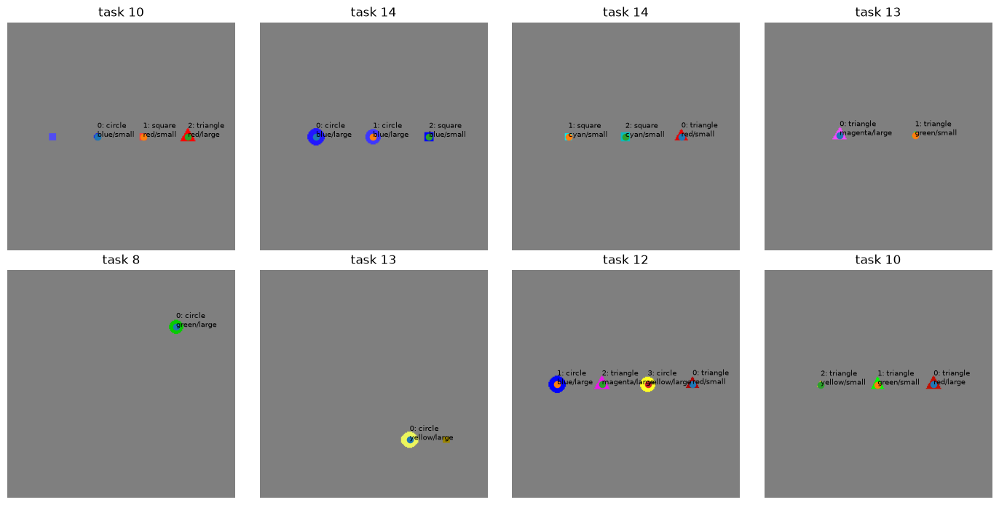

In [12]:
sample = splits["train"].sample(
    8,
    random_state=SEED,
)

fig, axes = plt.subplots(
    2,
    4,
    figsize=(14, 7),
)

for ax, (_, row) in zip(
    axes.ravel(),
    sample.iterrows(),
):
    path = resolve_image_path(
        row["filename"],
        "train",
    )
    image = load_rgb(path)
    objects = extract_objects(image)

    ax.imshow(image)

    for index, obj in enumerate(objects):
        x = obj["cx"] * image.shape[1]
        y = obj["cy"] * image.shape[0]

        ax.scatter(
            [x],
            [y],
            s=35,
        )
        ax.text(
            x,
            y,
            f"{index}: {obj['shape']}\n"
            f"{obj['color']}/{obj['size']}",
            fontsize=7,
        )

    ax.set_title(
        f"task {int(row['task_id'])}"
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

## 2. Validazione separata della percezione

Usiamo `symbol` **solo ora**, come riferimento post-hoc.

Separiamo quattro aspetti:

- correttezza del numero di oggetti;
- correttezza della forma;
- correttezza del colore;
- correttezza della dimensione.

In questo modo possiamo capire se eventuali errori dei classificatori sono dovuti alla percezione oppure alla fase di apprendimento.


In [13]:
def parse_symbol(value):
    if isinstance(value, str):
        return ast.literal_eval(value)
    return value

def flatten_symbol_objects(node):
    if isinstance(node, dict):
        if {"shape", "color", "size"}.issubset(node.keys()):
            return [{
                "shape": node["shape"],
                "color": node["color"],
                "size": node["size"],
            }]

        result = []
        for value in node.values():
            if isinstance(value, (dict, list)):
                result.extend(
                    flatten_symbol_objects(value)
                )
        return result

    if isinstance(node, list):
        result = []
        for value in node:
            result.extend(
                flatten_symbol_objects(value)
            )
        return result

    return []

def multiset_accuracy(predicted, truth, key):
    pred_values = sorted(
        obj[key] for obj in predicted
    )
    true_values = sorted(
        obj[key] for obj in truth
    )

    if len(pred_values) != len(true_values):
        return np.nan

    if not true_values:
        return float(not pred_values)

    return float(
        np.mean(
            np.asarray(pred_values)
            == np.asarray(true_values)
        )
    )

diagnostic_rows = []

for split, frame in splits.items():
    for _, row in frame.iterrows():
        image = load_rgb(
            resolve_image_path(
                row["filename"],
                split,
            )
        )

        predicted = extract_objects(image)
        truth = flatten_symbol_objects(
            parse_symbol(row["symbol"])
        )

        diagnostic_rows.append({
            "split": split,
            "n_truth": len(truth),
            "n_detected": len(predicted),
            "count_error": abs(
                len(truth) - len(predicted)
            ),
            "count_exact": int(
                len(truth) == len(predicted)
            ),
            "shape_accuracy": multiset_accuracy(
                predicted,
                truth,
                "shape",
            ),
            "color_accuracy": multiset_accuracy(
                predicted,
                truth,
                "color",
            ),
            "size_accuracy": multiset_accuracy(
                predicted,
                truth,
                "size",
            ),
        })

diagnostic_df = pd.DataFrame(
    diagnostic_rows
)

diagnostic_summary = (
    diagnostic_df
    .groupby("split")
    .agg(
        mean_truth=("n_truth", "mean"),
        mean_detected=("n_detected", "mean"),
        mae_count=("count_error", "mean"),
        count_exact=("count_exact", "mean"),
        shape_accuracy=("shape_accuracy", "mean"),
        color_accuracy=("color_accuracy", "mean"),
        size_accuracy=("size_accuracy", "mean"),
    )
    .round(3)
)

display(diagnostic_summary)

,mean_truth,mean_detected,mae_count,count_exact,shape_accuracy,color_accuracy,size_accuracy
split,,,,,,,
test,2.068,1.824,0.244,0.788,0.945,1.0,0.911
train,2.065,1.808,0.257,0.772,0.948,1.0,0.916
val,2.086,1.854,0.232,0.788,0.964,1.0,0.913


## 3. Costruzione delle feature percettive

Dopo aver controllato la qualità della percezione, trasformiamo ogni immagine in un vettore di feature interpretabili.

Le feature descrivono:

- numero totale di oggetti;
- conteggio delle forme;
- posizione media delle forme;
- conteggio dei colori;
- conteggio delle dimensioni;
- posizione media globale;
- dispersione spaziale globale.

Nessuna feature contiene il nome o la soluzione di una specifica task.


In [14]:
def perceptual_features(image):
    objects = extract_objects(image)
    features = {
        "n_objects": len(objects),
    }

    for shape in SHAPES:
        subset = [
            obj
            for obj in objects
            if obj["shape"] == shape
        ]

        features[f"count_shape_{shape}"] = len(subset)

        features[f"mean_x_{shape}"] = (
            float(
                np.mean(
                    [obj["cx"] for obj in subset]
                )
            )
            if subset
            else 0.5
        )

        features[f"mean_y_{shape}"] = (
            float(
                np.mean(
                    [obj["cy"] for obj in subset]
                )
            )
            if subset
            else 0.5
        )

    for color in COLORS:
        features[f"count_color_{color}"] = sum(
            obj["color"] == color
            for obj in objects
        )

    for size in SIZES:
        features[f"count_size_{size}"] = sum(
            obj["size"] == size
            for obj in objects
        )

    xs = np.asarray(
        [obj["cx"] for obj in objects],
        dtype=float,
    )
    ys = np.asarray(
        [obj["cy"] for obj in objects],
        dtype=float,
    )

    features["mean_x_all"] = (
        float(xs.mean()) if len(xs) else 0.5
    )
    features["mean_y_all"] = (
        float(ys.mean()) if len(ys) else 0.5
    )
    features["std_x_all"] = (
        float(xs.std()) if len(xs) else 0.0
    )
    features["std_y_all"] = (
        float(ys.std()) if len(ys) else 0.0
    )

    return features, objects

cache = {}
rows = []

for split, frame in splits.items():
    print("Estrazione:", split)

    for _, row in frame.iterrows():
        path = resolve_image_path(
            row["filename"],
            split,
        )
        key = str(path.resolve())

        if key not in cache:
            image = load_rgb(path)
            cache[key] = perceptual_features(image)

        feature_dict, objects = cache[key]

        record = dict(feature_dict)
        record.update({
            "_path": key,
            "split": split,
            "filename": row["filename"],
            "task_id": int(row["task_id"]),
            "label": int(row["label"]),
            "supervised": int(row["supervised"]),
            "_n_detected_objects": len(objects),
        })

        rows.append(record)

features_df = pd.DataFrame(rows)

print(
    "Tabella delle feature:",
    features_df.shape,
)

display(
    features_df
    .groupby("split")["_n_detected_objects"]
    .agg(["mean", "median", "max"])
    .round(2)
)

Estrazione: train
Estrazione: val
Estrazione: test
Tabella delle feature: (2000, 29)


,mean,median,max
split,,,
test,1.82,1.0,6
train,1.81,1.0,6
val,1.85,1.0,6


## 4. Relazioni spaziali generiche

Aggiungiamo una seconda rappresentazione che considera le **coppie di oggetti**.

Le relazioni sono volutamente generiche e indipendenti dalla task:

- sinistra/destra;
- sopra/sotto;
- diagonale;
- stessa forma;
- stesso colore;
- stessa dimensione;
- allineamento orizzontale;
- allineamento verticale;
- vicinanza.

Il modello non riceve mai una feature che rappresenti direttamente una regola KANDY, come `house`, `traffic_light` o `red_triangle_on_right`.


In [15]:
def relation_features(objects):
    output = {
        "pair_left_right": 0,
        "pair_above_below": 0,
        "pair_diagonal": 0,
        "pair_same_shape": 0,
        "pair_same_color": 0,
        "pair_same_size": 0,
        "pair_horiz_aligned": 0,
        "pair_vert_aligned": 0,
        "pair_close": 0,
    }

    n = len(objects)

    for i in range(n):
        for j in range(i + 1, n):
            a = objects[i]
            b = objects[j]

            dx = b["cx"] - a["cx"]
            dy = b["cy"] - a["cy"]

            abs_dx = abs(dx)
            abs_dy = abs(dy)

            output["pair_left_right"] += int(
                abs_dx > 0.12
            )
            output["pair_above_below"] += int(
                abs_dy > 0.12
            )
            output["pair_diagonal"] += int(
                abs_dx > 0.12
                and abs_dy > 0.12
                and abs(abs_dx - abs_dy) < 0.20
            )
            output["pair_same_shape"] += int(
                a["shape"] == b["shape"]
            )
            output["pair_same_color"] += int(
                a["color"] == b["color"]
            )
            output["pair_same_size"] += int(
                a["size"] == b["size"]
            )
            output["pair_horiz_aligned"] += int(
                abs_dy < 0.12
            )
            output["pair_vert_aligned"] += int(
                abs_dx < 0.12
            )
            output["pair_close"] += int(
                math.hypot(dx, dy) < 0.25
            )

    return output

relational_rows = []

for key, (_, objects) in cache.items():
    relational_rows.append({
        "_path": key,
        **relation_features(objects),
    })

relational_df = pd.DataFrame(
    relational_rows
)

features_df = features_df.merge(
    relational_df,
    on="_path",
    how="left",
)

print(
    "Numero finale di colonne:",
    features_df.shape[1],
)

Numero finale di colonne: 38


In [16]:
META = {
    "_path",
    "split",
    "filename",
    "task_id",
    "label",
    "supervised",
    "_n_detected_objects",
}

ALL_FEATURES = [
    column
    for column in features_df.columns
    if column not in META
]

PERCEPTUAL_FEATURES = [
    column
    for column in ALL_FEATURES
    if not column.startswith("pair_")
]

RELATIONAL_FEATURES = [
    column
    for column in ALL_FEATURES
    if column.startswith("pair_")
]

BANNED = [
    column
    for column in ALL_FEATURES
    if any(
        key in column.lower()
        for key in [
            "red_triangle",
            "triangle_square",
            "circle_with_red_triangle",
            "blue_with_red_triangle",
            "traffic_light",
            "palindrome",
            "house",
            "wagon",
            "tower",
            "car",
        ]
    )
]

print(
    "Feature percettive:",
    len(PERCEPTUAL_FEATURES),
)
print(
    "Feature relazionali:",
    len(RELATIONAL_FEATURES),
)
print(
    "Feature specifiche di task:",
    BANNED,
)

assert not BANNED
assert "symbol" not in ALL_FEATURES

Feature percettive: 22
Feature relazionali: 9
Feature specifiche di task: []


## 5. Addestramento e valutazione

Per ciascuna delle 20 task:

1. utilizziamo il training set;
2. confrontiamo Logistic Regression e Decision Tree sul validation set;
3. scegliamo il modello con il miglior F1 di validation;
4. valutiamo il modello scelto una sola volta sul test set.

Effettuiamo l'esperimento due volte:

- con sole feature percettive;
- con feature percettive + relazioni generiche.

La selezione del modello avviene task per task.


In [17]:
def metrics(y_true, y_pred):
    precision, recall, f1, _ = (
        precision_recall_fscore_support(
            y_true,
            y_pred,
            average="binary",
            zero_division=0,
        )
    )

    return {
        "accuracy": accuracy_score(
            y_true,
            y_pred,
        ),
        "precision": precision,
        "recall": recall,
        "f1": f1,
    }

def run_experiment(feature_columns):
    factories = {
        "logistic": lambda: Pipeline([
            (
                "scale",
                StandardScaler(),
            ),
            (
                "clf",
                LogisticRegression(
                    max_iter=2000,
                    class_weight="balanced",
                    random_state=SEED,
                ),
            ),
        ]),
        "tree": lambda: DecisionTreeClassifier(
            max_depth=5,
            min_samples_leaf=4,
            class_weight="balanced",
            random_state=SEED,
        ),
    }

    result_rows = []
    fitted_models = {}

    for task_id in range(20):
        train = features_df[
            (features_df["split"] == "train")
            & (features_df["task_id"] == task_id)
            & (features_df["supervised"] == 1)
        ]

        validation = features_df[
            (features_df["split"] == "val")
            & (features_df["task_id"] == task_id)
        ]

        test = features_df[
            (features_df["split"] == "test")
            & (features_df["task_id"] == task_id)
        ]

        if (
            len(train) == 0
            or train["label"].nunique() < 2
        ):
            continue

        best_name = None
        best_model = None
        best_val_f1 = -1.0

        for name, factory in factories.items():
            model = factory()
            model.fit(
                train[feature_columns],
                train["label"],
            )

            val_prediction = model.predict(
                validation[feature_columns]
            )

            val_f1 = f1_score(
                validation["label"],
                val_prediction,
                zero_division=0,
            )

            if val_f1 > best_val_f1:
                best_name = name
                best_model = model
                best_val_f1 = val_f1

        test_prediction = best_model.predict(
            test[feature_columns]
        )

        row = {
            "task_id": task_id,
            "task": TASK_NAMES[task_id],
            "model": best_name,
            "val_f1": best_val_f1,
        }
        row.update(
            metrics(
                test["label"],
                test_prediction,
            )
        )

        result_rows.append(row)
        fitted_models[task_id] = best_model

    return (
        pd.DataFrame(result_rows),
        fitted_models,
    )

results_perc, models_perc = run_experiment(
    PERCEPTUAL_FEATURES
)

results_all, models_all = run_experiment(
    ALL_FEATURES
)

display(
    results_perc.sort_values("task_id")
)

display(
    results_all.sort_values("task_id")
)

,task_id,task,model,val_f1,accuracy,precision,recall,f1
0,0,triangle vs any,logistic,0.880000,0.96,1.000000,0.857143,0.923077
1,1,square vs any,logistic,0.880000,0.84,0.857143,0.666667,0.750000
2,2,circle vs any,logistic,0.823529,0.84,0.857143,0.857143,0.857143
3,3,red vs any,logistic,0.933333,1.00,1.000000,1.000000,1.000000
4,4,green vs any,logistic,0.833333,0.80,0.583333,1.000000,0.736842
5,5,blue vs any,logistic,0.750000,0.96,0.923077,1.000000,0.960000
6,6,cyan vs any,logistic,1.000000,1.00,1.000000,1.000000,1.000000
7,7,magenta vs any,logistic,0.909091,0.96,1.000000,0.857143,0.923077
8,8,yellow vs any,logistic,0.952381,0.96,0.833333,1.000000,0.909091
9,9,red triangle on the right,logistic,0.900000,0.80,0.636364,0.875000,0.736842


,task_id,task,model,val_f1,accuracy,precision,recall,f1
0,0,triangle vs any,logistic,0.880000,0.96,1.000000,0.857143,0.923077
1,1,square vs any,logistic,0.880000,0.84,0.857143,0.666667,0.750000
2,2,circle vs any,logistic,0.823529,0.84,0.857143,0.857143,0.857143
3,3,red vs any,logistic,0.933333,1.00,1.000000,1.000000,1.000000
4,4,green vs any,logistic,0.833333,0.80,0.583333,1.000000,0.736842
5,5,blue vs any,logistic,0.750000,0.96,0.923077,1.000000,0.960000
6,6,cyan vs any,logistic,1.000000,1.00,1.000000,1.000000,1.000000
7,7,magenta vs any,logistic,0.909091,0.96,1.000000,0.857143,0.923077
8,8,yellow vs any,logistic,0.952381,0.96,0.833333,1.000000,0.909091
9,9,red triangle on the right,logistic,0.900000,0.84,0.666667,1.000000,0.800000


## 6. EBM

L'**Explainable Boosting Machine (EBM)** è un modello interpretabile basato su funzioni additive.


In [18]:
try:
    from interpret.glassbox import (
        ExplainableBoostingClassifier,
    )

    ebm_available = True

except Exception:
    ebm_available = False
    print(
        "EBM non disponibile: installa `interpret` "
        "per eseguire il confronto opzionale."
    )

results_ebm = pd.DataFrame()
models_ebm = {}

if ebm_available:
    ebm_rows = []

    for task_id in range(20):
        train = features_df[
            (features_df["split"] == "train")
            & (features_df["task_id"] == task_id)
            & (features_df["supervised"] == 1)
        ]

        validation = features_df[
            (features_df["split"] == "val")
            & (features_df["task_id"] == task_id)
        ]

        test = features_df[
            (features_df["split"] == "test")
            & (features_df["task_id"] == task_id)
        ]

        if train["label"].nunique() < 2:
            continue

        model = ExplainableBoostingClassifier(
            interactions=5,
            max_bins=32,
            max_rounds=400,
            learning_rate=0.03,
            random_state=SEED,
        )

        model.fit(
            train[ALL_FEATURES],
            train["label"],
        )

        validation_prediction = model.predict(
            validation[ALL_FEATURES]
        )

        test_prediction = model.predict(
            test[ALL_FEATURES]
        )

        models_ebm[task_id] = model

        row = {
            "task_id": task_id,
            "task": TASK_NAMES[task_id],
            "val_f1": f1_score(
                validation["label"],
                validation_prediction,
                zero_division=0,
            ),
        }

        row.update(
            metrics(
                test["label"],
                test_prediction,
            )
        )

        ebm_rows.append(row)

    results_ebm = pd.DataFrame(ebm_rows)

    display(
        results_ebm.sort_values("task_id")
    )

,task_id,task,val_f1,accuracy,precision,recall,f1
0,0,triangle vs any,0.880000,0.96,1.000000,0.857143,0.923077
1,1,square vs any,0.880000,0.84,0.857143,0.666667,0.750000
2,2,circle vs any,0.823529,0.84,0.857143,0.857143,0.857143
3,3,red vs any,0.933333,1.00,1.000000,1.000000,1.000000
4,4,green vs any,0.947368,0.96,1.000000,0.857143,0.923077
5,5,blue vs any,0.909091,0.88,1.000000,0.750000,0.857143
6,6,cyan vs any,1.000000,1.00,1.000000,1.000000,1.000000
7,7,magenta vs any,0.909091,0.96,1.000000,0.857143,0.923077
8,8,yellow vs any,0.947368,1.00,1.000000,1.000000,1.000000
9,9,red triangle on the right,0.818182,0.80,0.636364,0.875000,0.736842


Salvataggio grafici in:
/home/cosimo/Downloads/kandy-xai/results/interpretable_models/plots


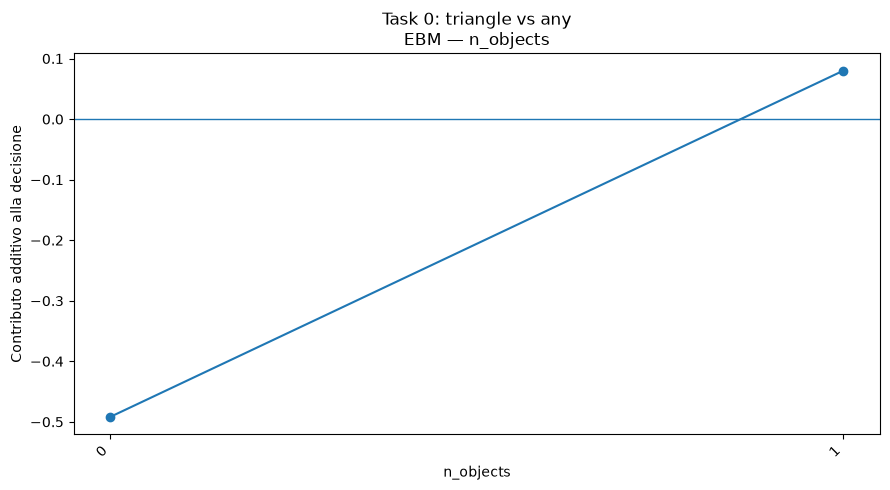

Salvato: ../results/interpretable_models/plots/task_0_ebm_n_objects.png


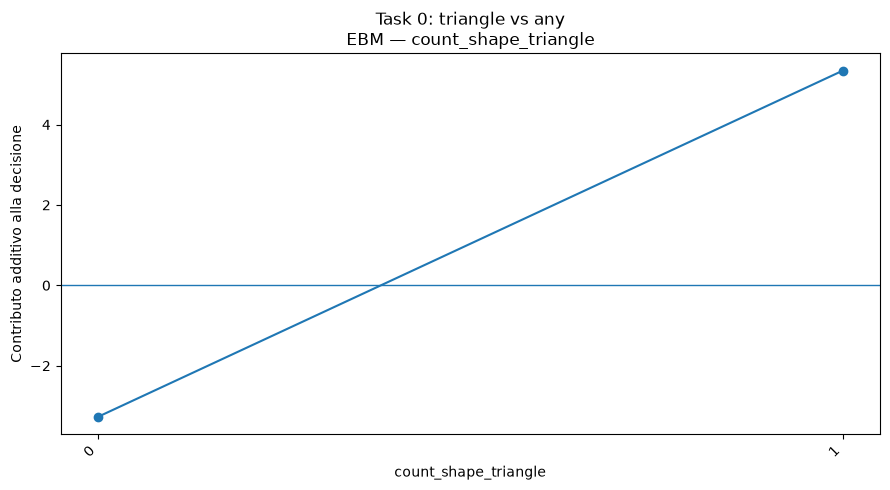

Salvato: ../results/interpretable_models/plots/task_0_ebm_count_shape_triangle.png


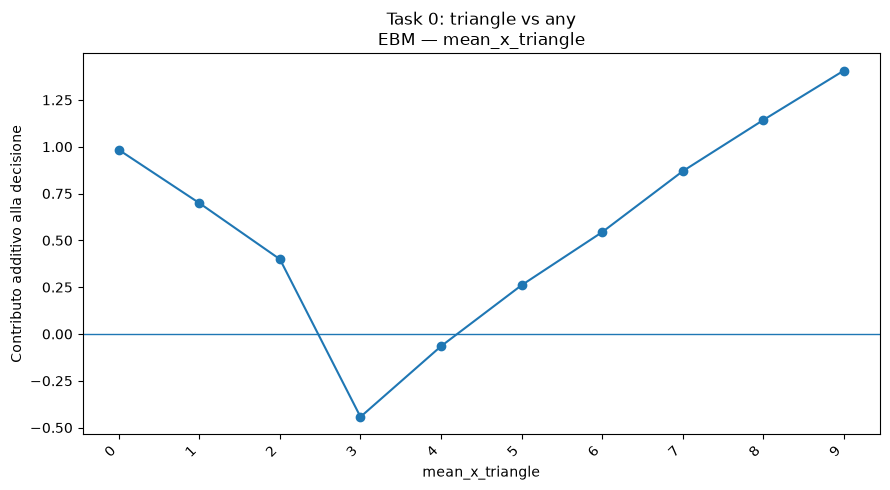

Salvato: ../results/interpretable_models/plots/task_0_ebm_mean_x_triangle.png


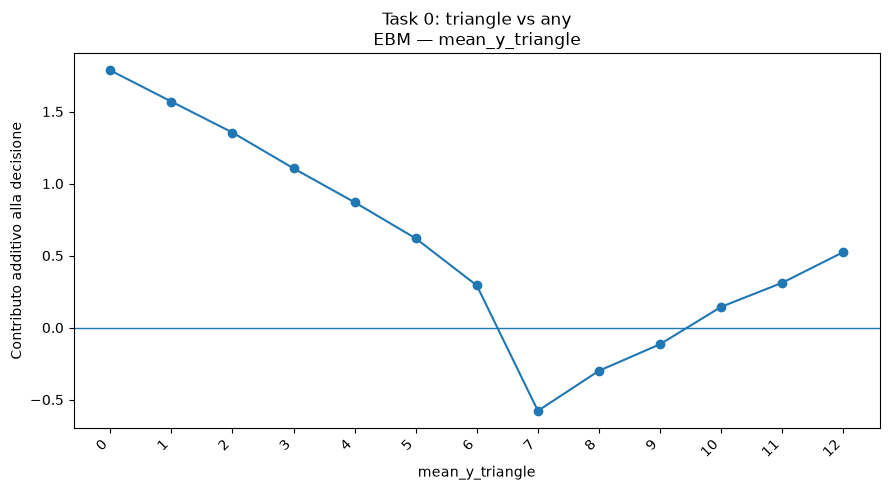

Salvato: ../results/interpretable_models/plots/task_0_ebm_mean_y_triangle.png


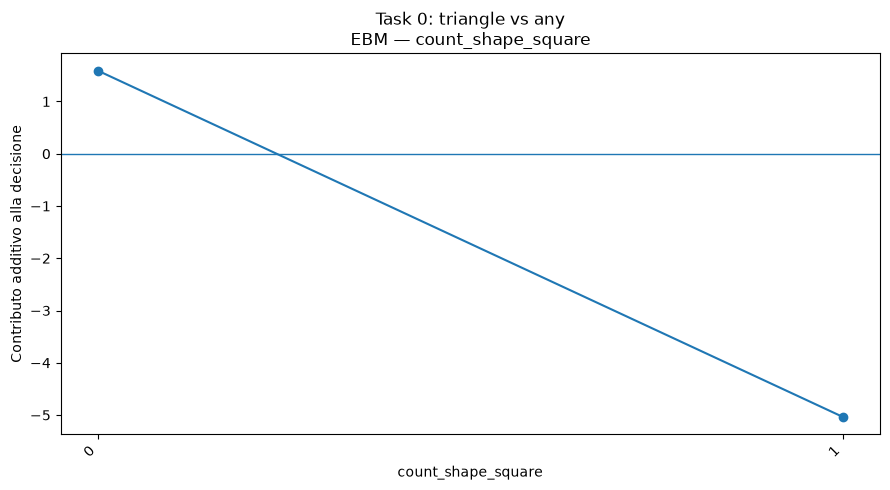

Salvato: ../results/interpretable_models/plots/task_0_ebm_count_shape_square.png


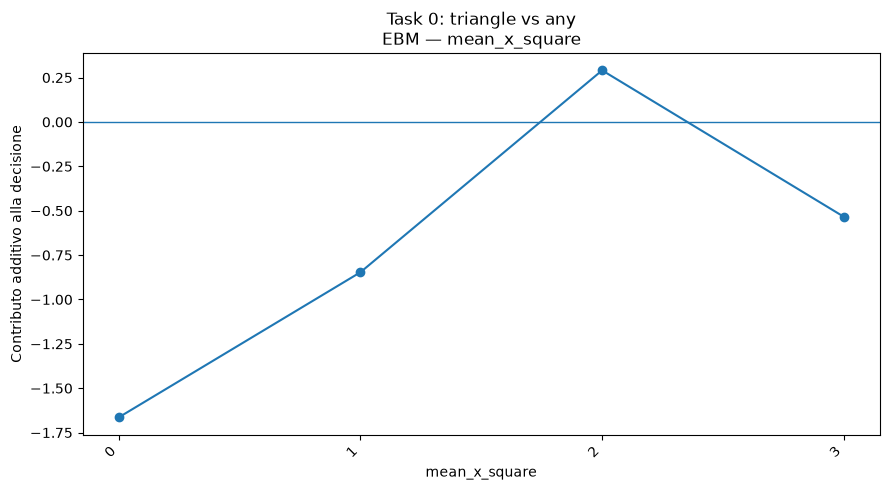

Salvato: ../results/interpretable_models/plots/task_0_ebm_mean_x_square.png


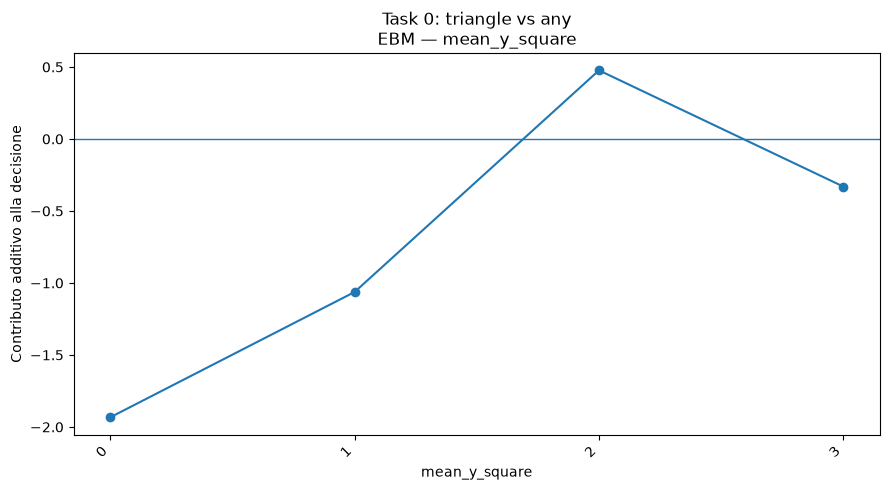

Salvato: ../results/interpretable_models/plots/task_0_ebm_mean_y_square.png


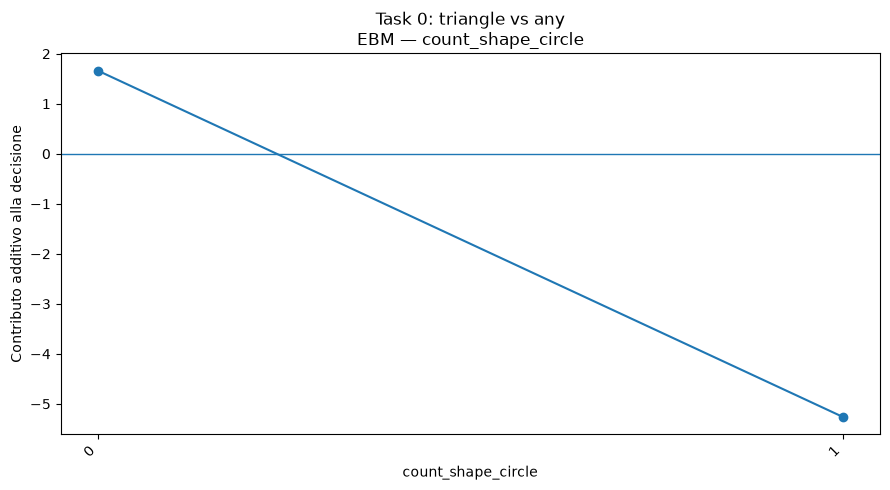

Salvato: ../results/interpretable_models/plots/task_0_ebm_count_shape_circle.png


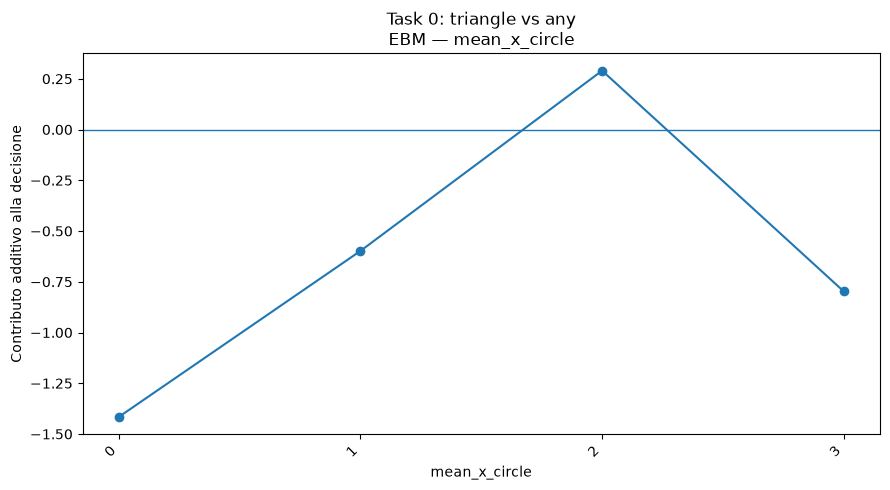

Salvato: ../results/interpretable_models/plots/task_0_ebm_mean_x_circle.png


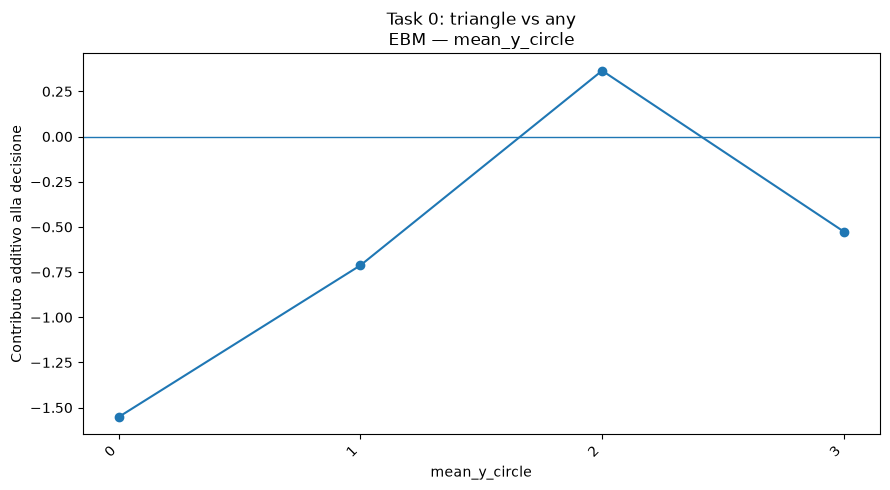

Salvato: ../results/interpretable_models/plots/task_0_ebm_mean_y_circle.png


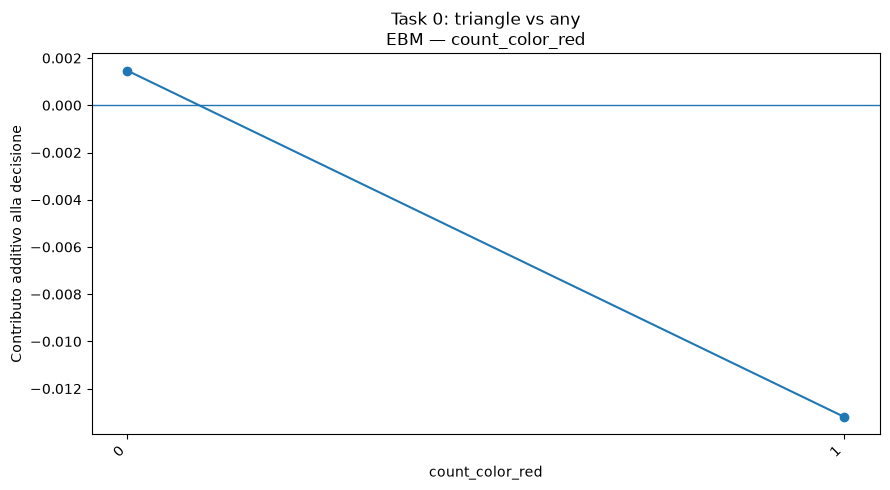

Salvato: ../results/interpretable_models/plots/task_0_ebm_count_color_red.png


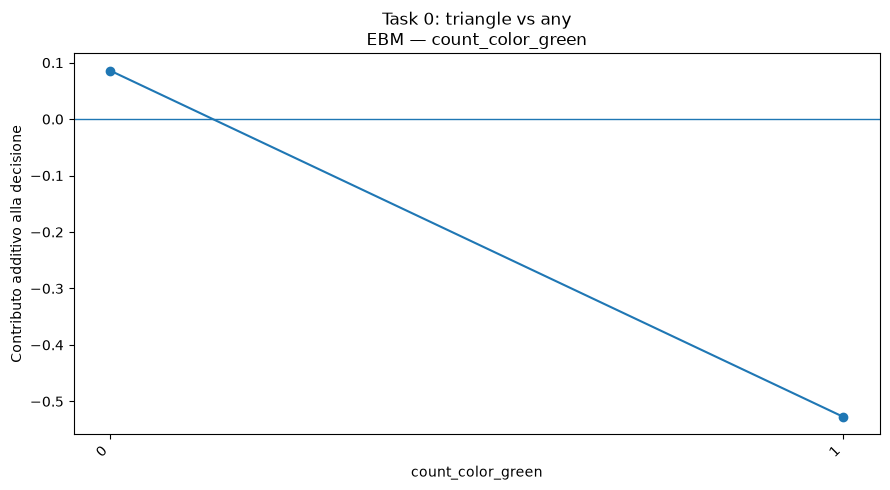

Salvato: ../results/interpretable_models/plots/task_0_ebm_count_color_green.png


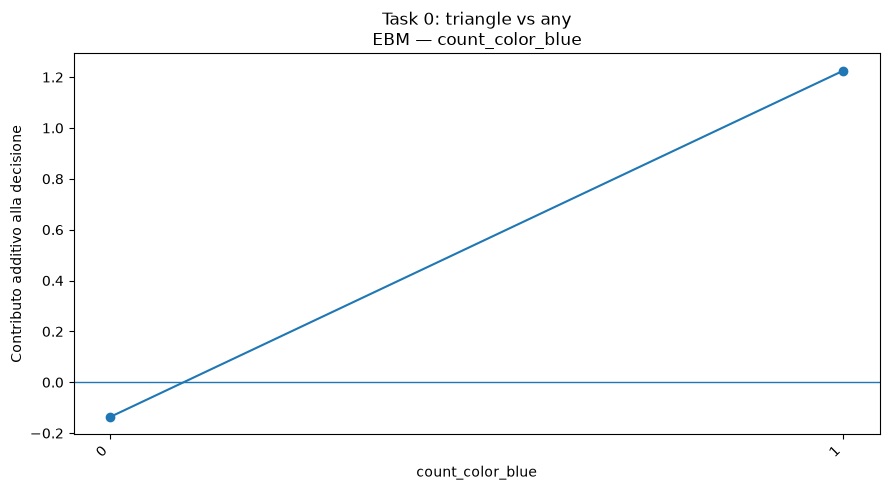

Salvato: ../results/interpretable_models/plots/task_0_ebm_count_color_blue.png


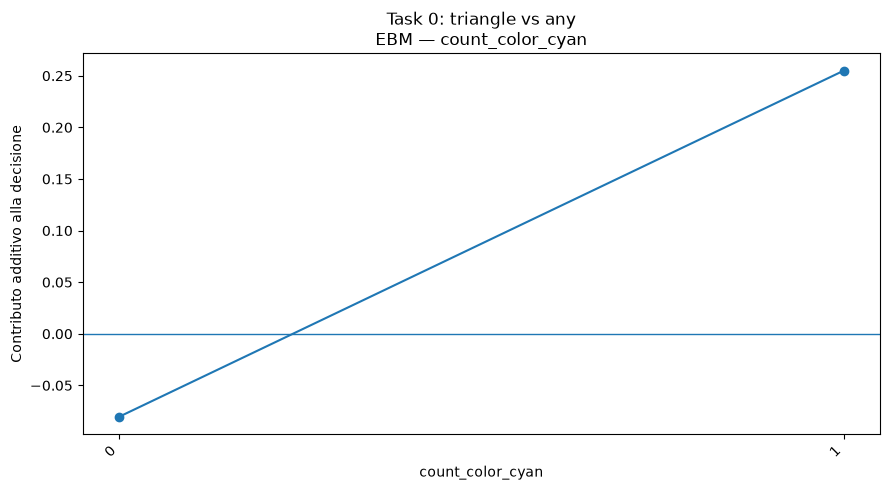

Salvato: ../results/interpretable_models/plots/task_0_ebm_count_color_cyan.png


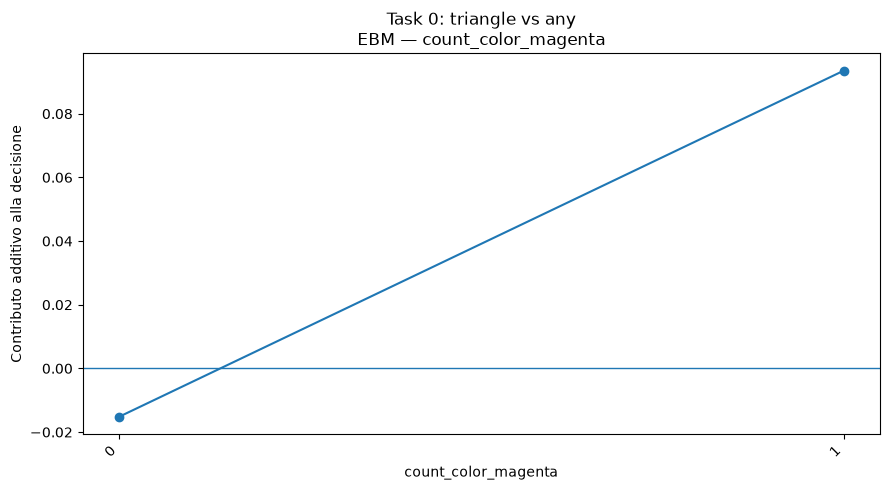

Salvato: ../results/interpretable_models/plots/task_0_ebm_count_color_magenta.png


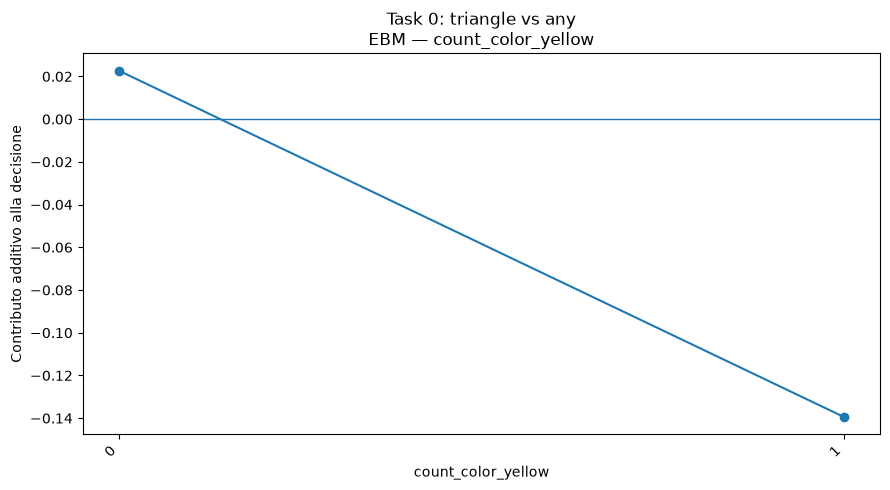

Salvato: ../results/interpretable_models/plots/task_0_ebm_count_color_yellow.png


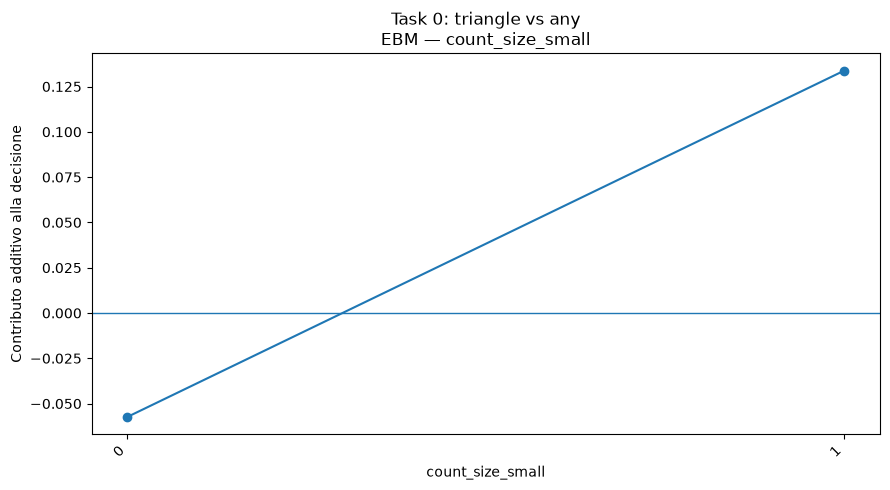

Salvato: ../results/interpretable_models/plots/task_0_ebm_count_size_small.png


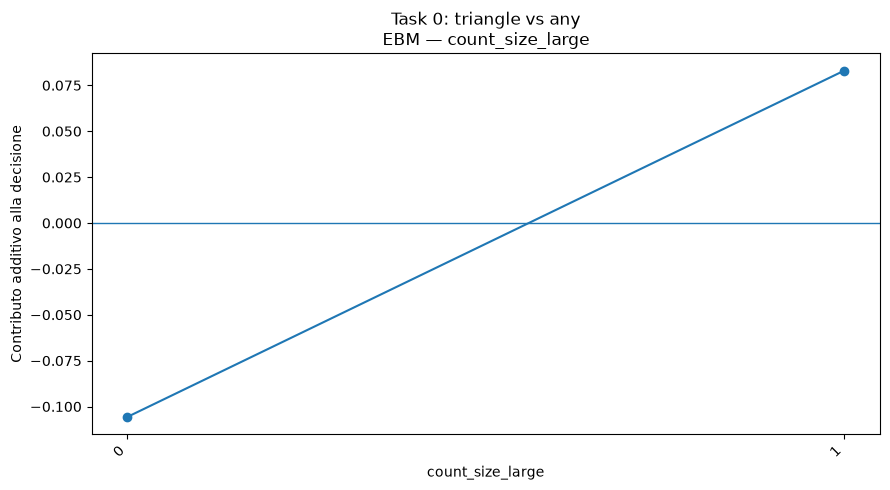

Salvato: ../results/interpretable_models/plots/task_0_ebm_count_size_large.png


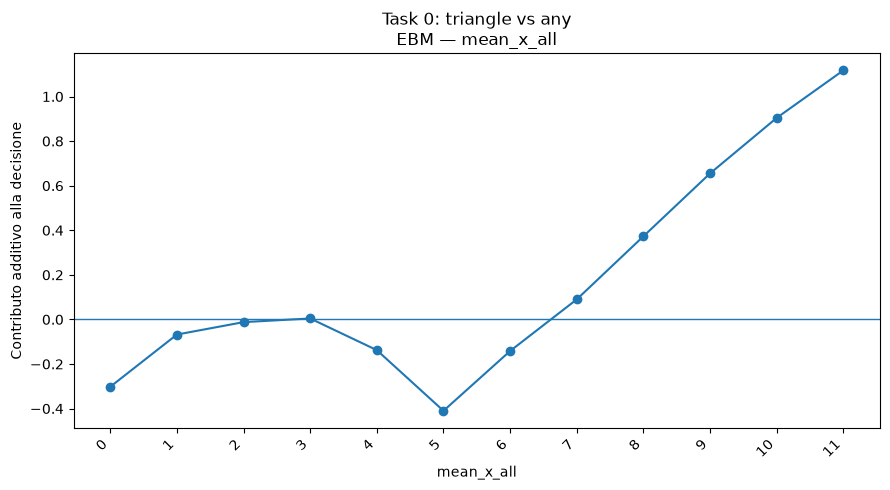

Salvato: ../results/interpretable_models/plots/task_0_ebm_mean_x_all.png


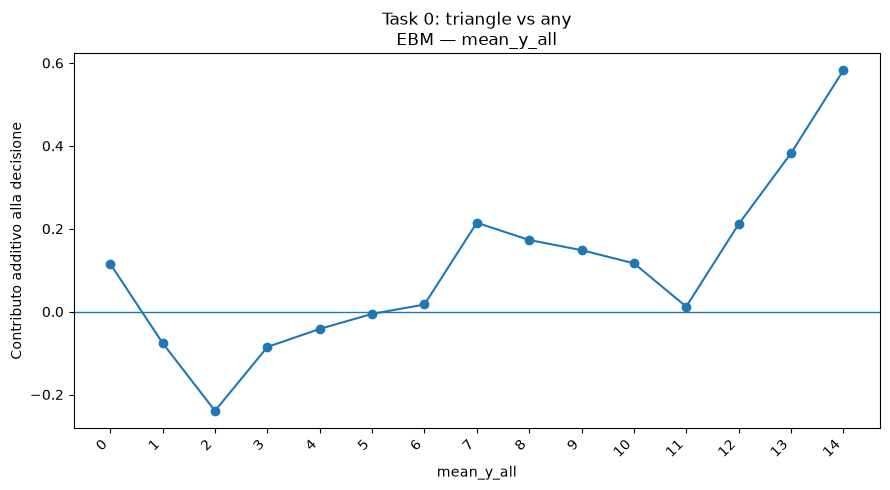

Salvato: ../results/interpretable_models/plots/task_0_ebm_mean_y_all.png


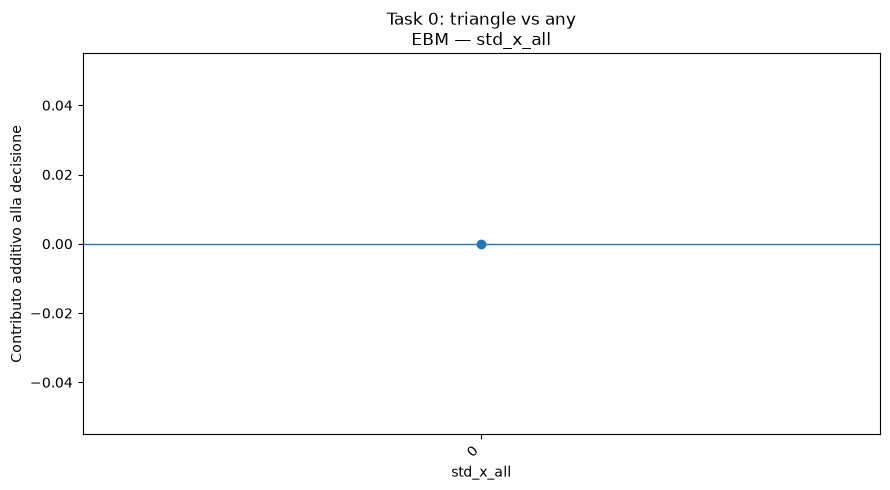

Salvato: ../results/interpretable_models/plots/task_0_ebm_std_x_all.png


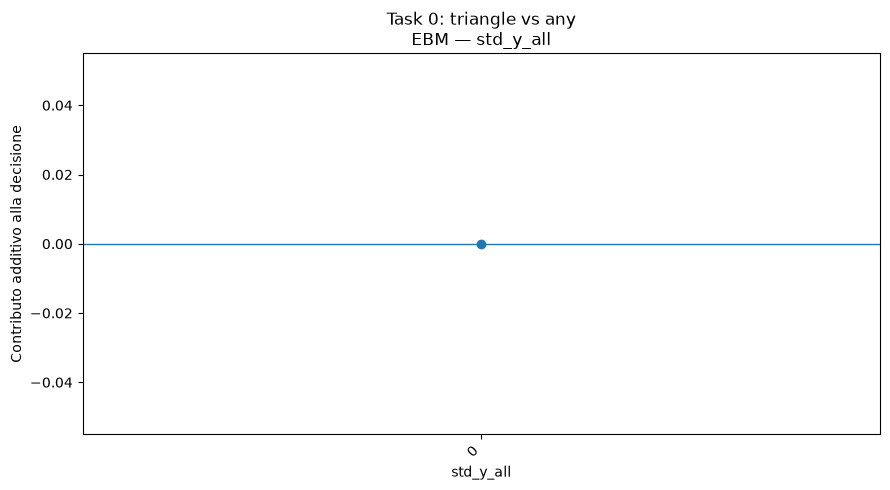

Salvato: ../results/interpretable_models/plots/task_0_ebm_std_y_all.png


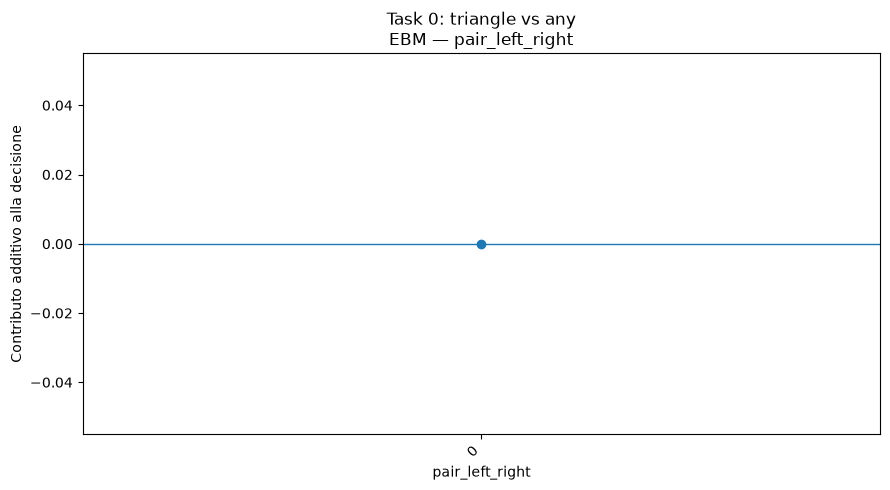

Salvato: ../results/interpretable_models/plots/task_0_ebm_pair_left_right.png


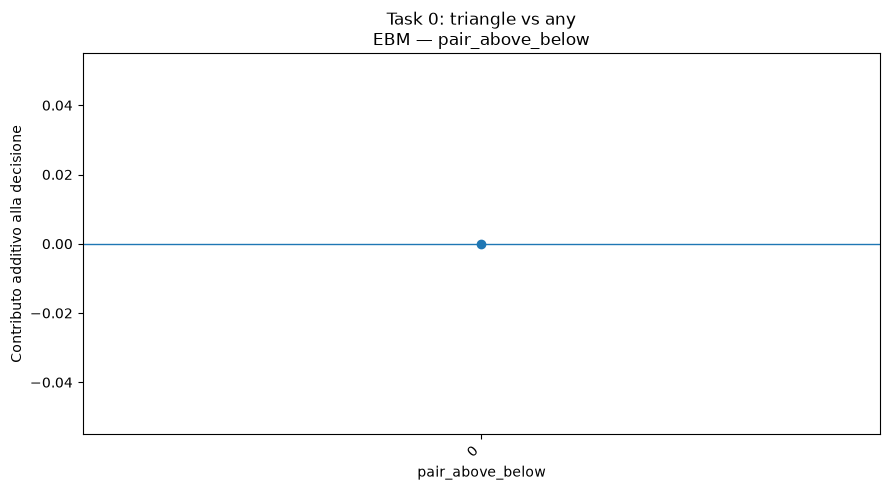

Salvato: ../results/interpretable_models/plots/task_0_ebm_pair_above_below.png


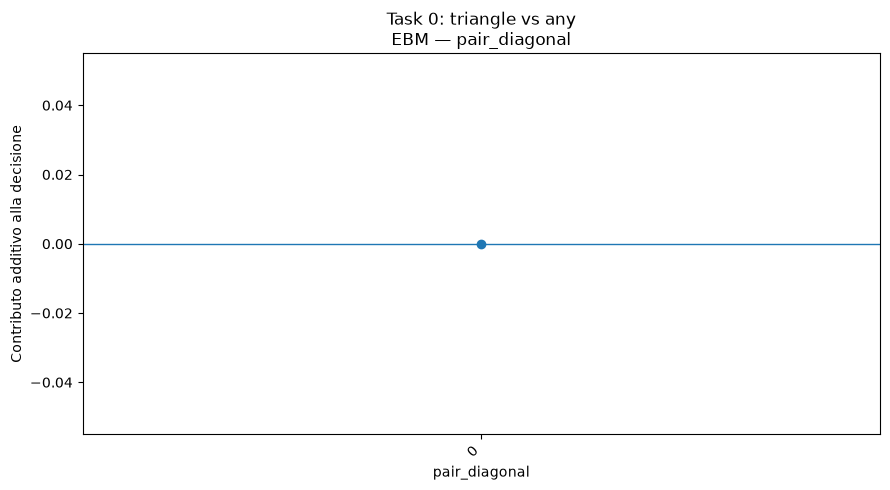

Salvato: ../results/interpretable_models/plots/task_0_ebm_pair_diagonal.png


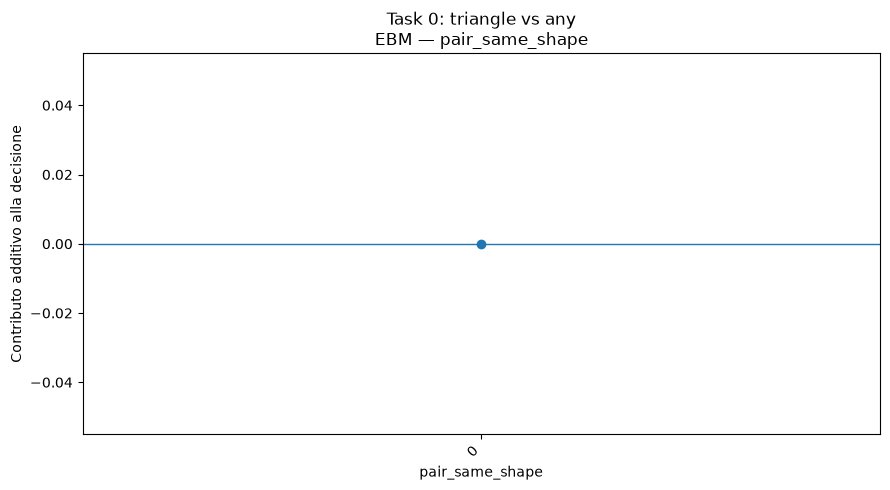

Salvato: ../results/interpretable_models/plots/task_0_ebm_pair_same_shape.png


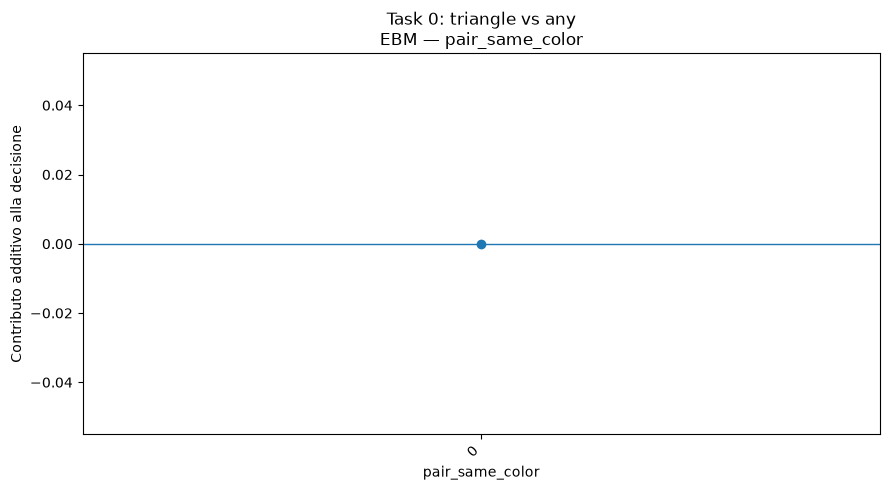

Salvato: ../results/interpretable_models/plots/task_0_ebm_pair_same_color.png


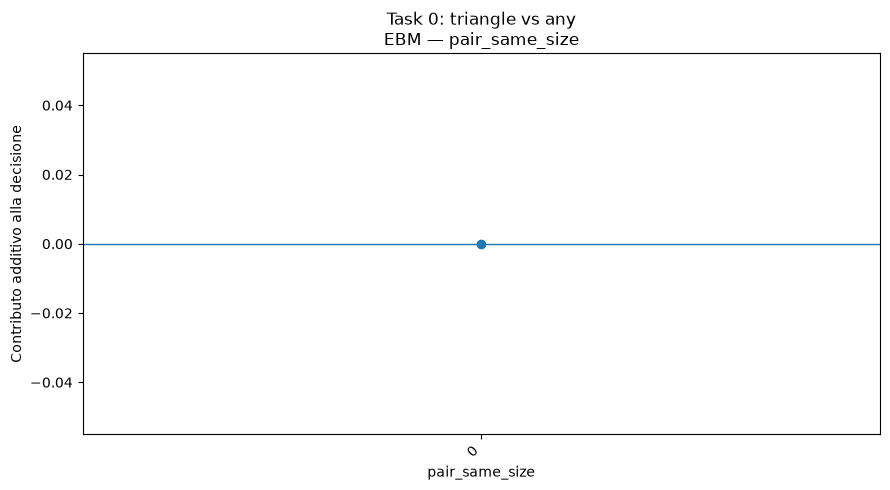

Salvato: ../results/interpretable_models/plots/task_0_ebm_pair_same_size.png


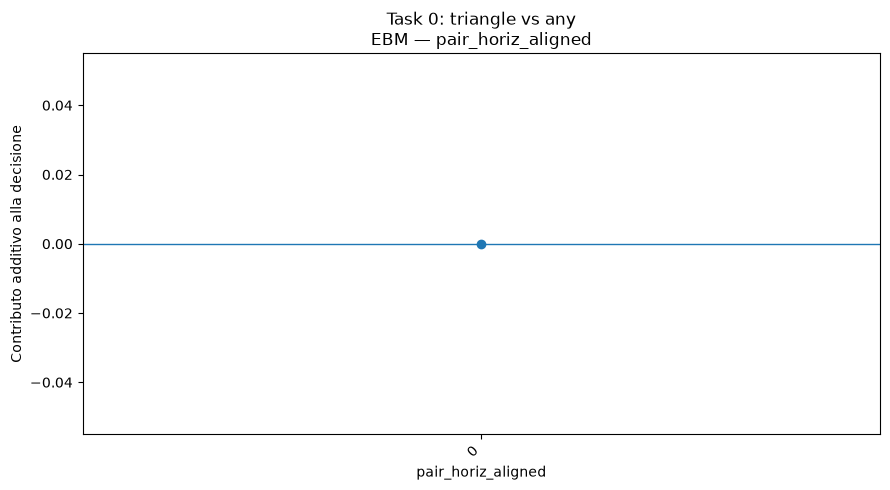

Salvato: ../results/interpretable_models/plots/task_0_ebm_pair_horiz_aligned.png


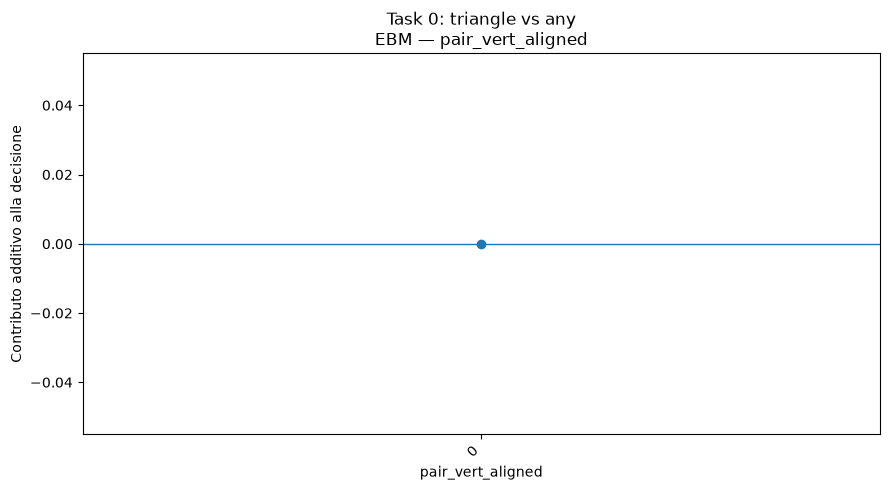

Salvato: ../results/interpretable_models/plots/task_0_ebm_pair_vert_aligned.png


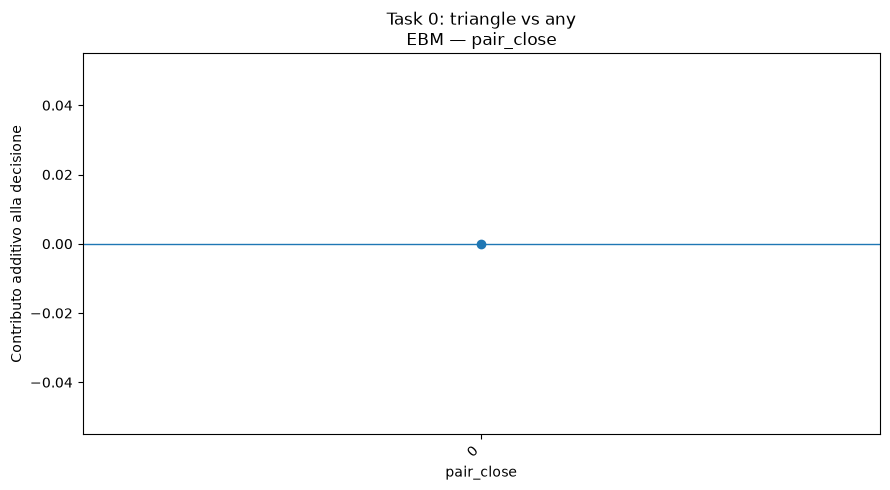

Salvato: ../results/interpretable_models/plots/task_0_ebm_pair_close.png


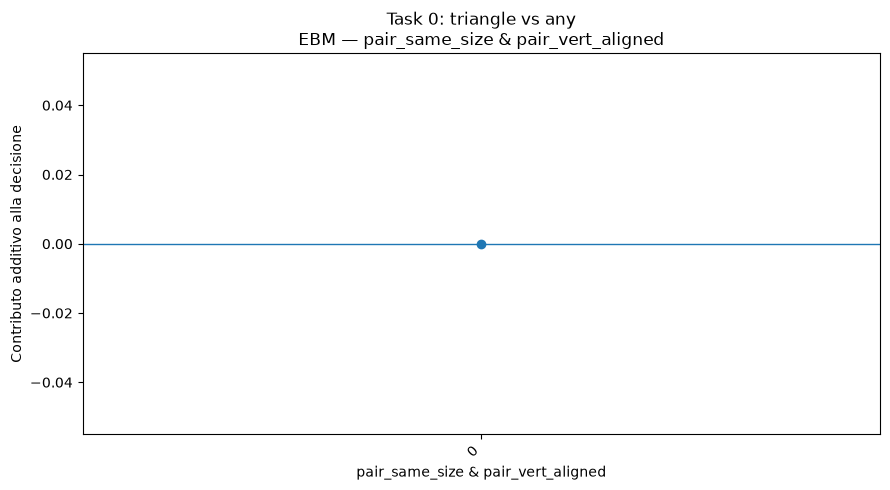

Salvato: ../results/interpretable_models/plots/task_0_ebm_pair_same_size_pair_vert_aligned.png


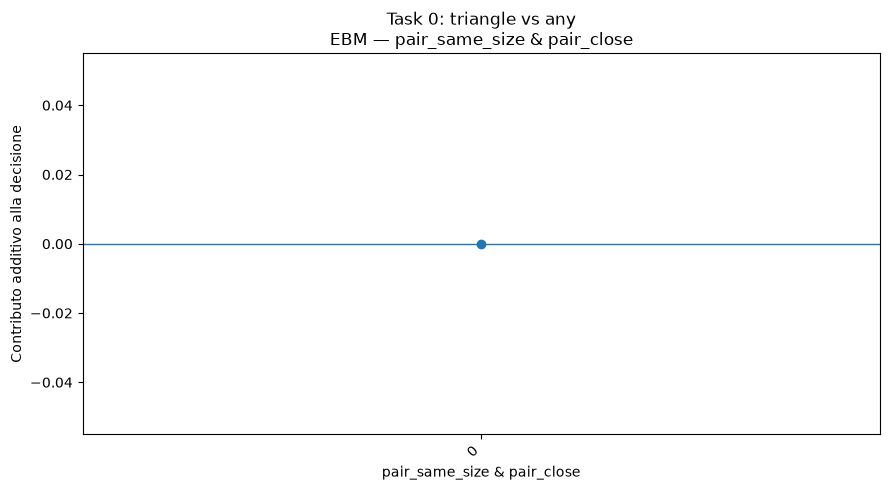

Salvato: ../results/interpretable_models/plots/task_0_ebm_pair_same_size_pair_close.png


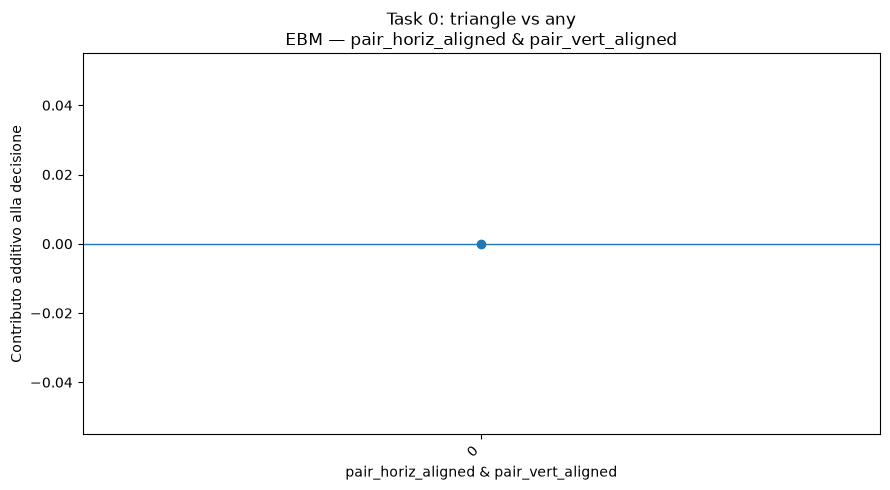

Salvato: ../results/interpretable_models/plots/task_0_ebm_pair_horiz_aligned_pair_vert_aligned.png


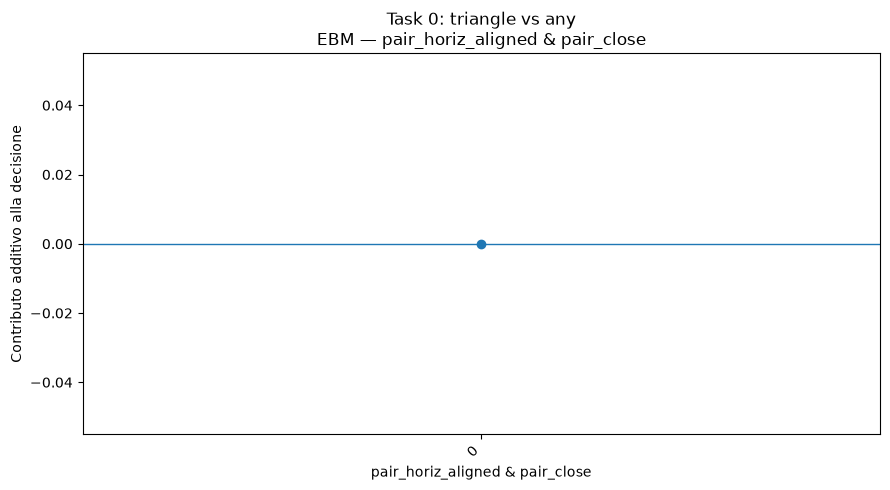

Salvato: ../results/interpretable_models/plots/task_0_ebm_pair_horiz_aligned_pair_close.png


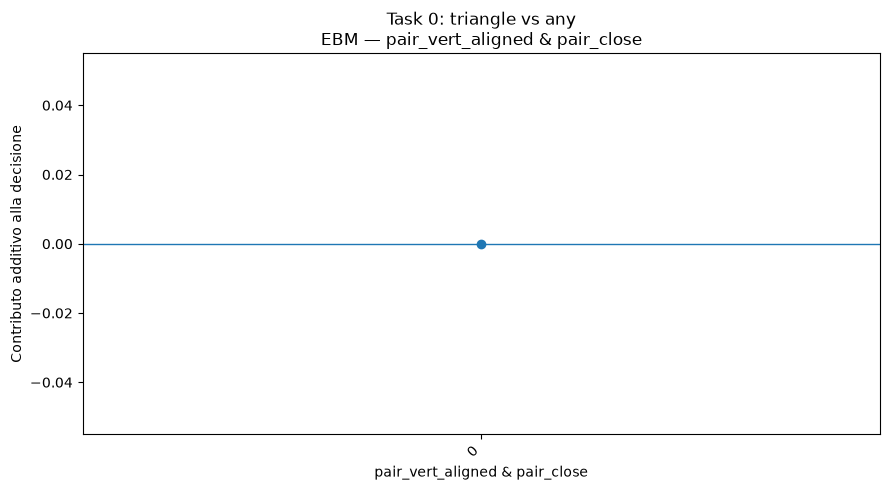

Salvato: ../results/interpretable_models/plots/task_0_ebm_pair_vert_aligned_pair_close.png


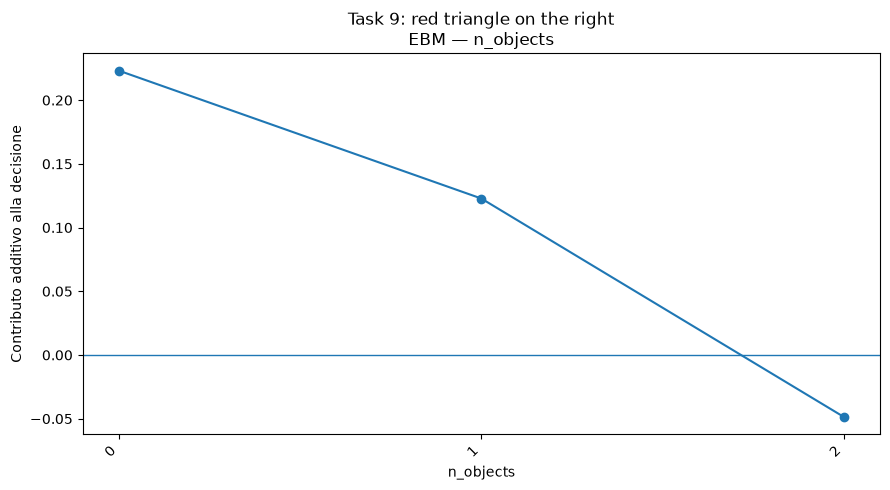

Salvato: ../results/interpretable_models/plots/task_9_ebm_n_objects.png


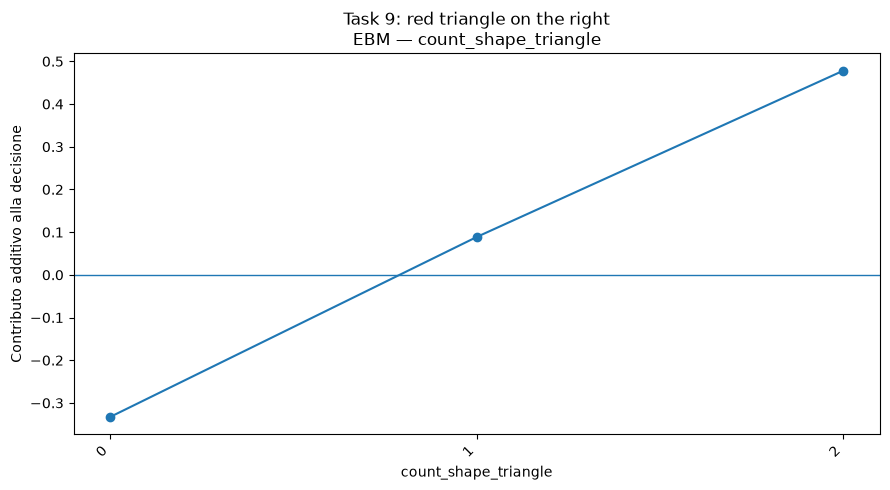

Salvato: ../results/interpretable_models/plots/task_9_ebm_count_shape_triangle.png


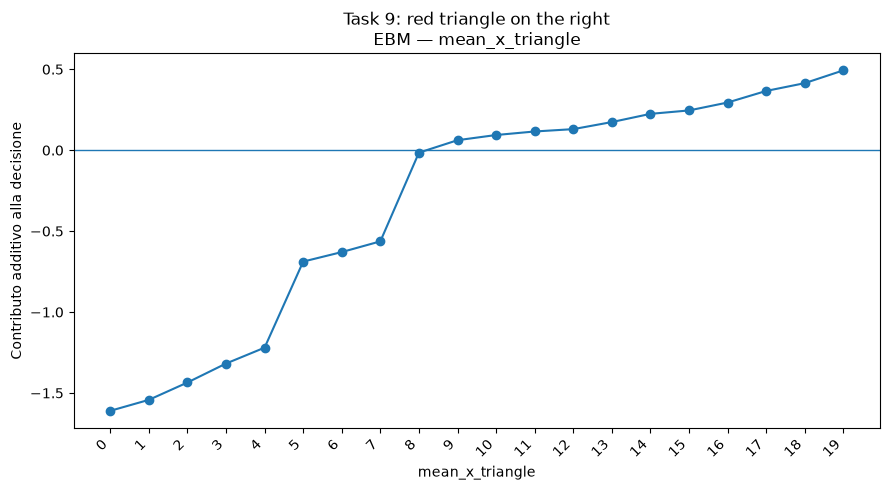

Salvato: ../results/interpretable_models/plots/task_9_ebm_mean_x_triangle.png


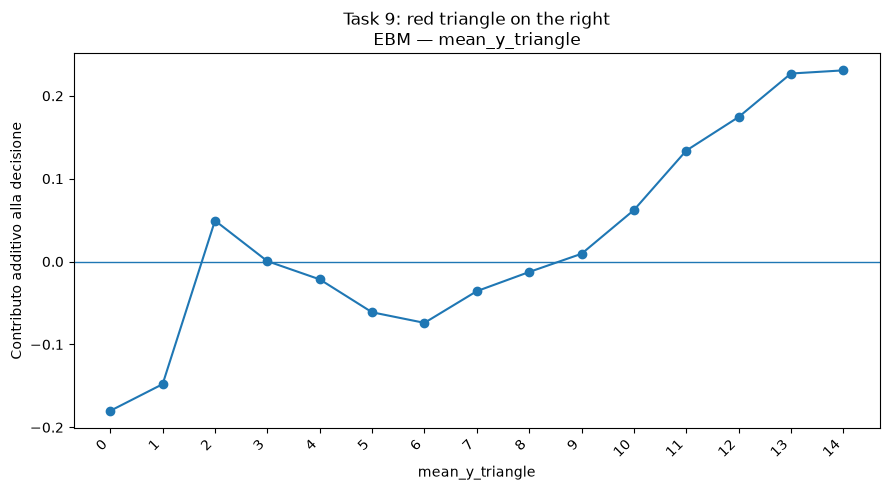

Salvato: ../results/interpretable_models/plots/task_9_ebm_mean_y_triangle.png


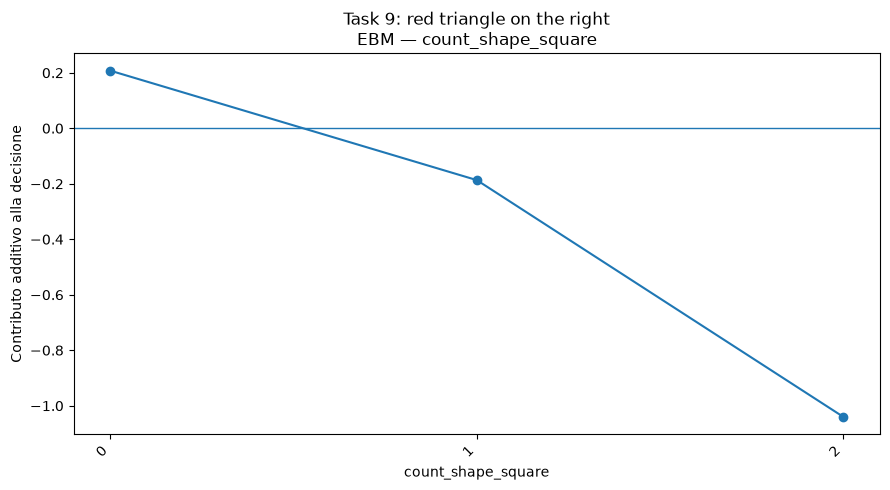

Salvato: ../results/interpretable_models/plots/task_9_ebm_count_shape_square.png


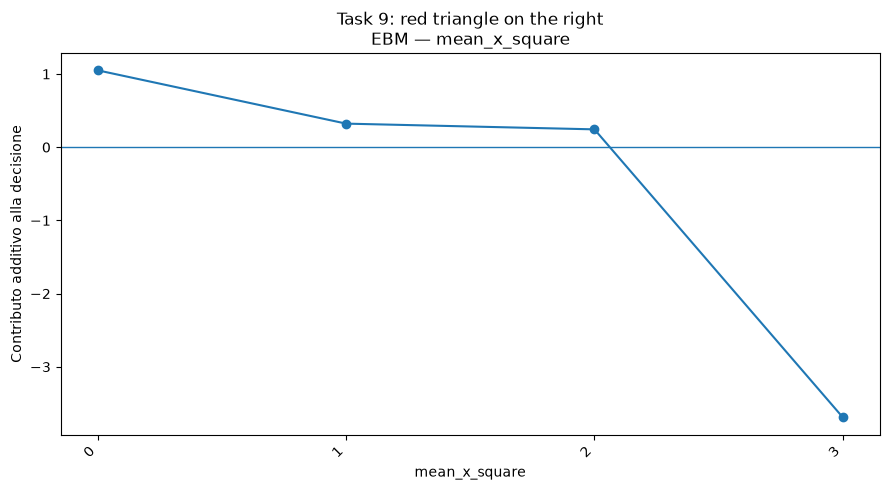

Salvato: ../results/interpretable_models/plots/task_9_ebm_mean_x_square.png


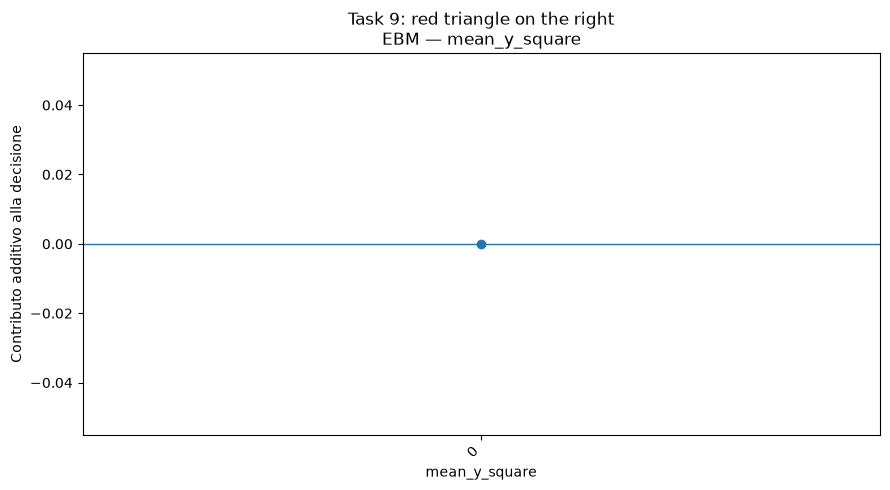

Salvato: ../results/interpretable_models/plots/task_9_ebm_mean_y_square.png


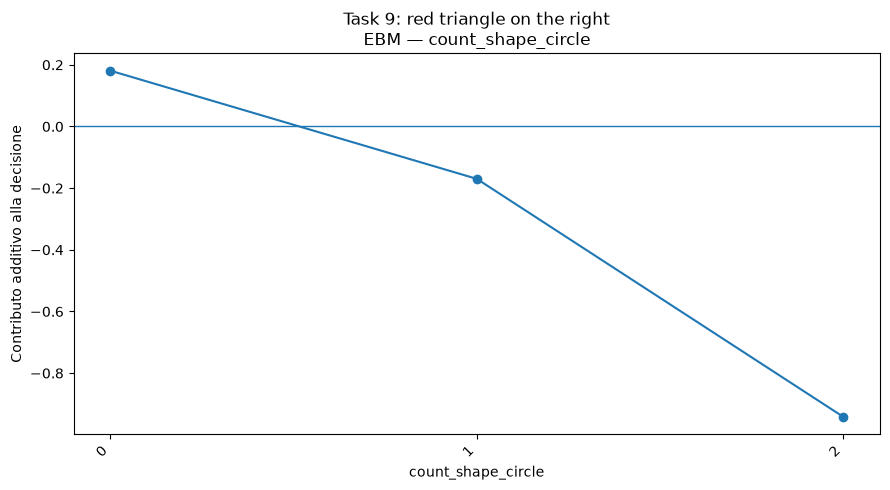

Salvato: ../results/interpretable_models/plots/task_9_ebm_count_shape_circle.png


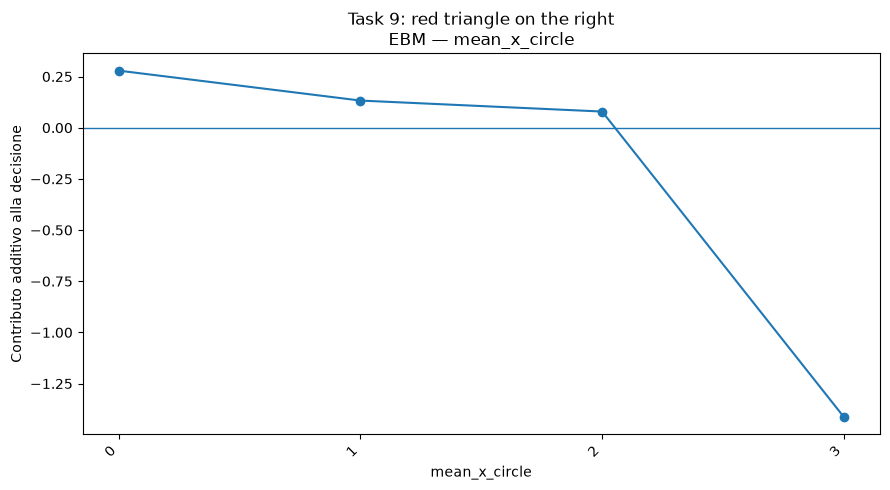

Salvato: ../results/interpretable_models/plots/task_9_ebm_mean_x_circle.png


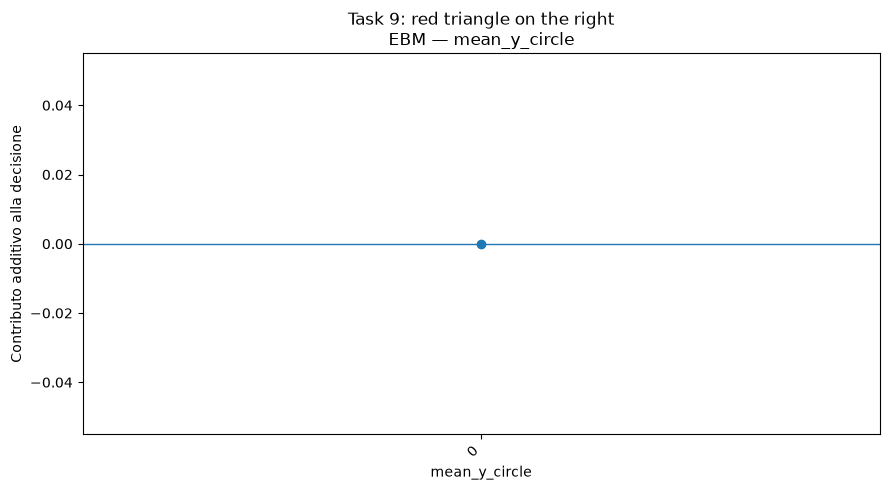

Salvato: ../results/interpretable_models/plots/task_9_ebm_mean_y_circle.png


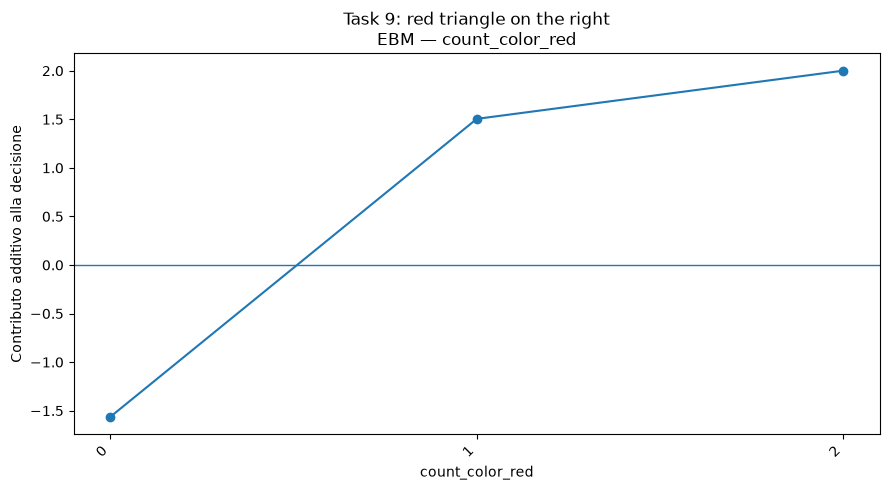

Salvato: ../results/interpretable_models/plots/task_9_ebm_count_color_red.png


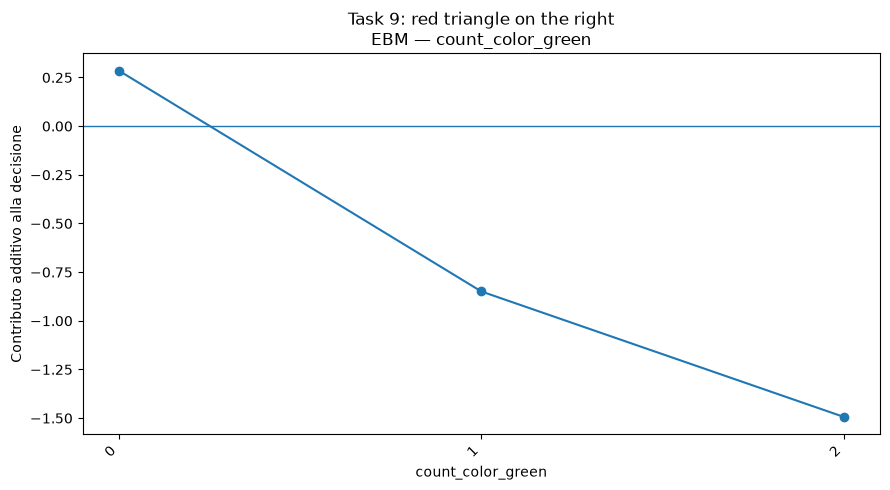

Salvato: ../results/interpretable_models/plots/task_9_ebm_count_color_green.png


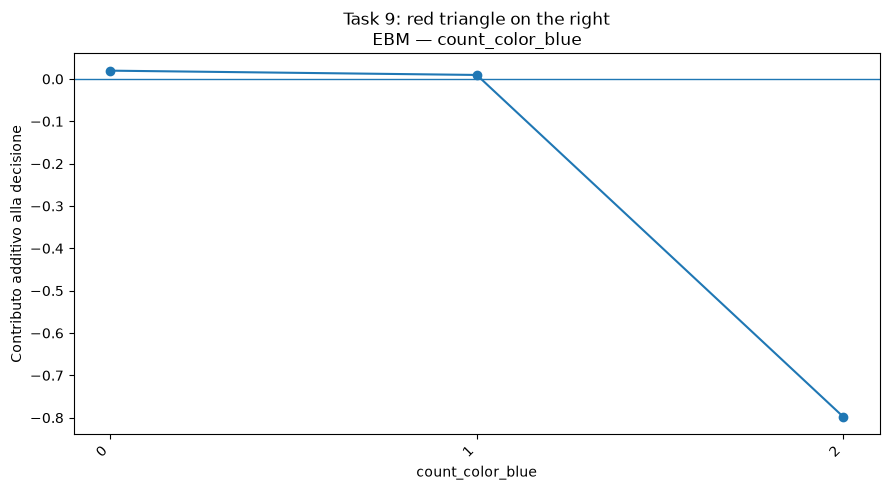

Salvato: ../results/interpretable_models/plots/task_9_ebm_count_color_blue.png


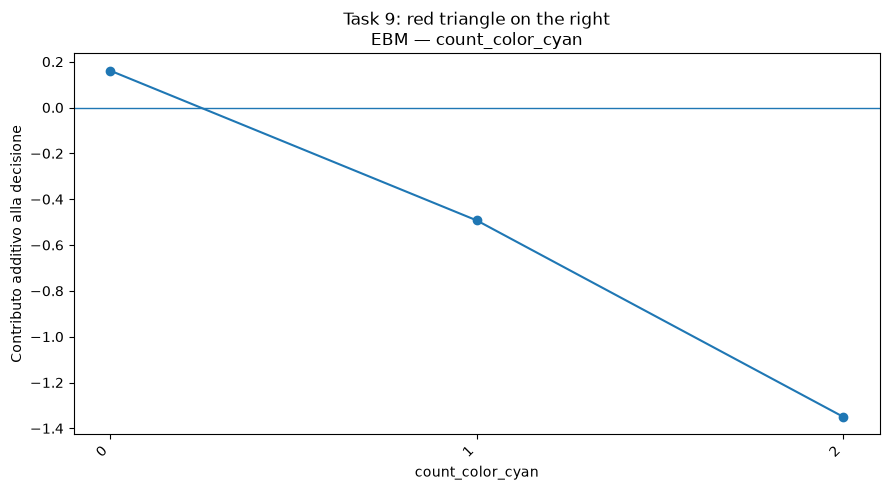

Salvato: ../results/interpretable_models/plots/task_9_ebm_count_color_cyan.png


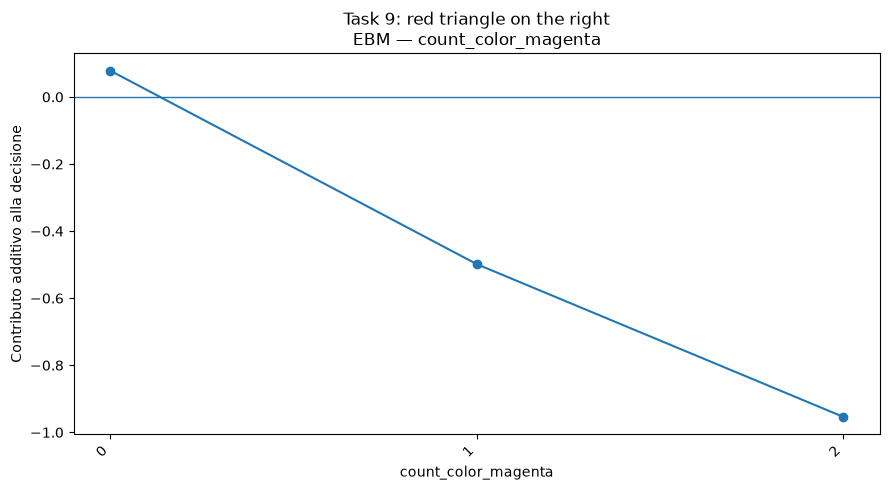

Salvato: ../results/interpretable_models/plots/task_9_ebm_count_color_magenta.png


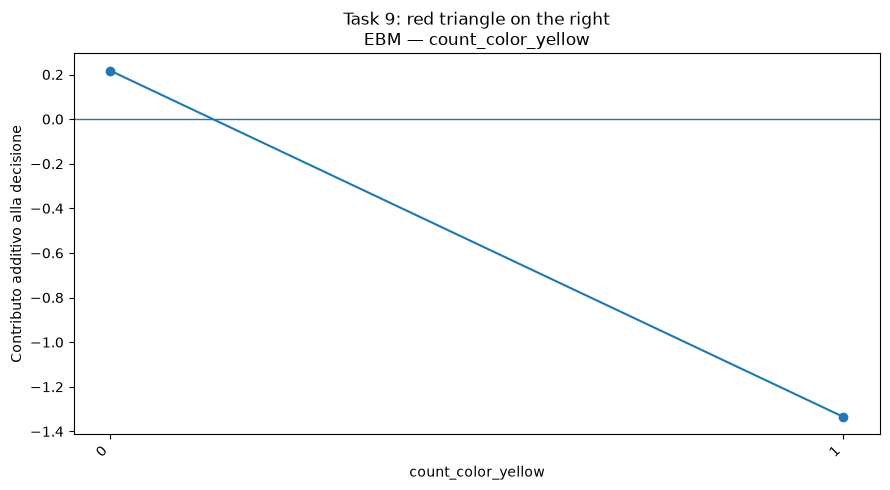

Salvato: ../results/interpretable_models/plots/task_9_ebm_count_color_yellow.png


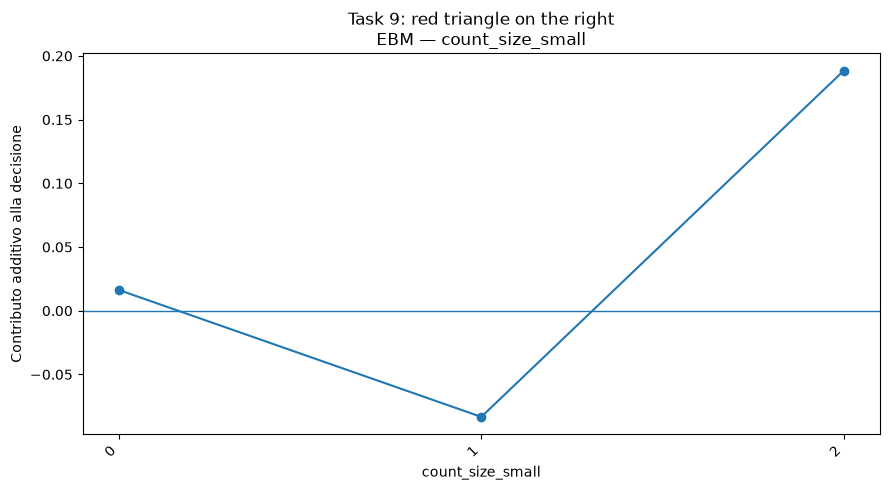

Salvato: ../results/interpretable_models/plots/task_9_ebm_count_size_small.png


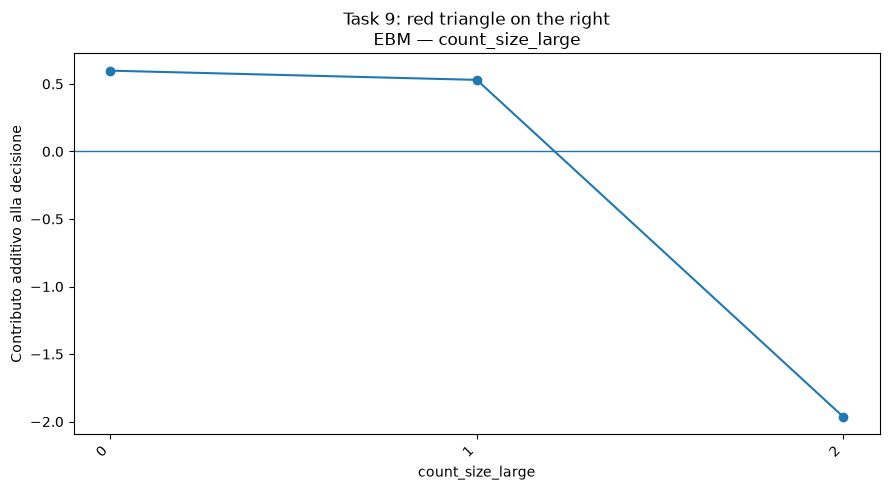

Salvato: ../results/interpretable_models/plots/task_9_ebm_count_size_large.png


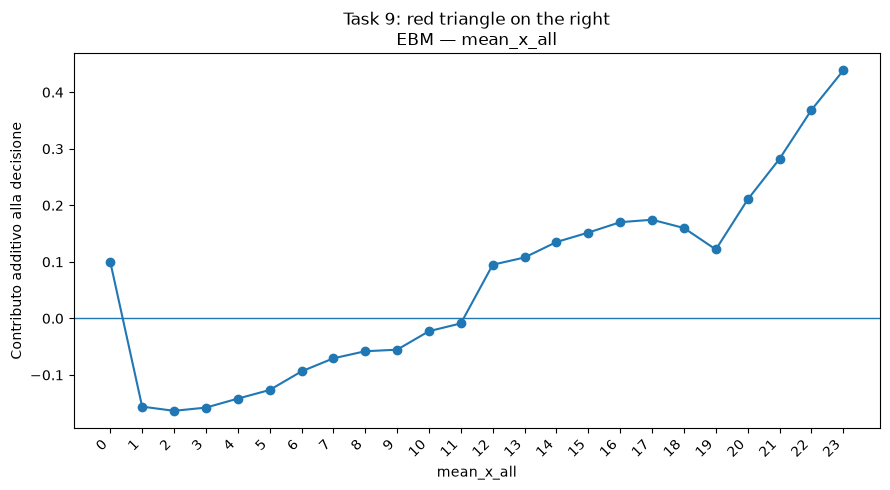

Salvato: ../results/interpretable_models/plots/task_9_ebm_mean_x_all.png


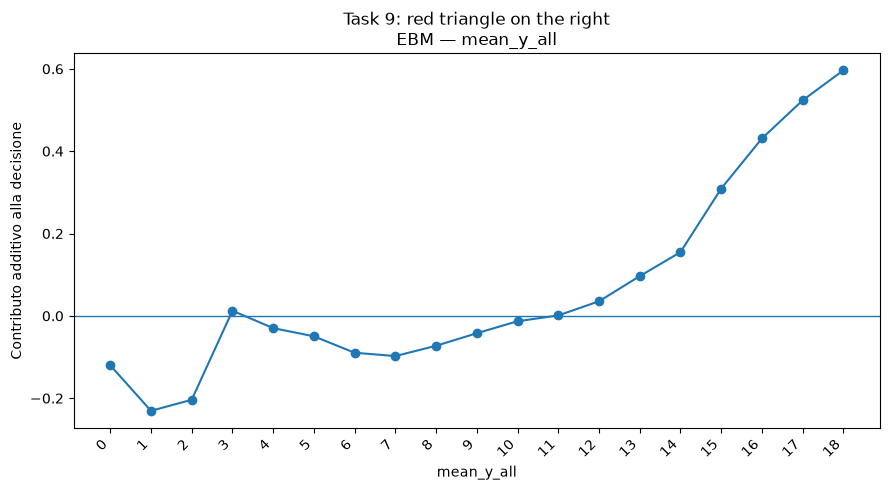

Salvato: ../results/interpretable_models/plots/task_9_ebm_mean_y_all.png


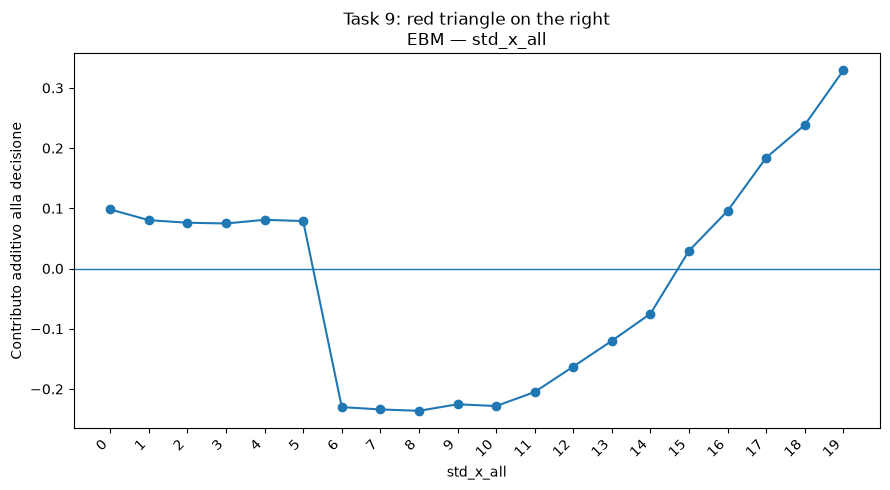

Salvato: ../results/interpretable_models/plots/task_9_ebm_std_x_all.png


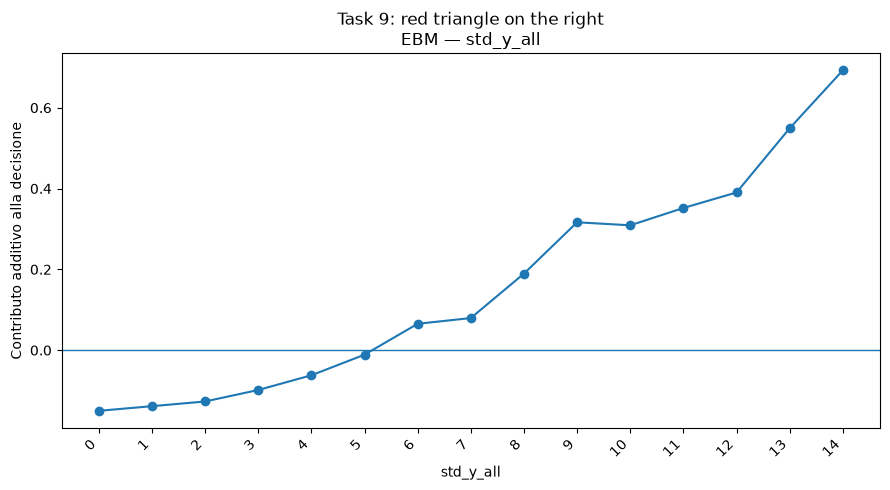

Salvato: ../results/interpretable_models/plots/task_9_ebm_std_y_all.png


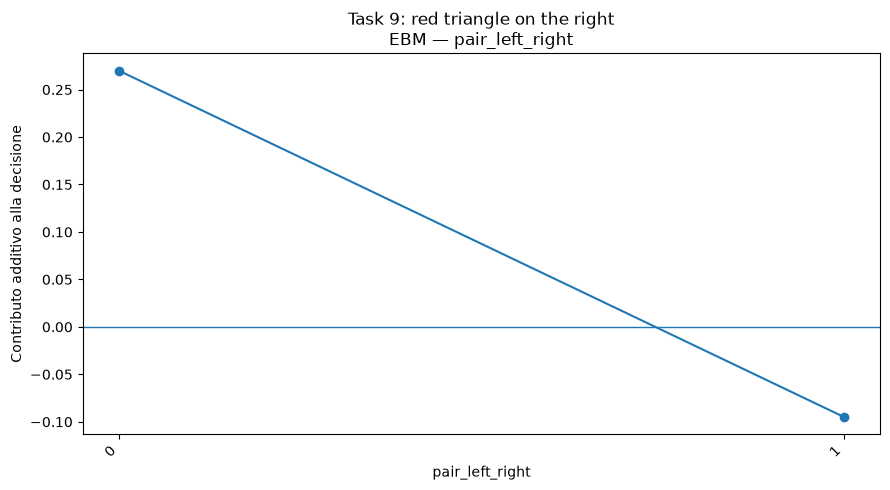

Salvato: ../results/interpretable_models/plots/task_9_ebm_pair_left_right.png


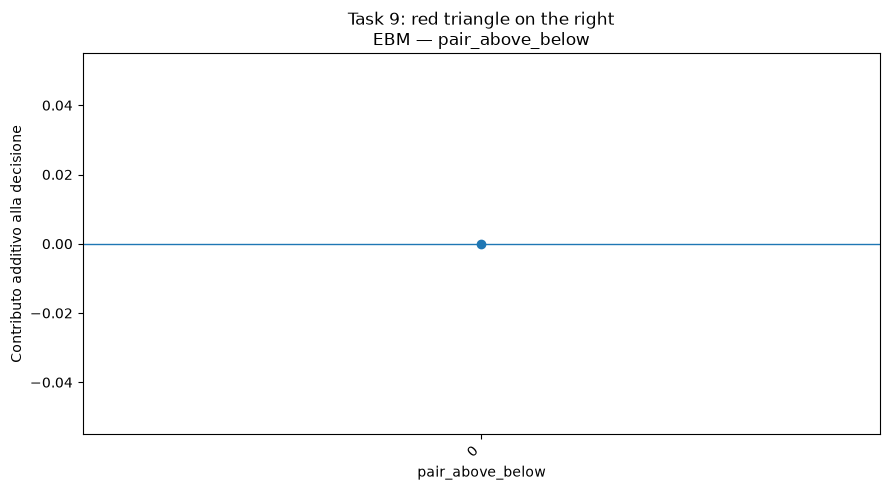

Salvato: ../results/interpretable_models/plots/task_9_ebm_pair_above_below.png


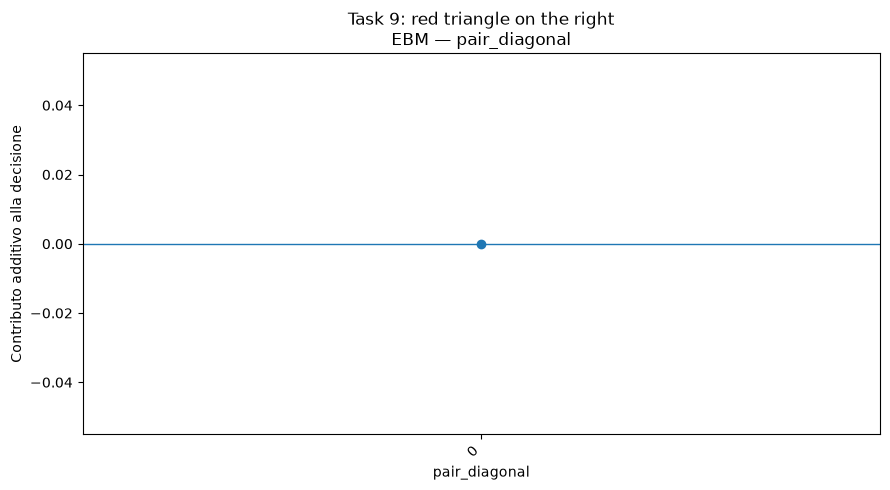

Salvato: ../results/interpretable_models/plots/task_9_ebm_pair_diagonal.png


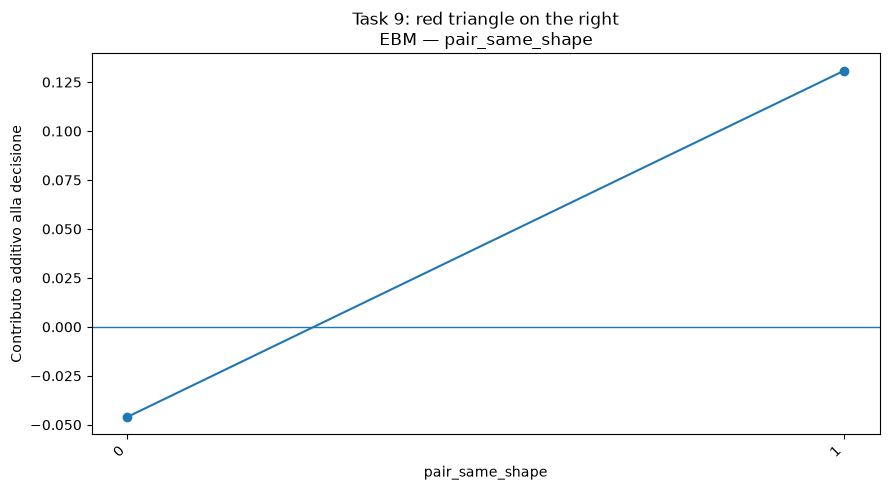

Salvato: ../results/interpretable_models/plots/task_9_ebm_pair_same_shape.png


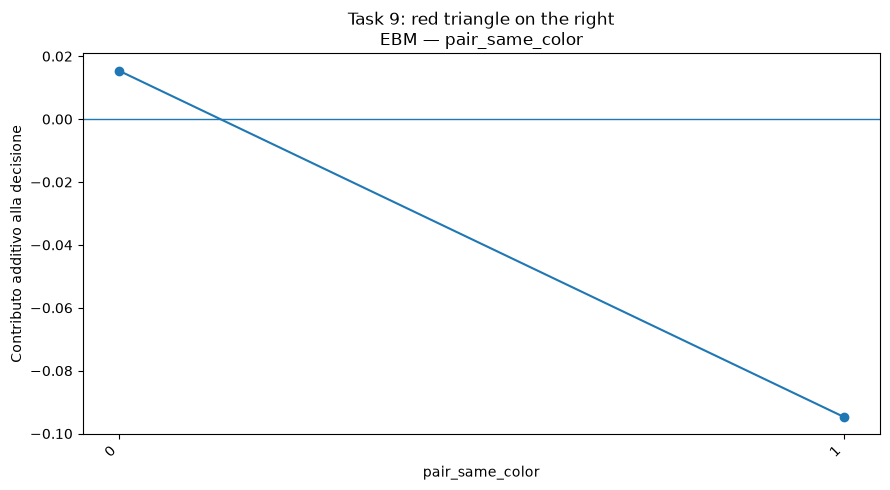

Salvato: ../results/interpretable_models/plots/task_9_ebm_pair_same_color.png


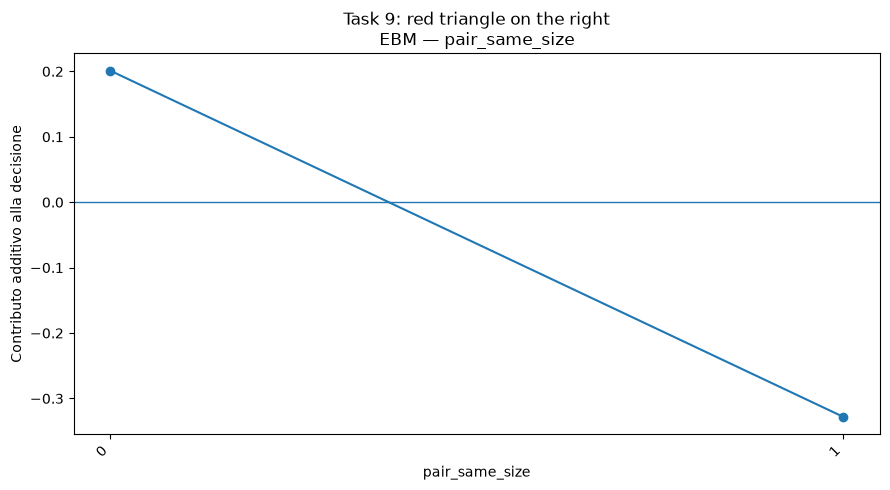

Salvato: ../results/interpretable_models/plots/task_9_ebm_pair_same_size.png


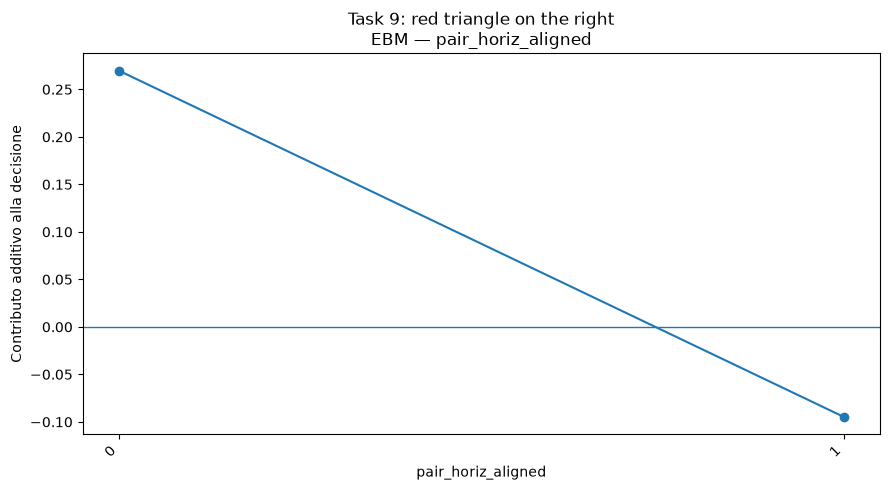

Salvato: ../results/interpretable_models/plots/task_9_ebm_pair_horiz_aligned.png


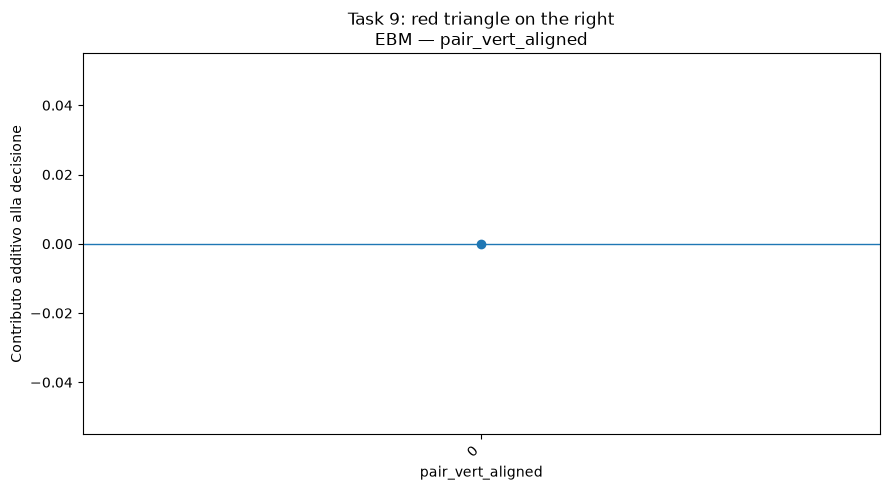

Salvato: ../results/interpretable_models/plots/task_9_ebm_pair_vert_aligned.png


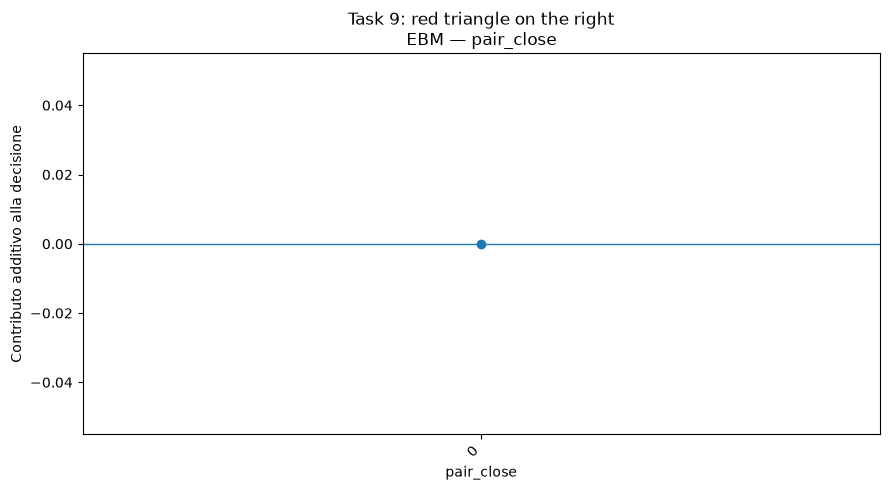

Salvato: ../results/interpretable_models/plots/task_9_ebm_pair_close.png


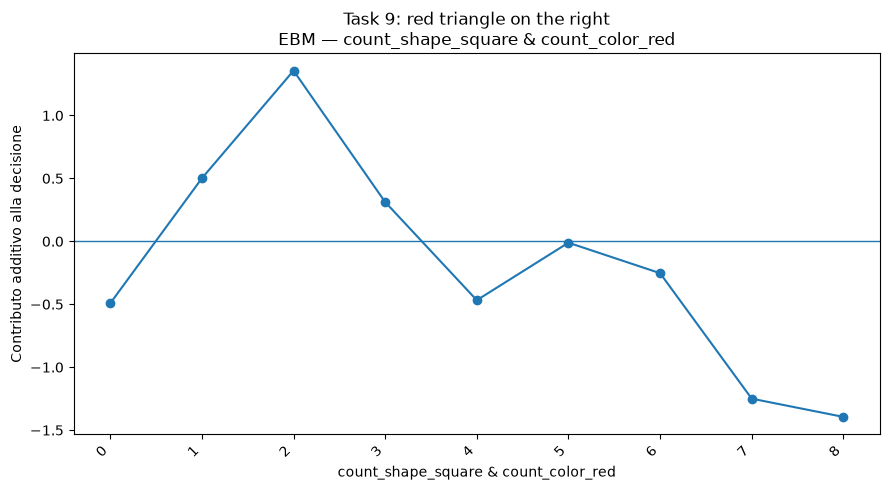

Salvato: ../results/interpretable_models/plots/task_9_ebm_count_shape_square_count_color_red.png


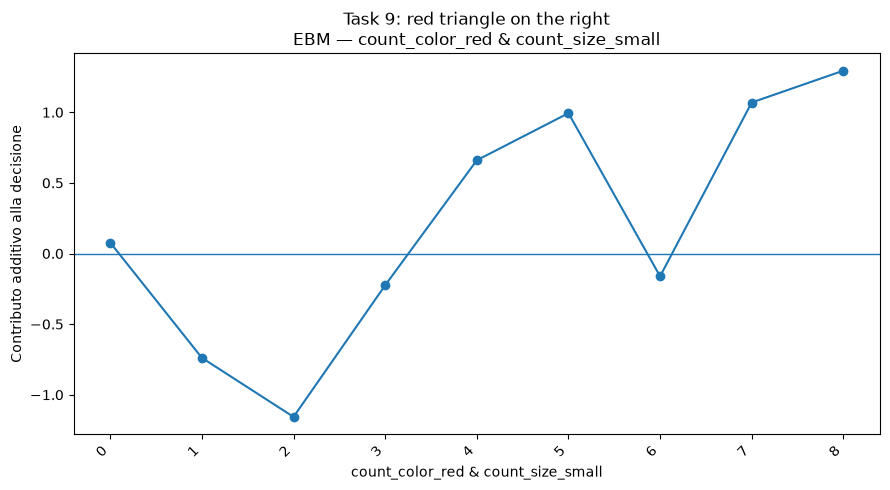

Salvato: ../results/interpretable_models/plots/task_9_ebm_count_color_red_count_size_small.png


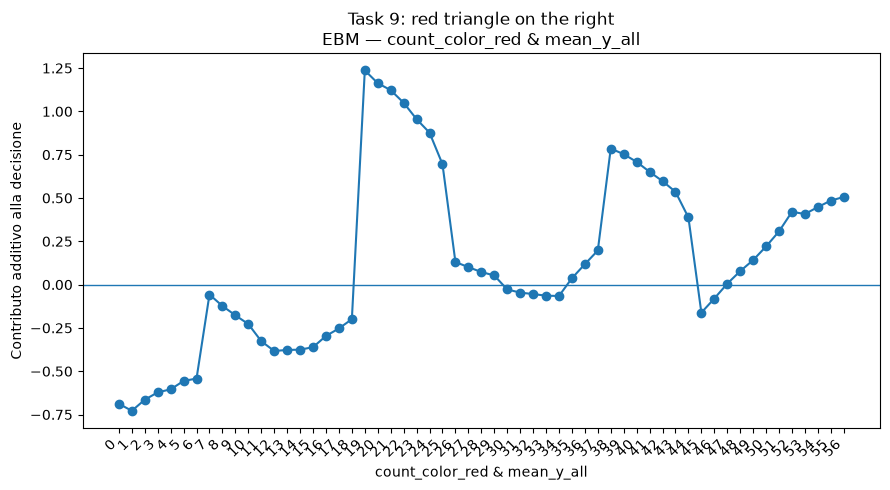

Salvato: ../results/interpretable_models/plots/task_9_ebm_count_color_red_mean_y_all.png


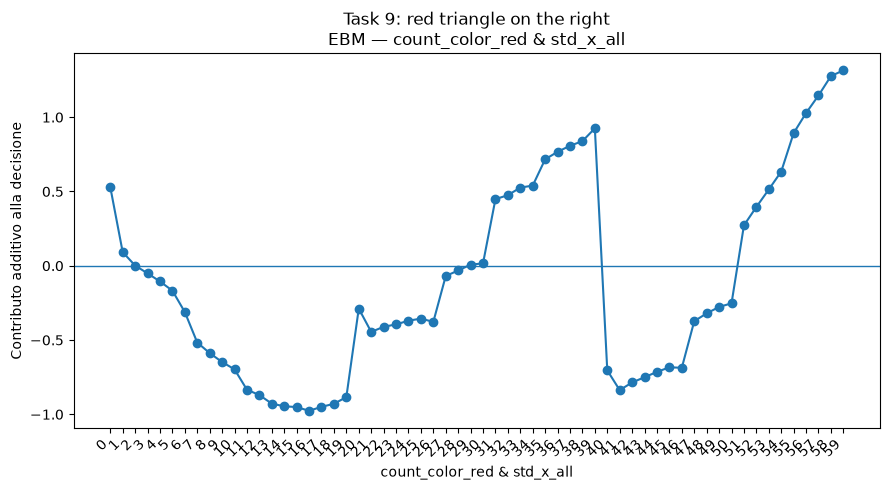

Salvato: ../results/interpretable_models/plots/task_9_ebm_count_color_red_std_x_all.png


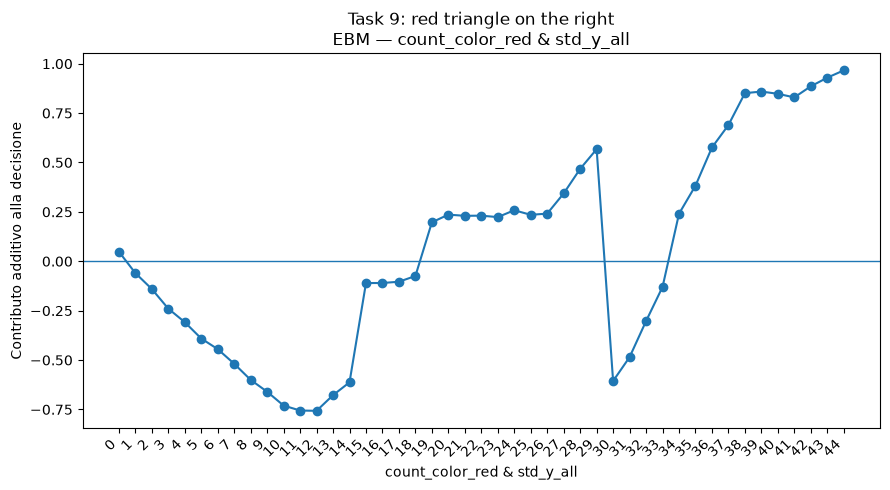

Salvato: ../results/interpretable_models/plots/task_9_ebm_count_color_red_std_y_all.png


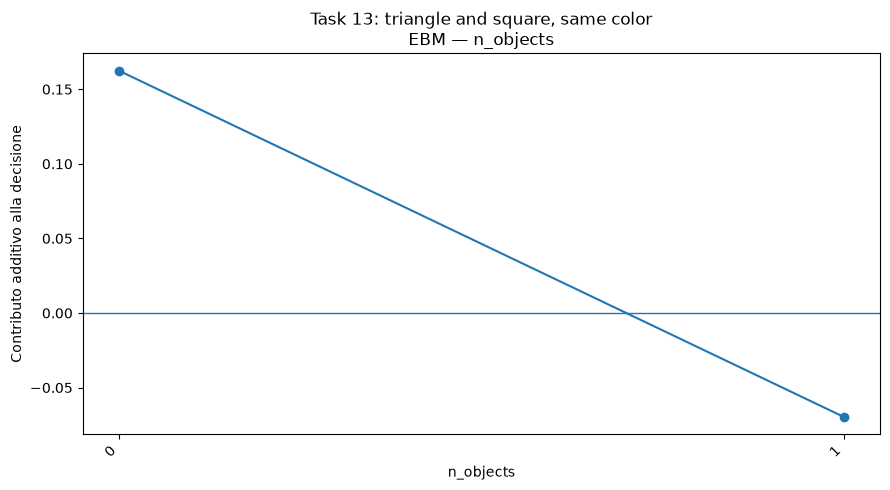

Salvato: ../results/interpretable_models/plots/task_13_ebm_n_objects.png


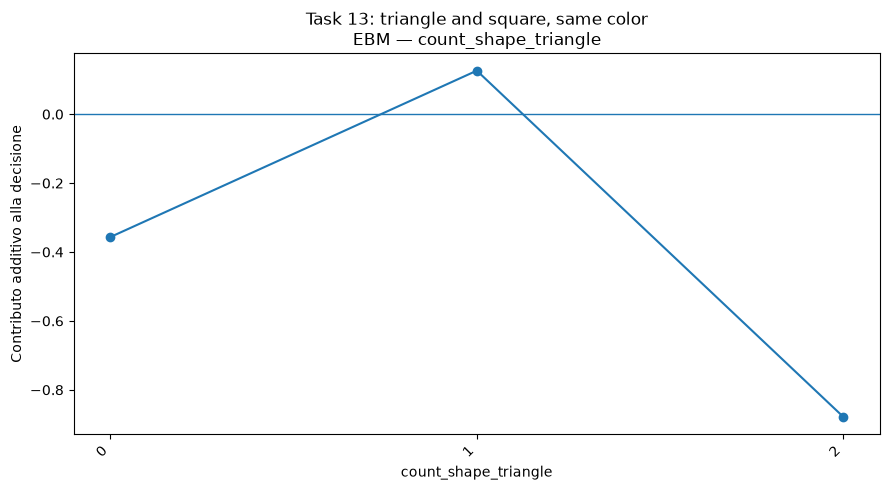

Salvato: ../results/interpretable_models/plots/task_13_ebm_count_shape_triangle.png


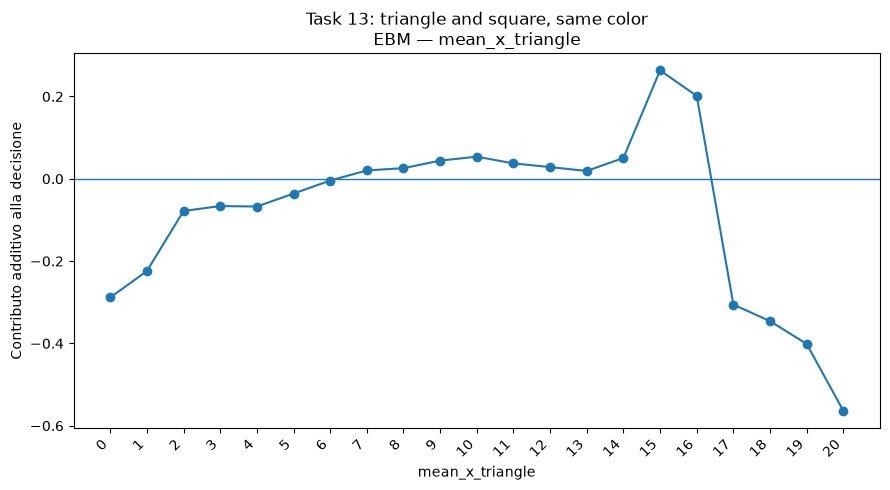

Salvato: ../results/interpretable_models/plots/task_13_ebm_mean_x_triangle.png


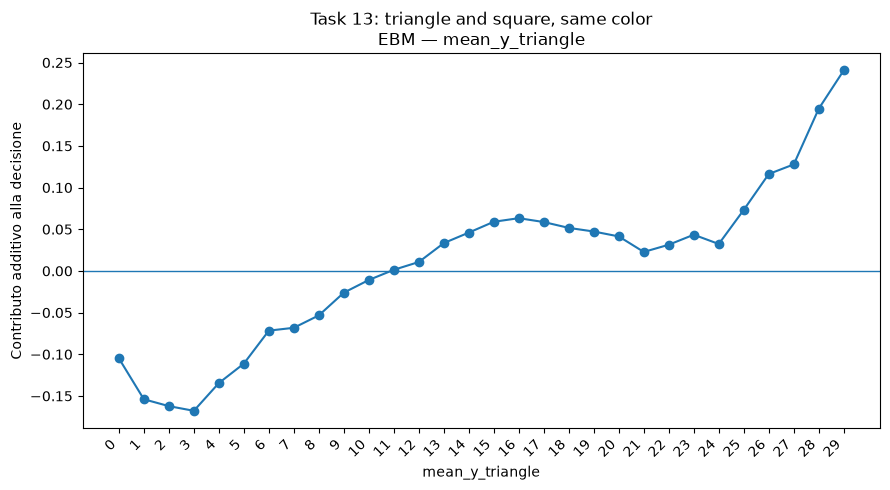

Salvato: ../results/interpretable_models/plots/task_13_ebm_mean_y_triangle.png


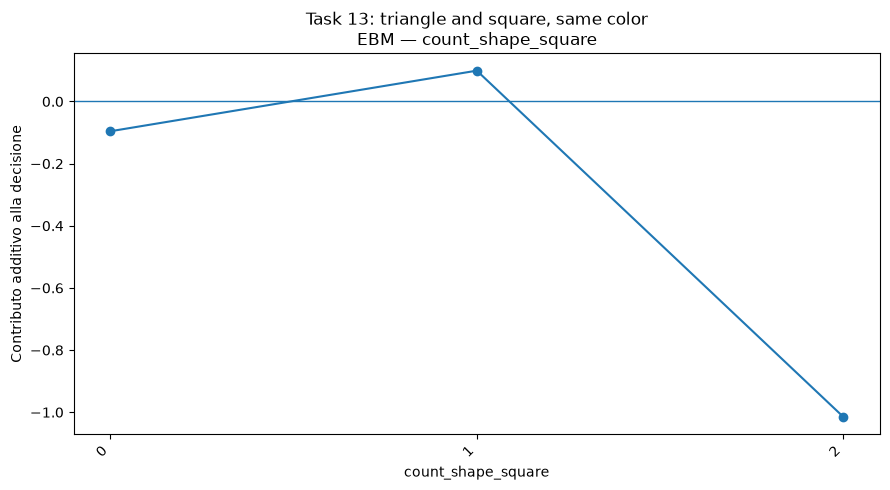

Salvato: ../results/interpretable_models/plots/task_13_ebm_count_shape_square.png


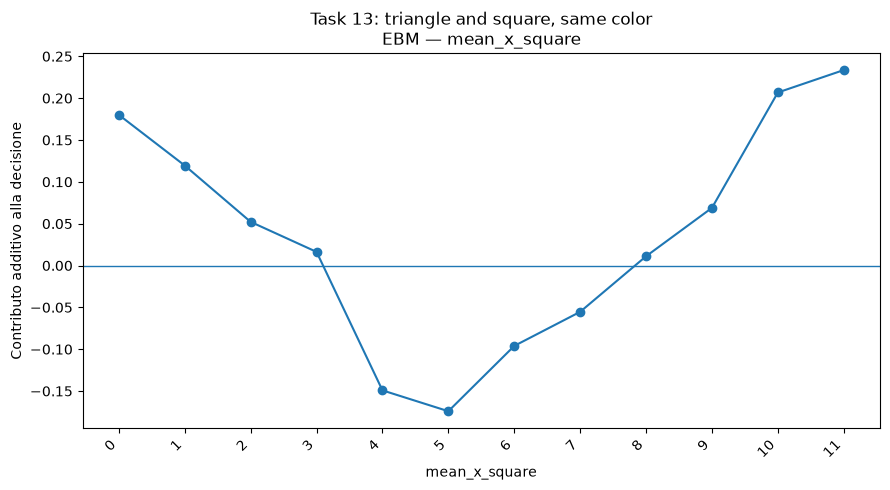

Salvato: ../results/interpretable_models/plots/task_13_ebm_mean_x_square.png


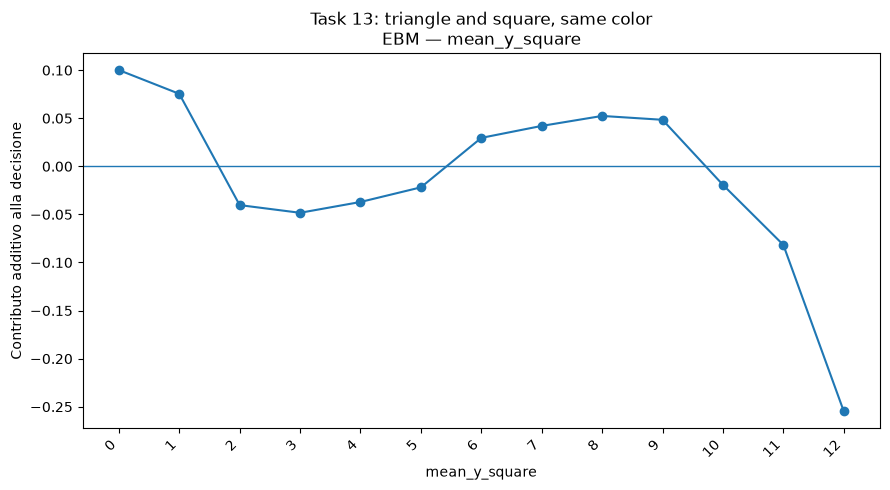

Salvato: ../results/interpretable_models/plots/task_13_ebm_mean_y_square.png


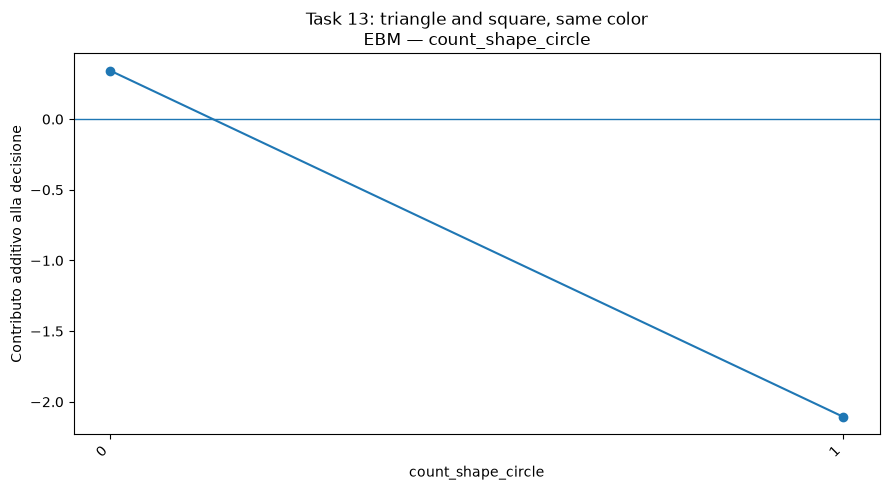

Salvato: ../results/interpretable_models/plots/task_13_ebm_count_shape_circle.png


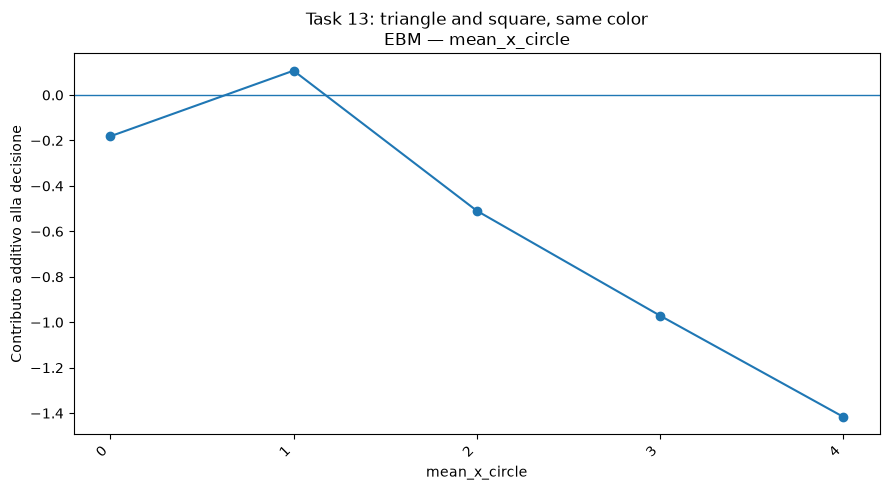

Salvato: ../results/interpretable_models/plots/task_13_ebm_mean_x_circle.png


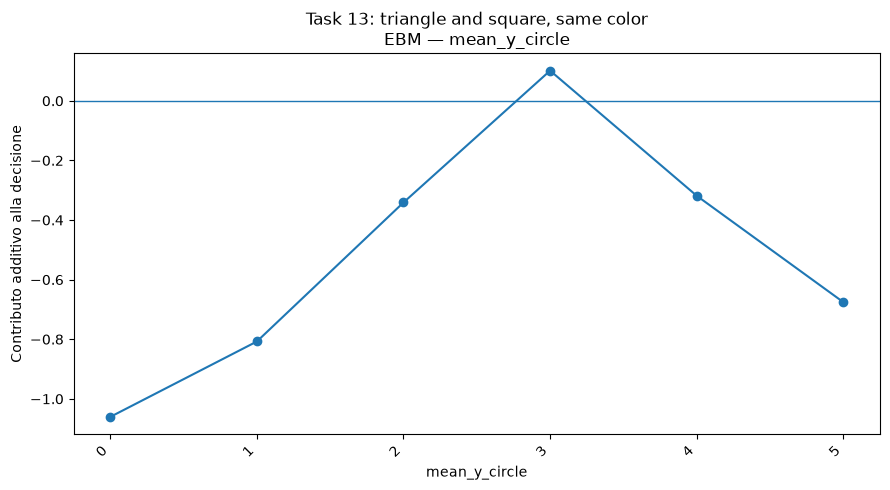

Salvato: ../results/interpretable_models/plots/task_13_ebm_mean_y_circle.png


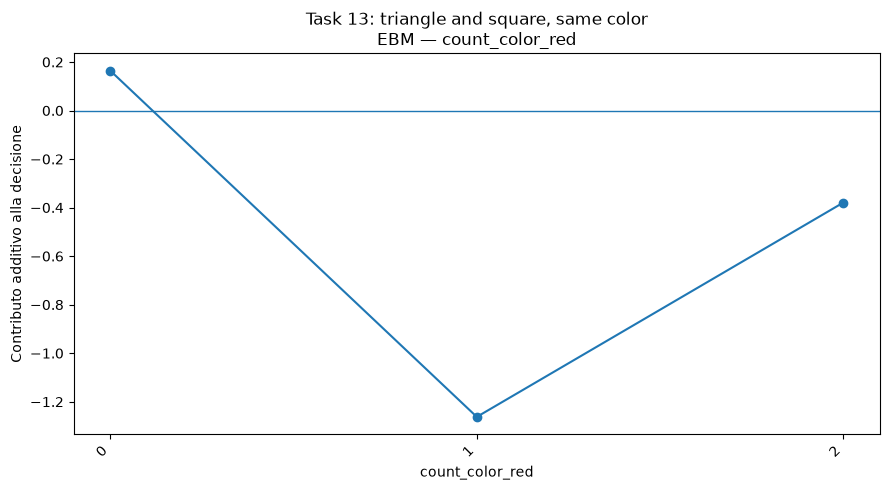

Salvato: ../results/interpretable_models/plots/task_13_ebm_count_color_red.png


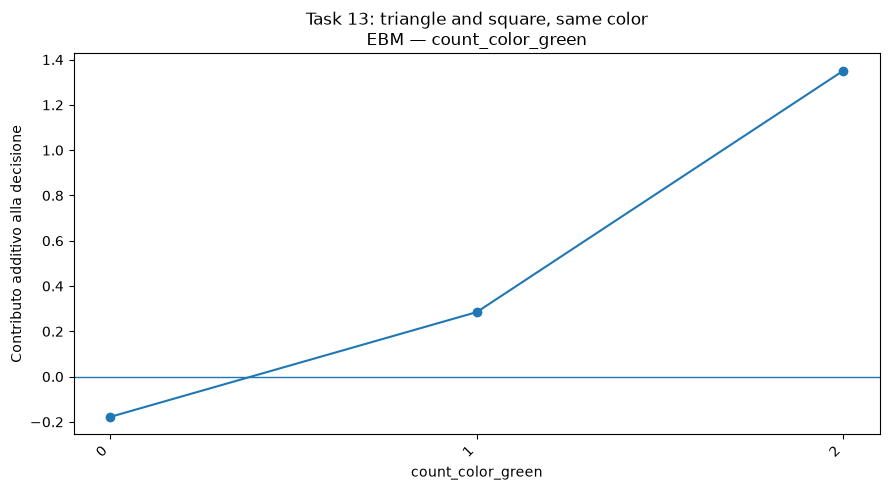

Salvato: ../results/interpretable_models/plots/task_13_ebm_count_color_green.png


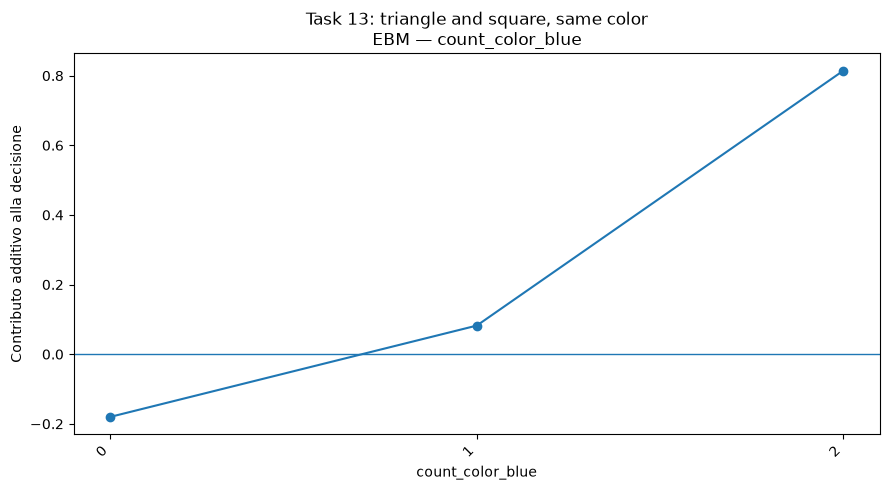

Salvato: ../results/interpretable_models/plots/task_13_ebm_count_color_blue.png


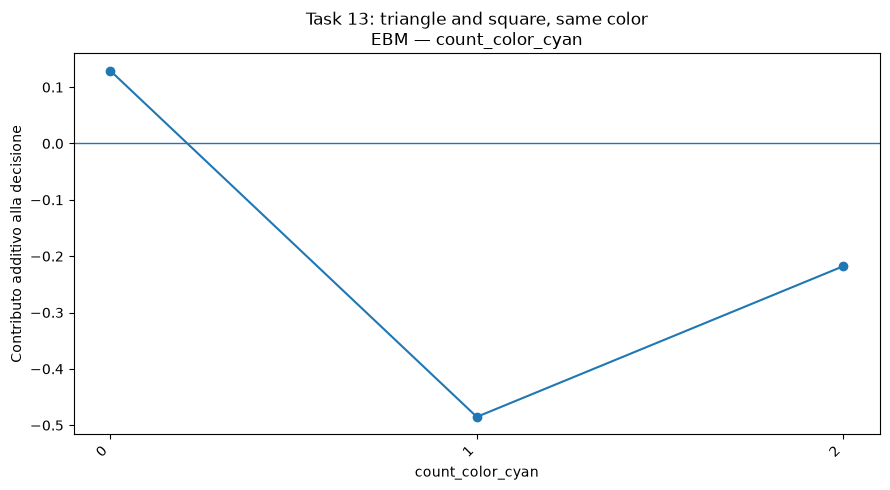

Salvato: ../results/interpretable_models/plots/task_13_ebm_count_color_cyan.png


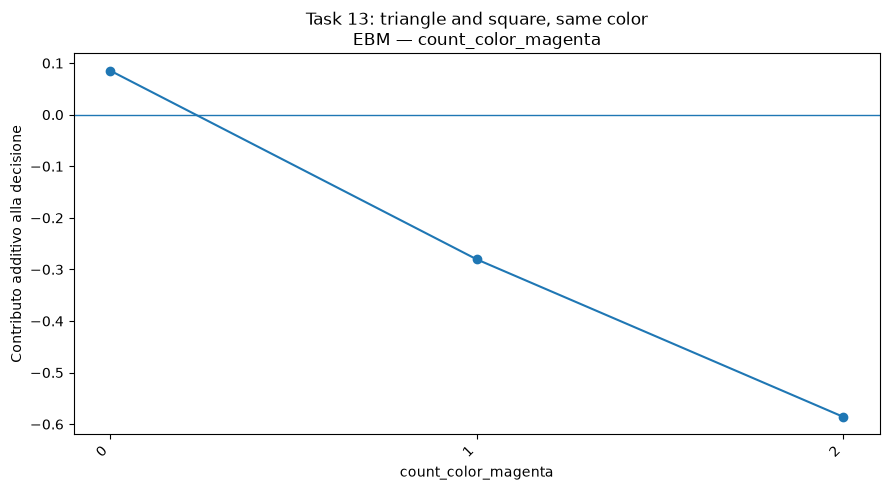

Salvato: ../results/interpretable_models/plots/task_13_ebm_count_color_magenta.png


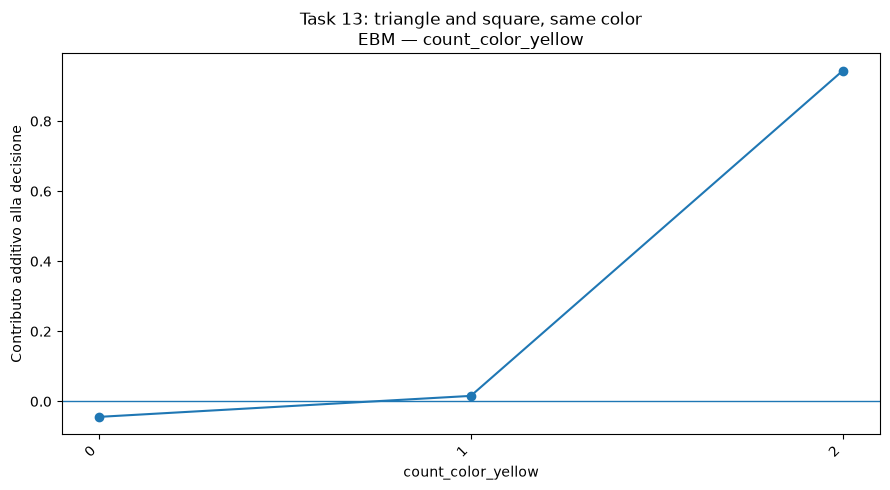

Salvato: ../results/interpretable_models/plots/task_13_ebm_count_color_yellow.png


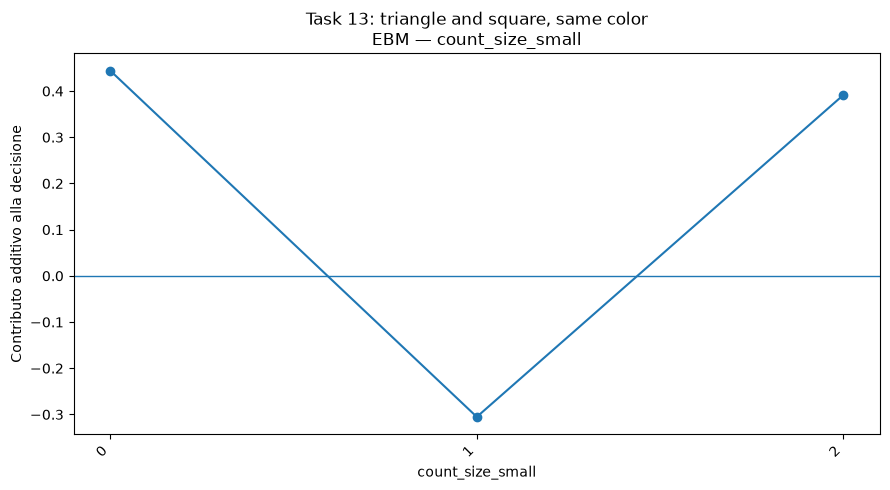

Salvato: ../results/interpretable_models/plots/task_13_ebm_count_size_small.png


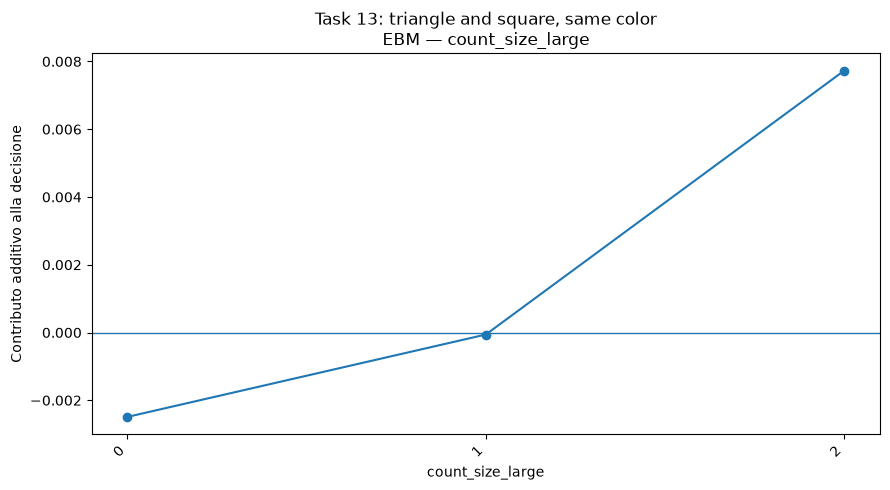

Salvato: ../results/interpretable_models/plots/task_13_ebm_count_size_large.png


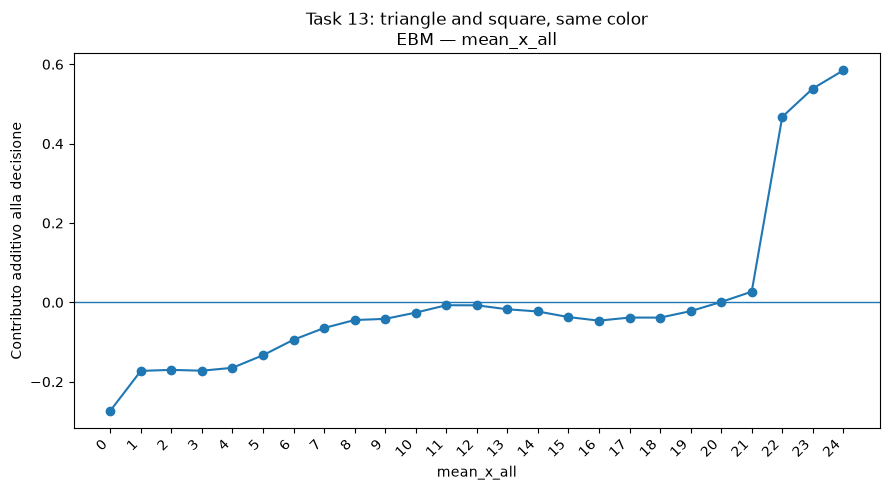

Salvato: ../results/interpretable_models/plots/task_13_ebm_mean_x_all.png


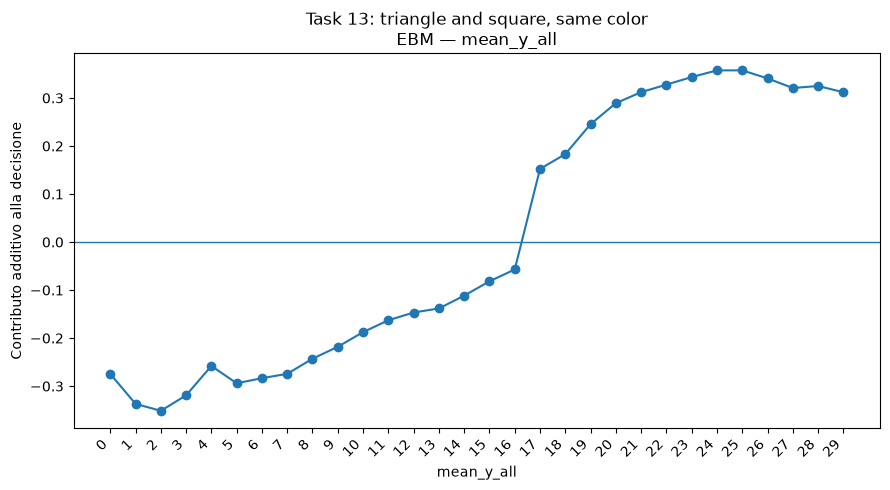

Salvato: ../results/interpretable_models/plots/task_13_ebm_mean_y_all.png


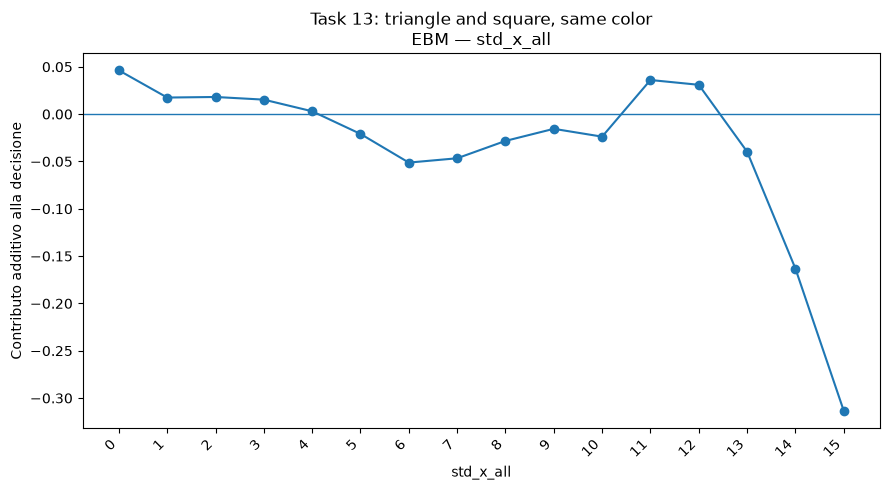

Salvato: ../results/interpretable_models/plots/task_13_ebm_std_x_all.png


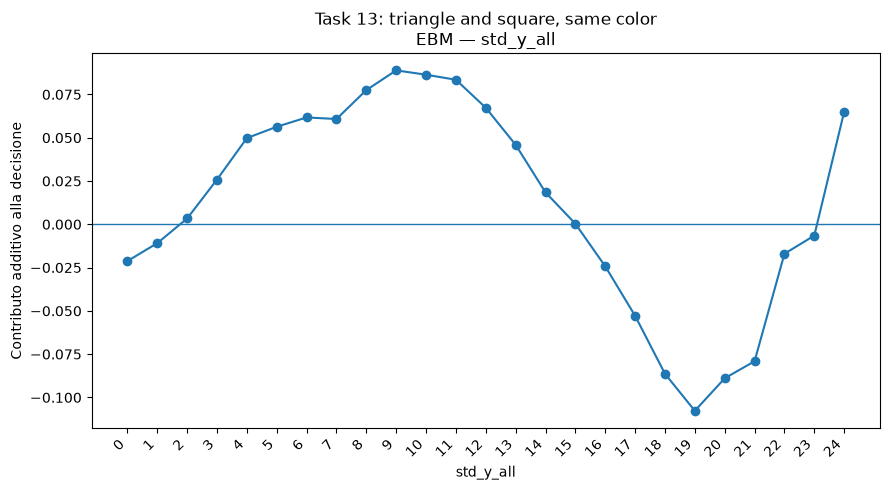

Salvato: ../results/interpretable_models/plots/task_13_ebm_std_y_all.png


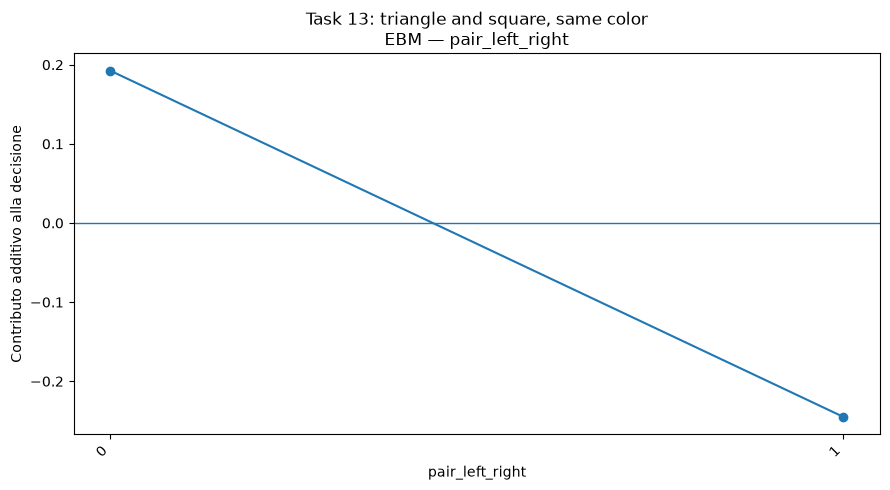

Salvato: ../results/interpretable_models/plots/task_13_ebm_pair_left_right.png


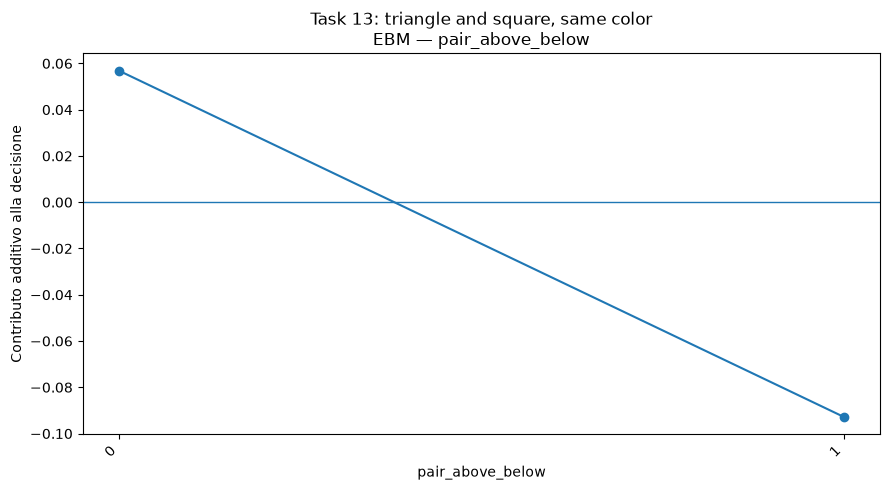

Salvato: ../results/interpretable_models/plots/task_13_ebm_pair_above_below.png


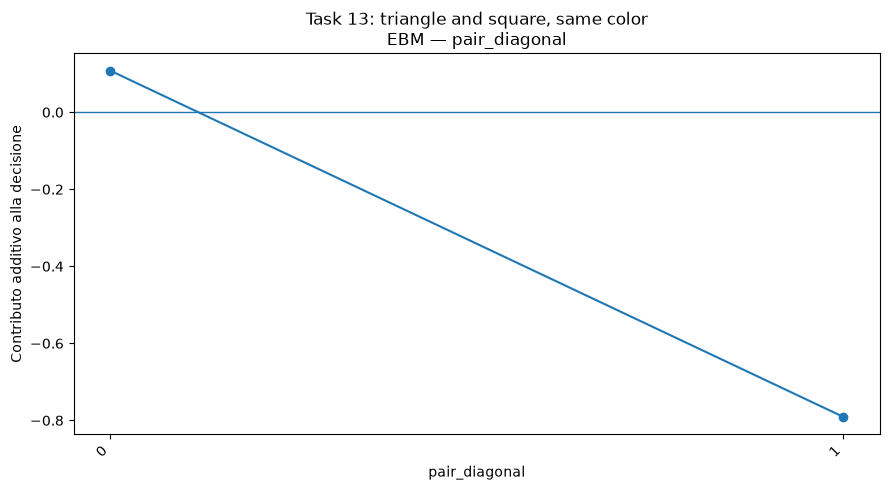

Salvato: ../results/interpretable_models/plots/task_13_ebm_pair_diagonal.png


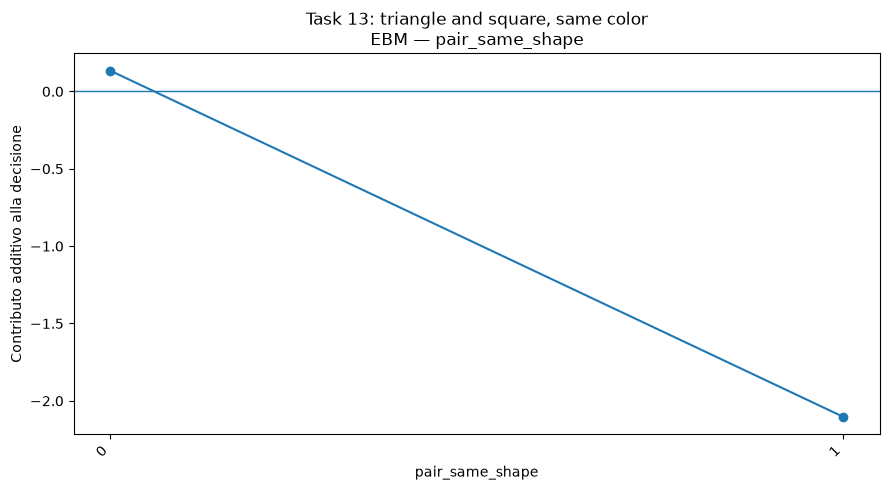

Salvato: ../results/interpretable_models/plots/task_13_ebm_pair_same_shape.png


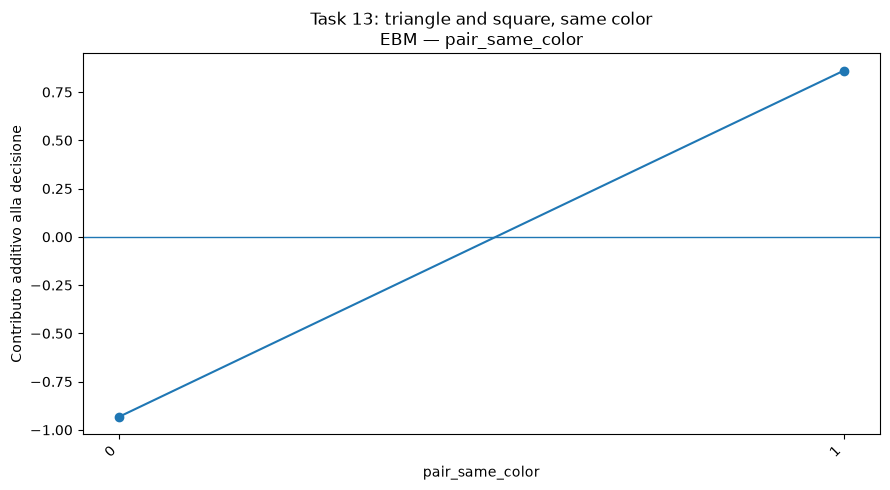

Salvato: ../results/interpretable_models/plots/task_13_ebm_pair_same_color.png


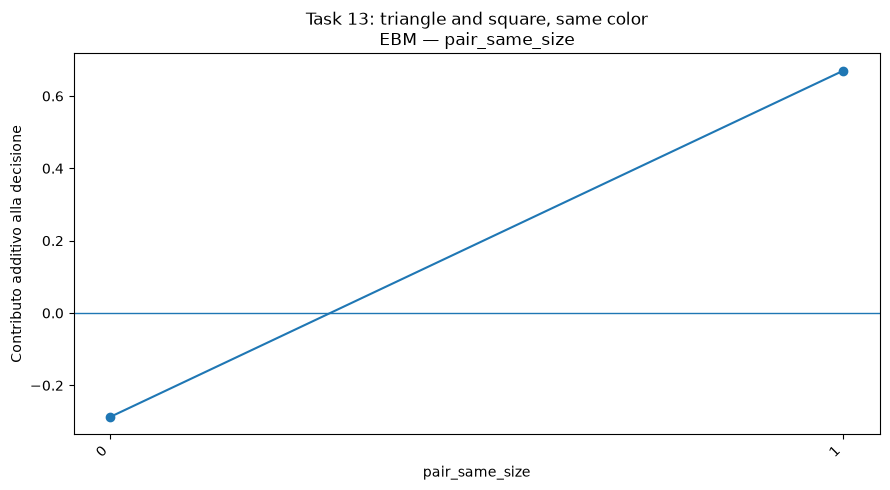

Salvato: ../results/interpretable_models/plots/task_13_ebm_pair_same_size.png


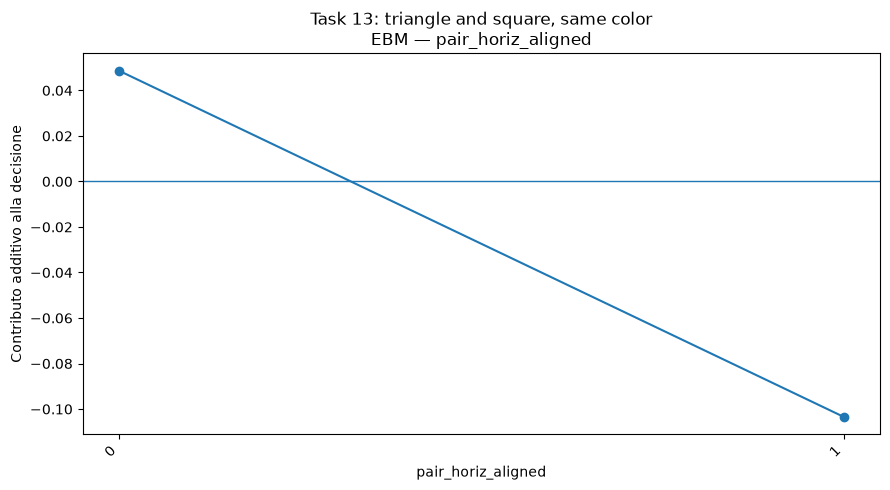

Salvato: ../results/interpretable_models/plots/task_13_ebm_pair_horiz_aligned.png


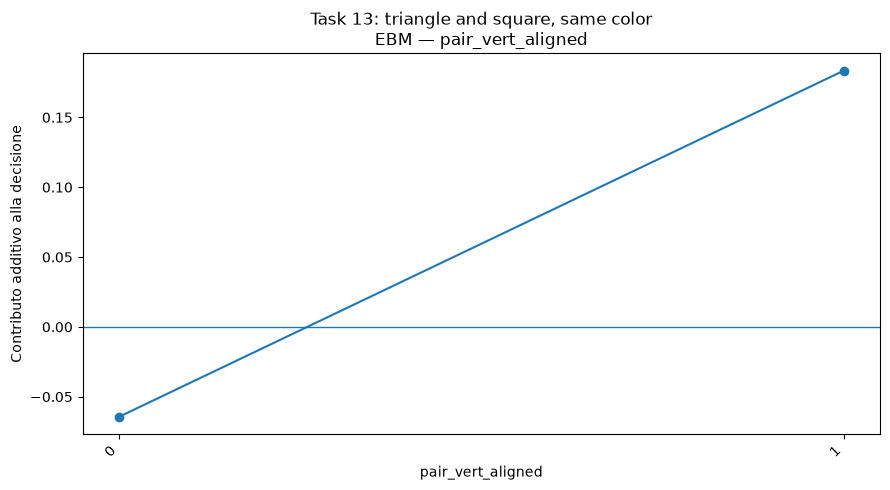

Salvato: ../results/interpretable_models/plots/task_13_ebm_pair_vert_aligned.png


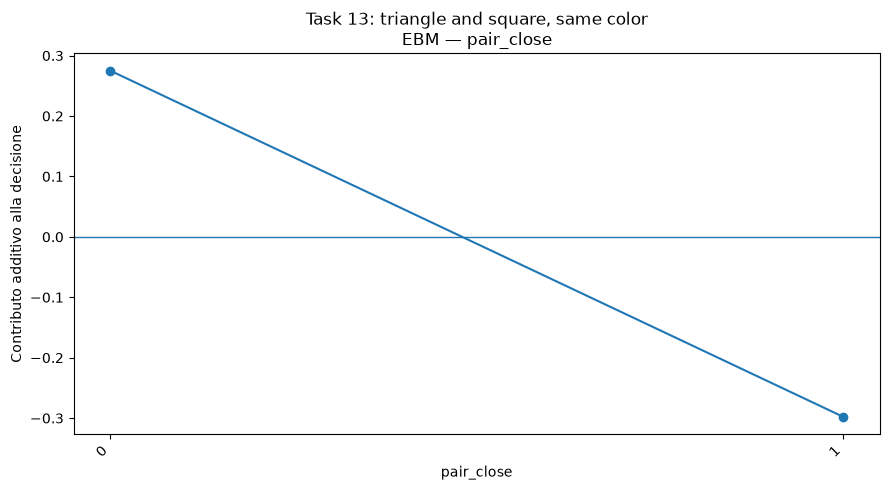

Salvato: ../results/interpretable_models/plots/task_13_ebm_pair_close.png


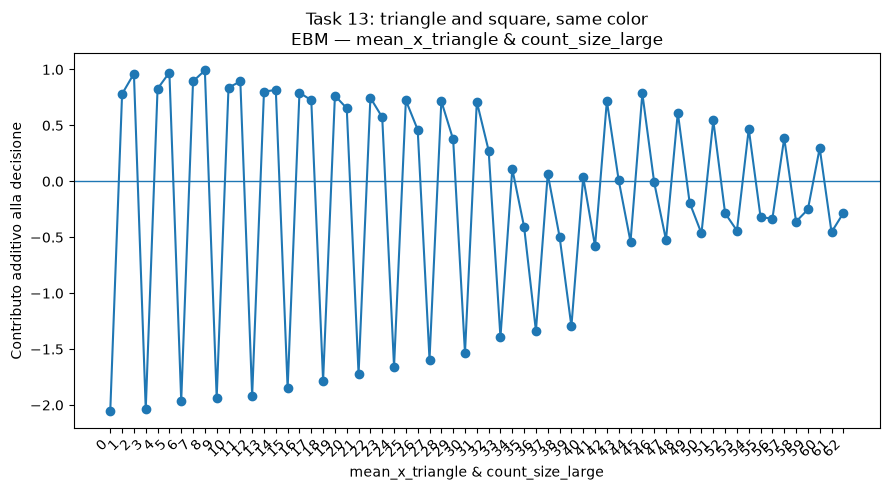

Salvato: ../results/interpretable_models/plots/task_13_ebm_mean_x_triangle_count_size_large.png


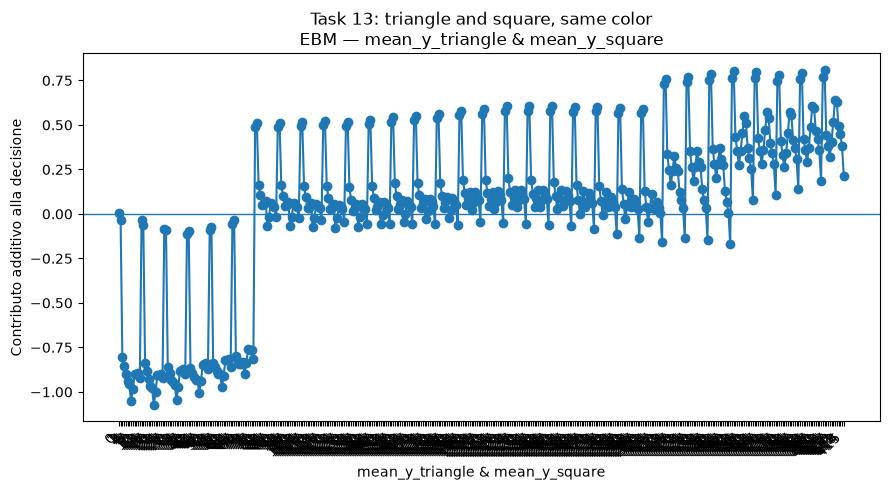

Salvato: ../results/interpretable_models/plots/task_13_ebm_mean_y_triangle_mean_y_square.png


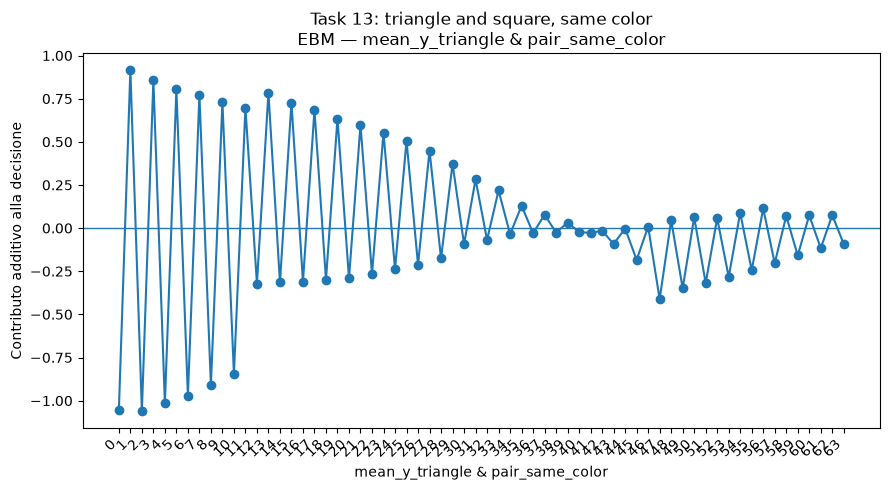

Salvato: ../results/interpretable_models/plots/task_13_ebm_mean_y_triangle_pair_same_color.png


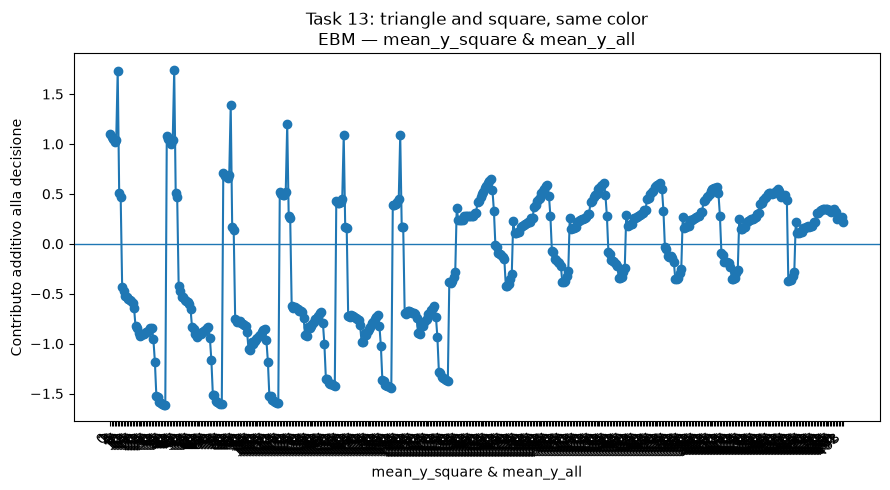

Salvato: ../results/interpretable_models/plots/task_13_ebm_mean_y_square_mean_y_all.png


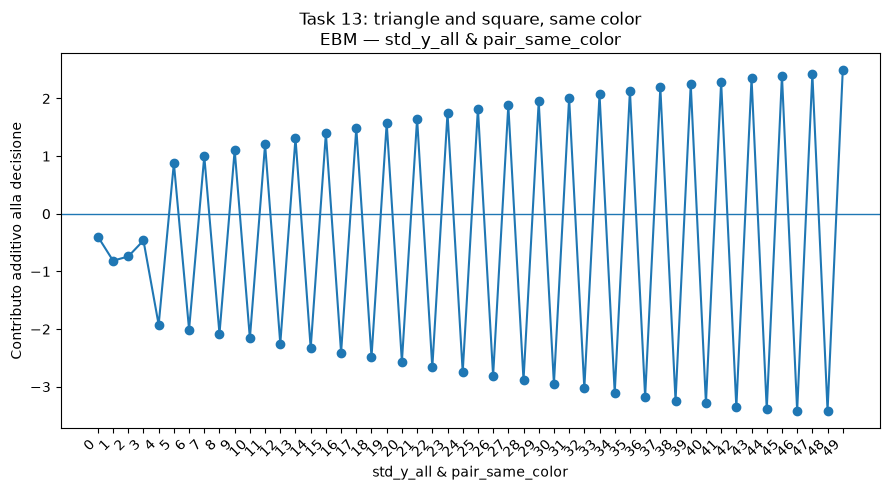

Salvato: ../results/interpretable_models/plots/task_13_ebm_std_y_all_pair_same_color.png


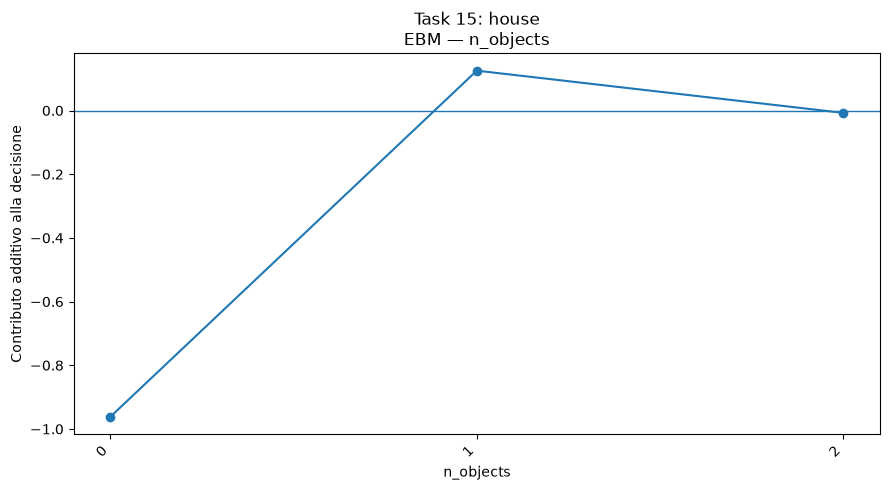

Salvato: ../results/interpretable_models/plots/task_15_ebm_n_objects.png


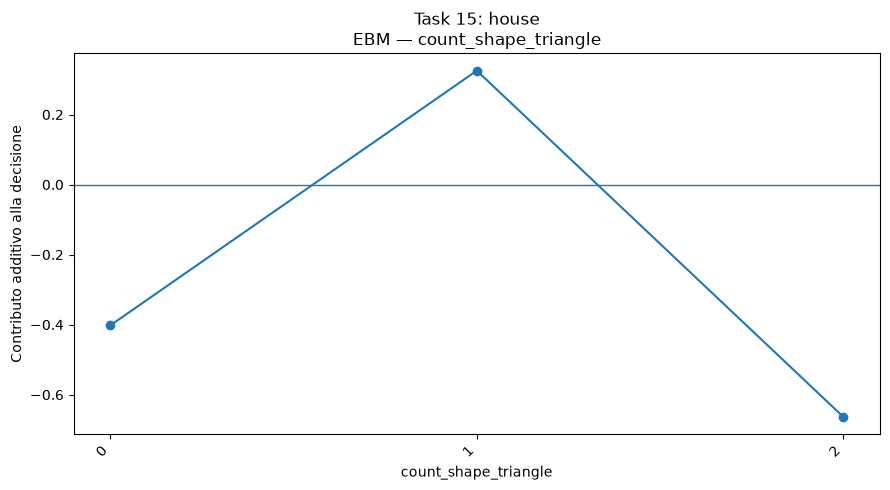

Salvato: ../results/interpretable_models/plots/task_15_ebm_count_shape_triangle.png


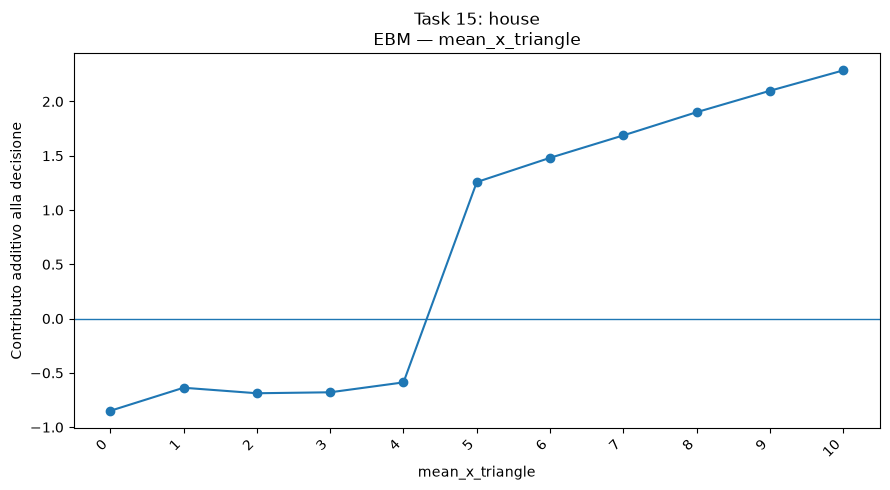

Salvato: ../results/interpretable_models/plots/task_15_ebm_mean_x_triangle.png


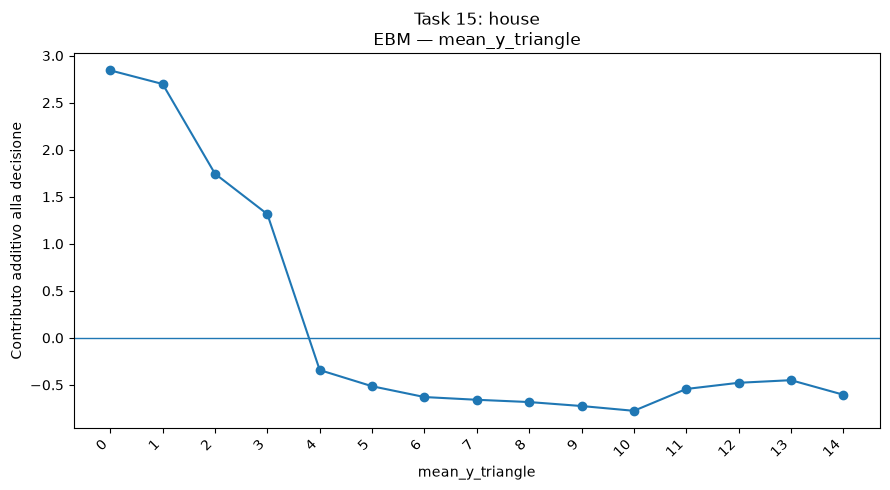

Salvato: ../results/interpretable_models/plots/task_15_ebm_mean_y_triangle.png


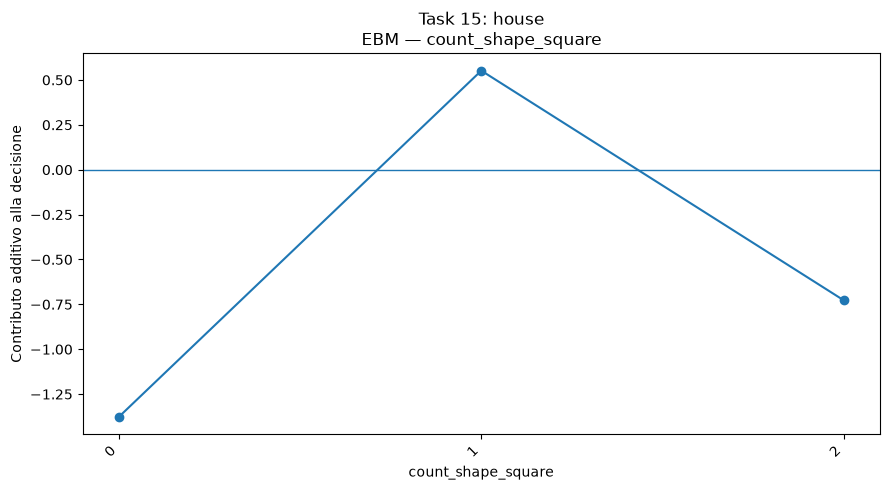

Salvato: ../results/interpretable_models/plots/task_15_ebm_count_shape_square.png


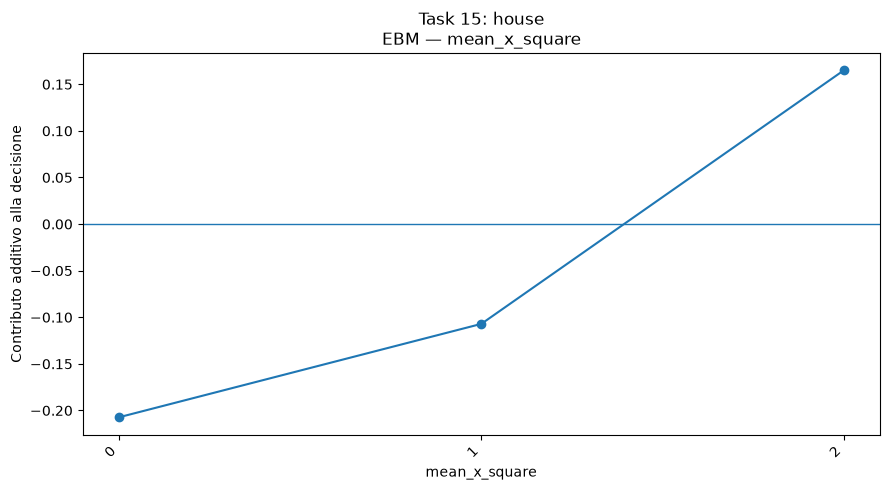

Salvato: ../results/interpretable_models/plots/task_15_ebm_mean_x_square.png


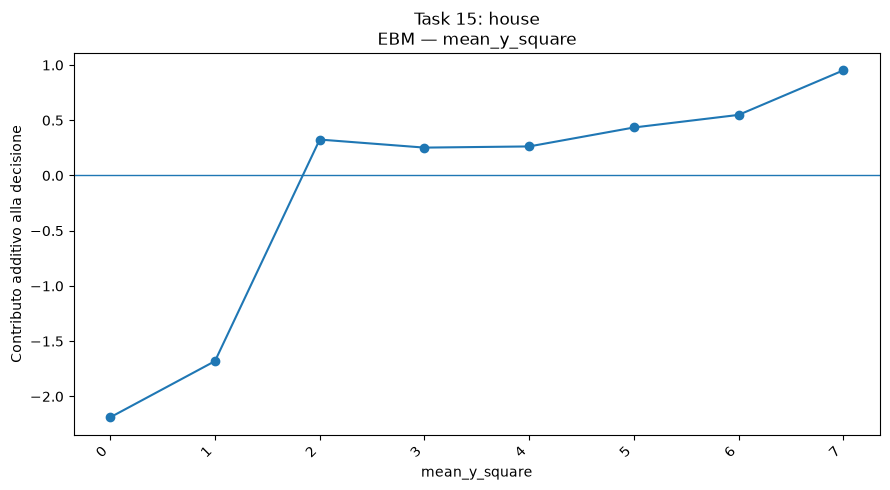

Salvato: ../results/interpretable_models/plots/task_15_ebm_mean_y_square.png


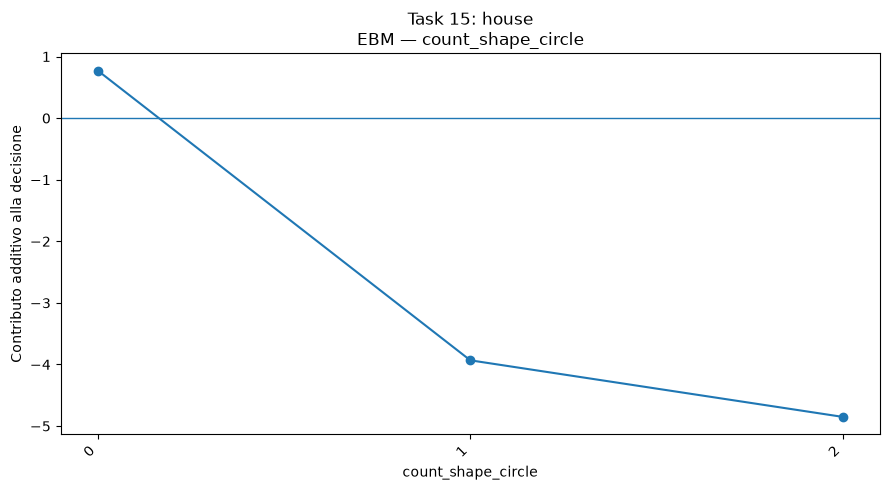

Salvato: ../results/interpretable_models/plots/task_15_ebm_count_shape_circle.png


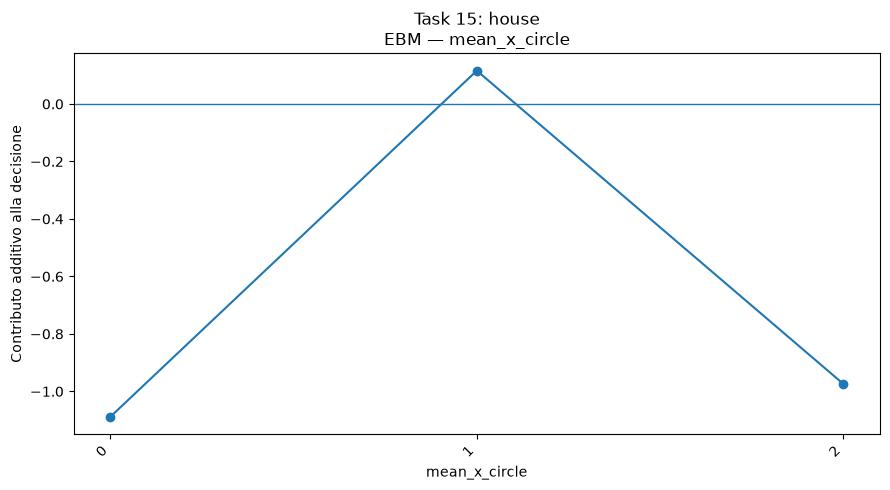

Salvato: ../results/interpretable_models/plots/task_15_ebm_mean_x_circle.png


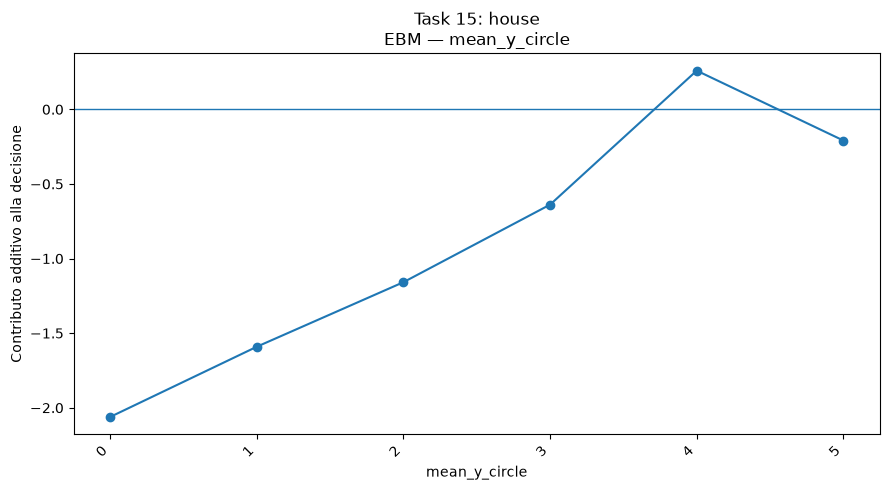

Salvato: ../results/interpretable_models/plots/task_15_ebm_mean_y_circle.png


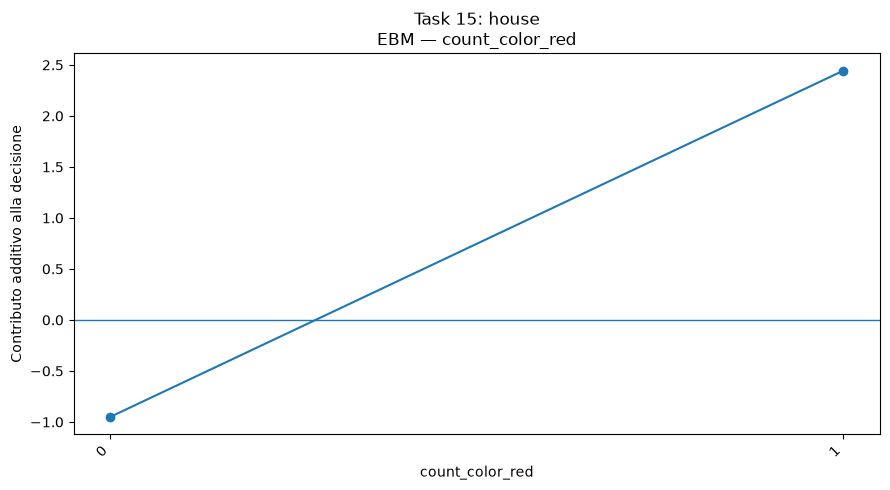

Salvato: ../results/interpretable_models/plots/task_15_ebm_count_color_red.png


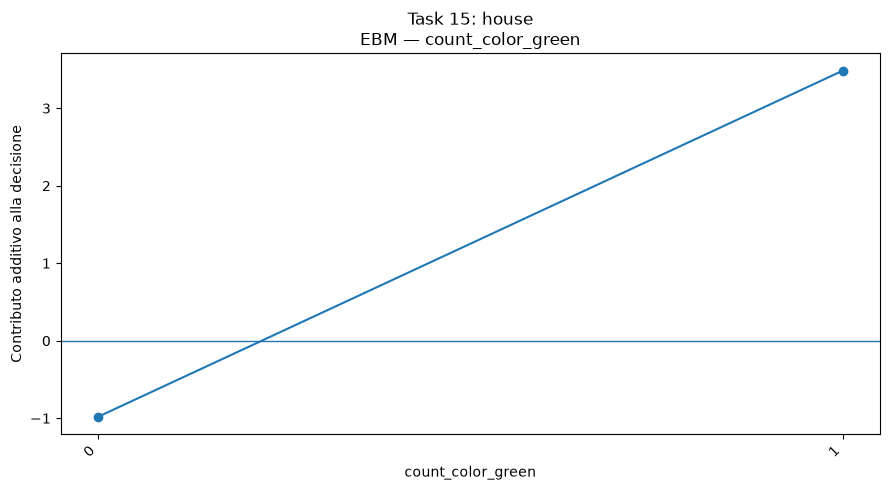

Salvato: ../results/interpretable_models/plots/task_15_ebm_count_color_green.png


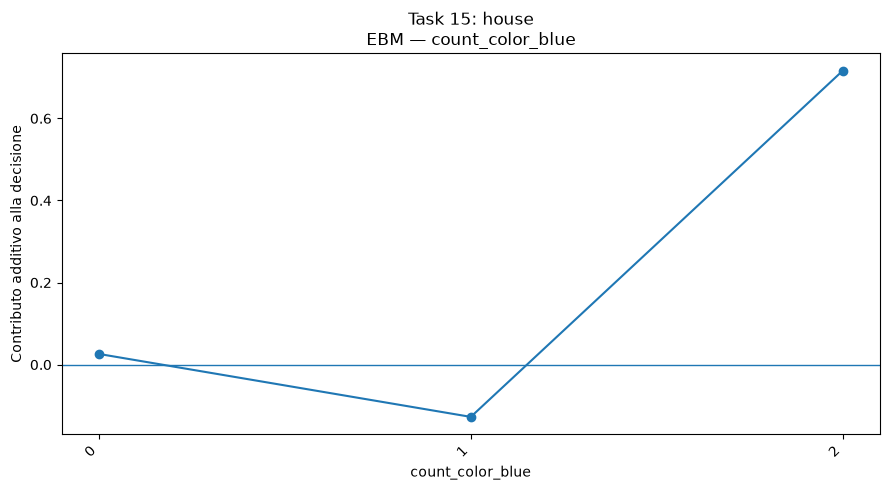

Salvato: ../results/interpretable_models/plots/task_15_ebm_count_color_blue.png


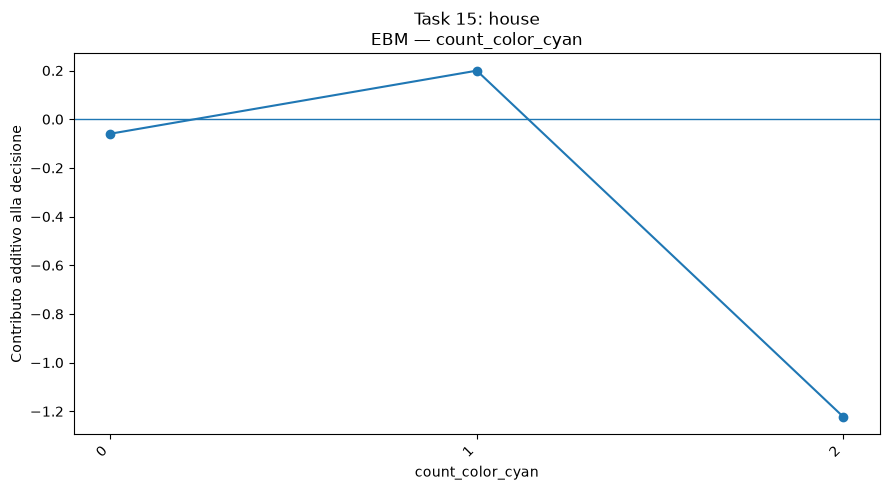

Salvato: ../results/interpretable_models/plots/task_15_ebm_count_color_cyan.png


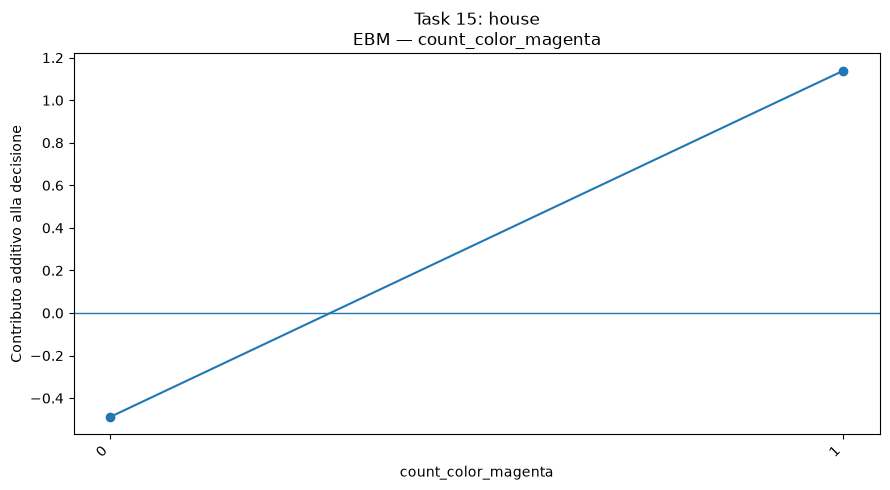

Salvato: ../results/interpretable_models/plots/task_15_ebm_count_color_magenta.png


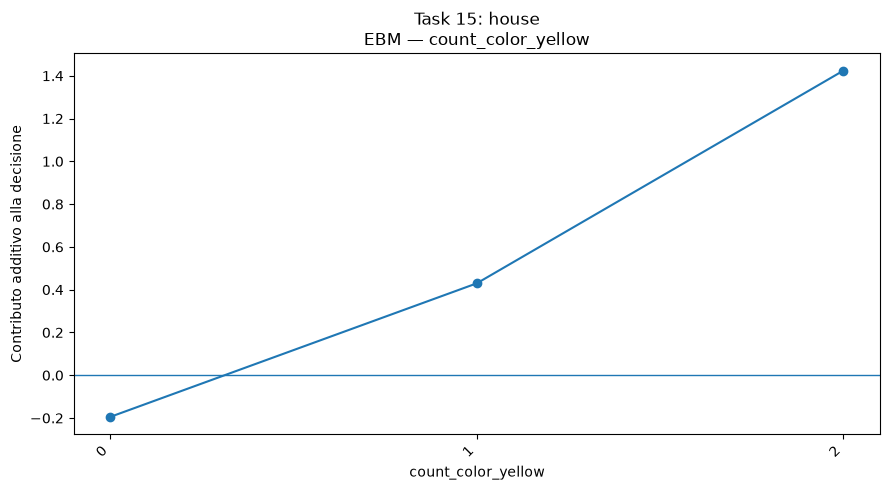

Salvato: ../results/interpretable_models/plots/task_15_ebm_count_color_yellow.png


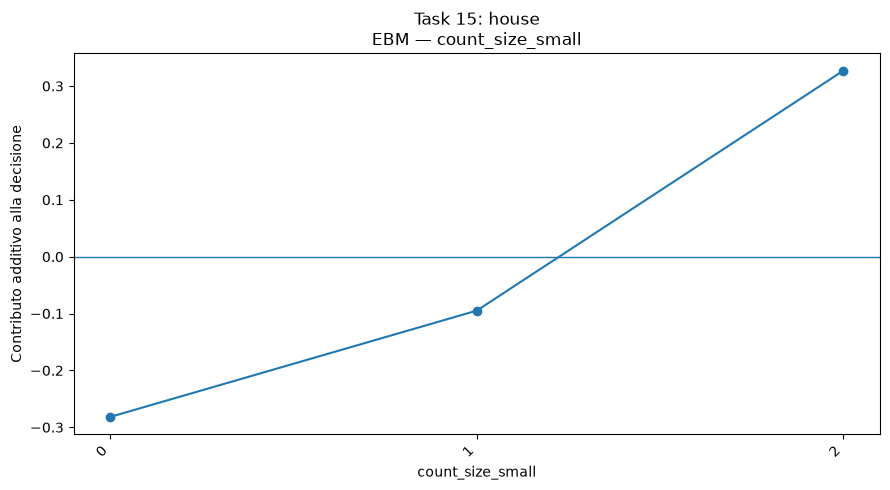

Salvato: ../results/interpretable_models/plots/task_15_ebm_count_size_small.png


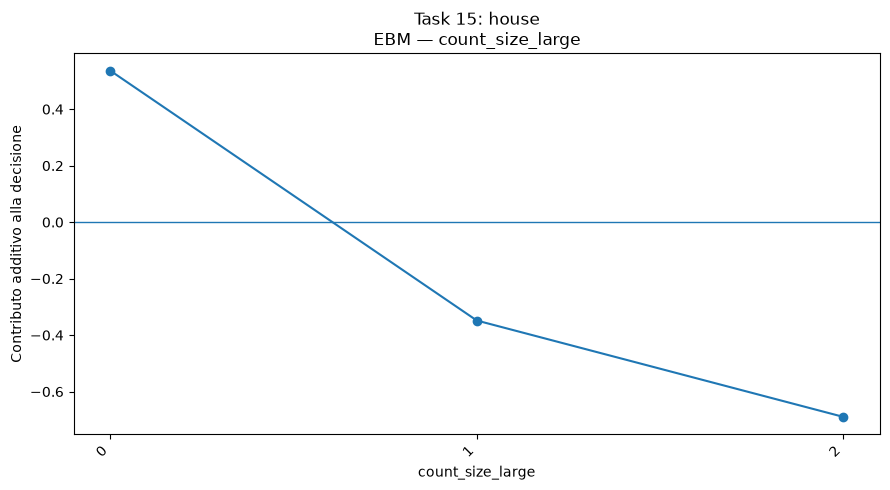

Salvato: ../results/interpretable_models/plots/task_15_ebm_count_size_large.png


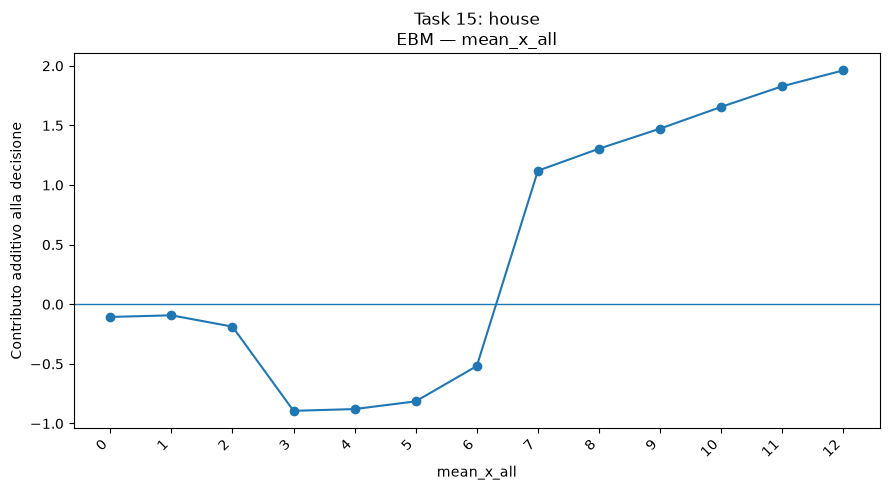

Salvato: ../results/interpretable_models/plots/task_15_ebm_mean_x_all.png


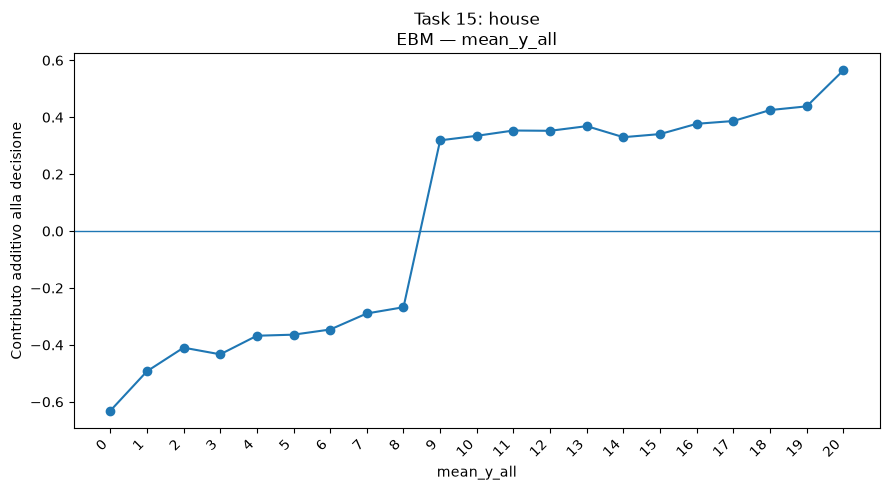

Salvato: ../results/interpretable_models/plots/task_15_ebm_mean_y_all.png


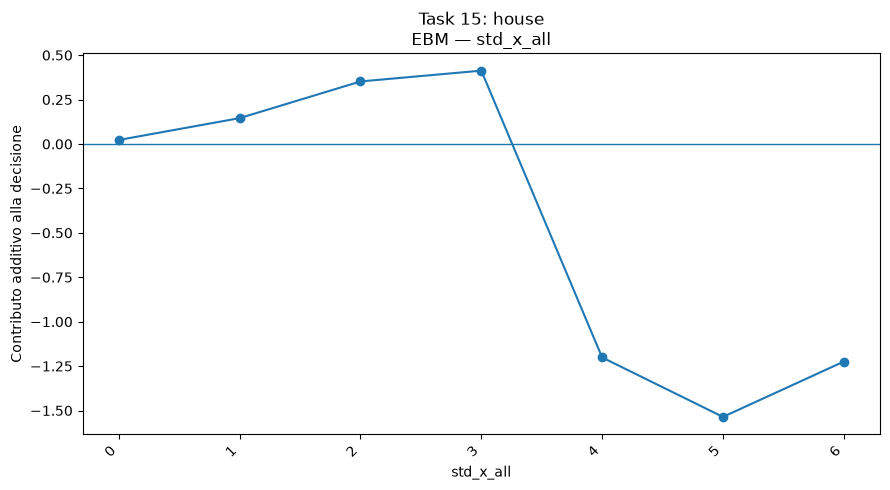

Salvato: ../results/interpretable_models/plots/task_15_ebm_std_x_all.png


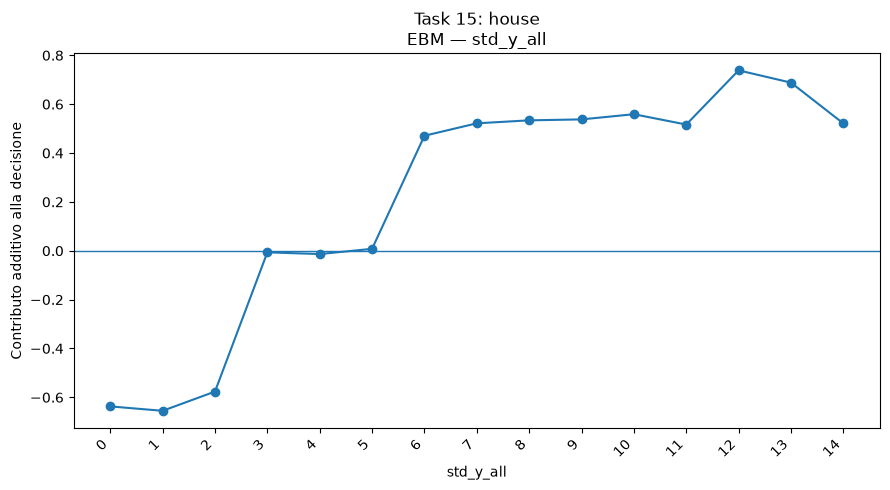

Salvato: ../results/interpretable_models/plots/task_15_ebm_std_y_all.png


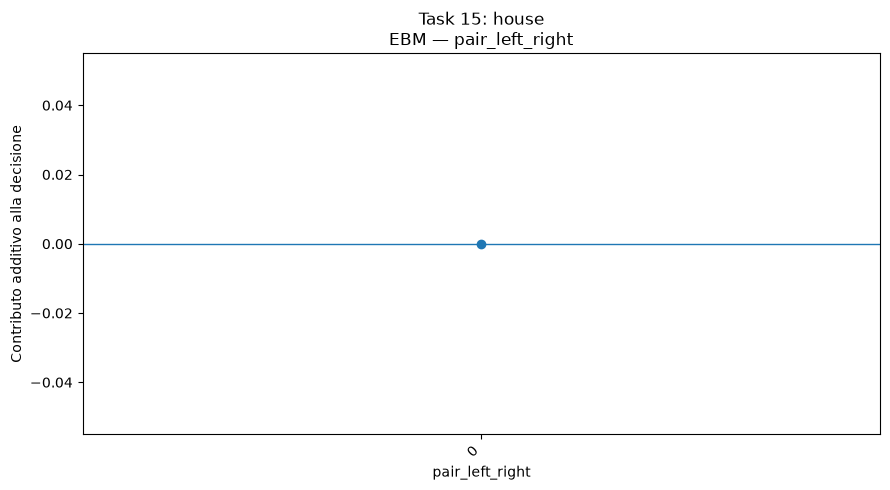

Salvato: ../results/interpretable_models/plots/task_15_ebm_pair_left_right.png


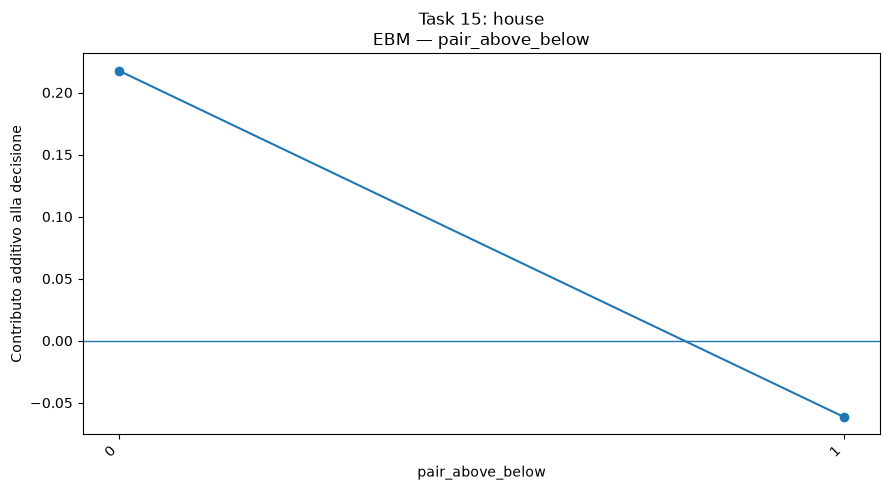

Salvato: ../results/interpretable_models/plots/task_15_ebm_pair_above_below.png


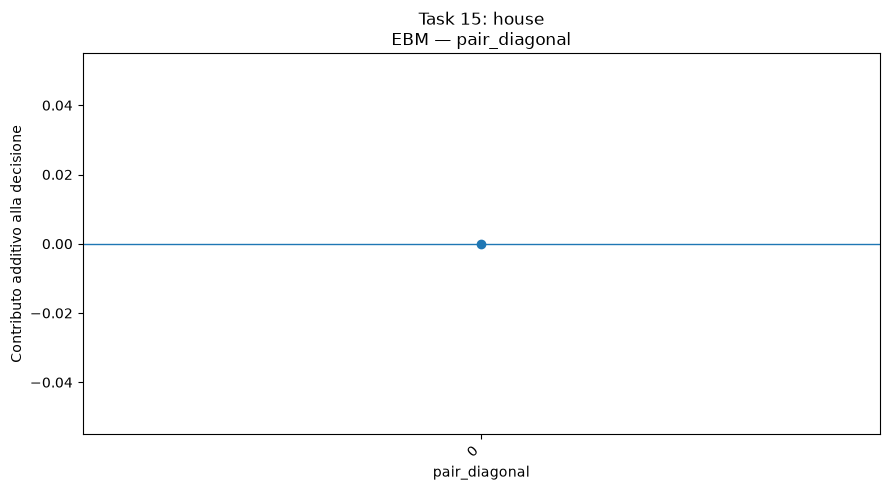

Salvato: ../results/interpretable_models/plots/task_15_ebm_pair_diagonal.png


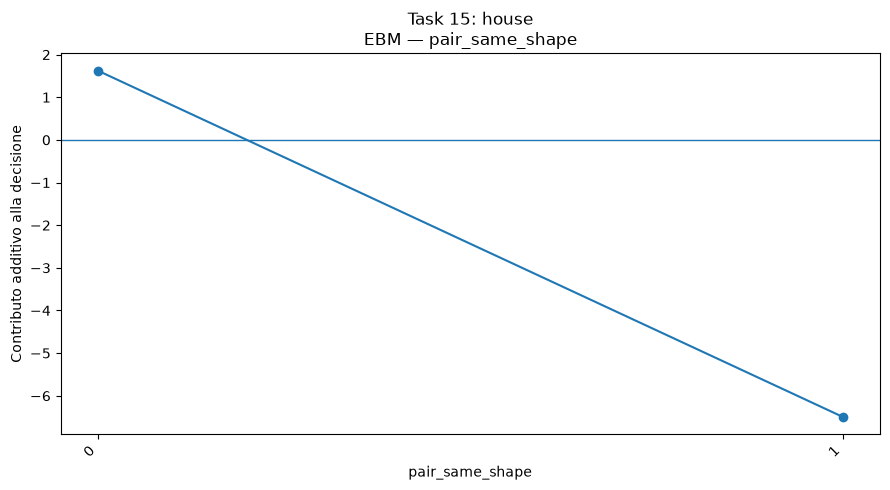

Salvato: ../results/interpretable_models/plots/task_15_ebm_pair_same_shape.png


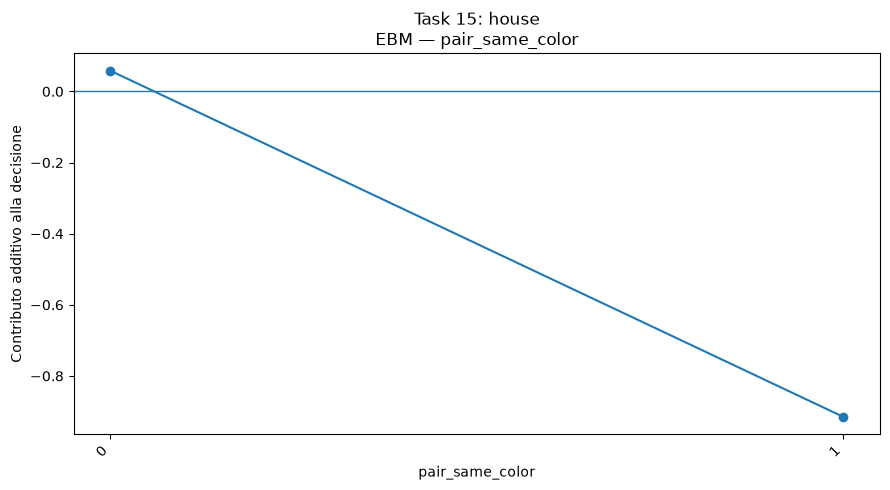

Salvato: ../results/interpretable_models/plots/task_15_ebm_pair_same_color.png


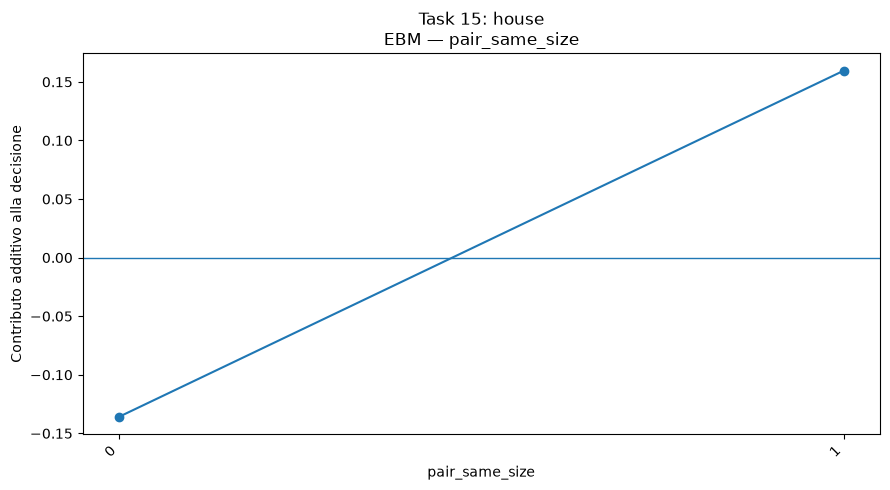

Salvato: ../results/interpretable_models/plots/task_15_ebm_pair_same_size.png


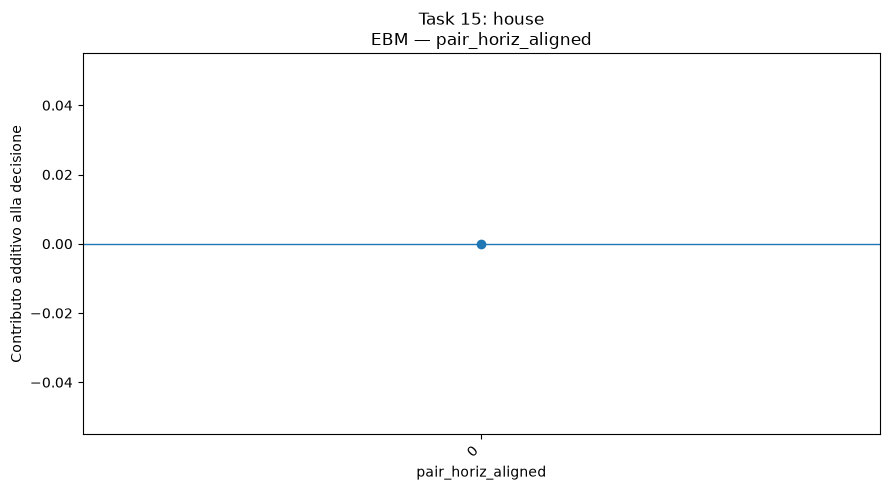

Salvato: ../results/interpretable_models/plots/task_15_ebm_pair_horiz_aligned.png


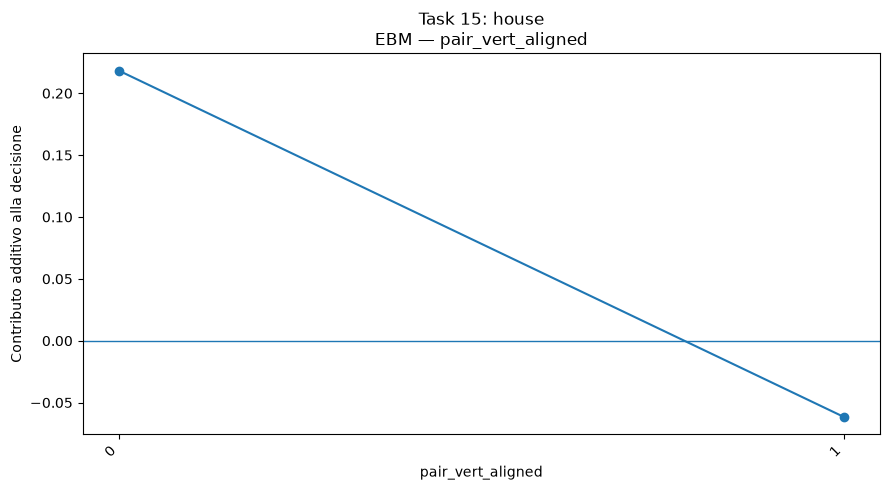

Salvato: ../results/interpretable_models/plots/task_15_ebm_pair_vert_aligned.png


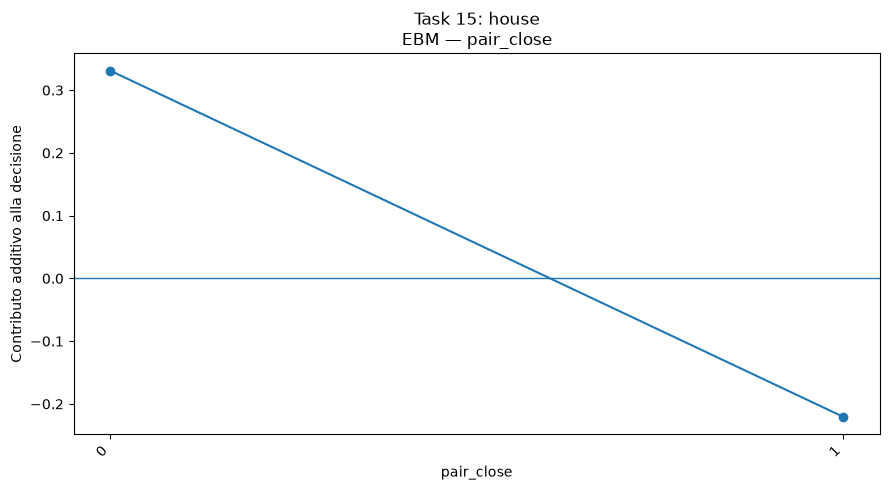

Salvato: ../results/interpretable_models/plots/task_15_ebm_pair_close.png


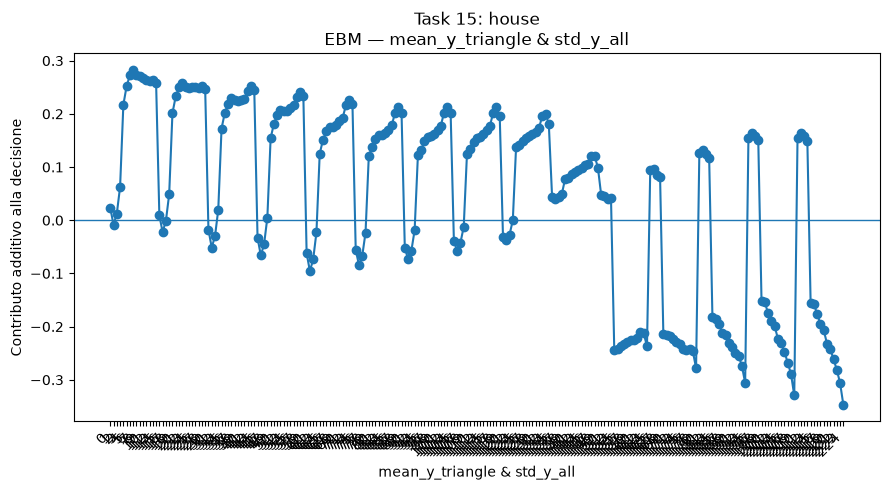

Salvato: ../results/interpretable_models/plots/task_15_ebm_mean_y_triangle_std_y_all.png


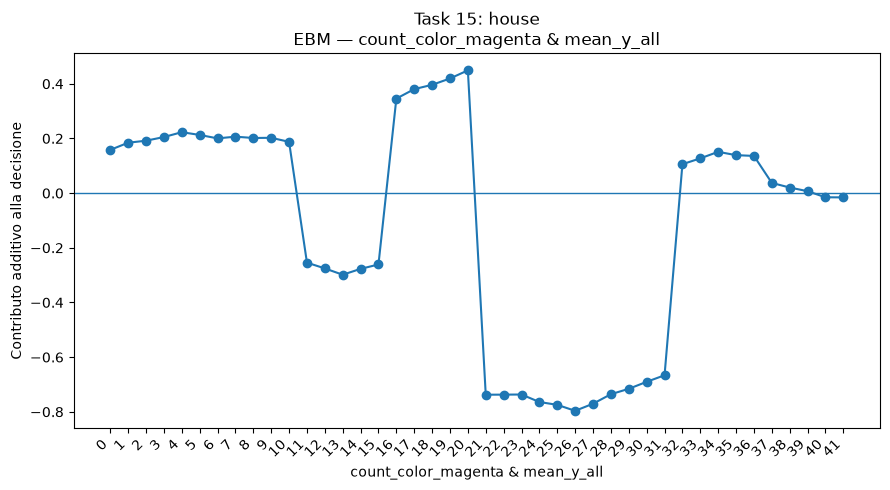

Salvato: ../results/interpretable_models/plots/task_15_ebm_count_color_magenta_mean_y_all.png


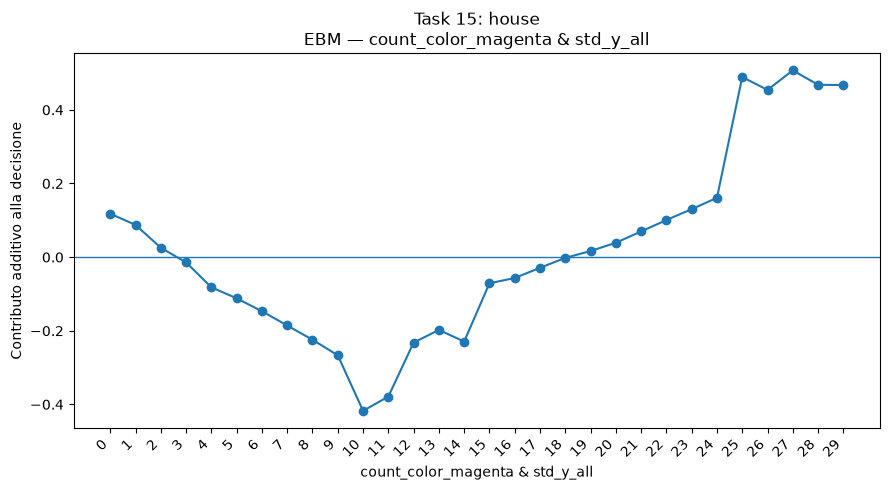

Salvato: ../results/interpretable_models/plots/task_15_ebm_count_color_magenta_std_y_all.png


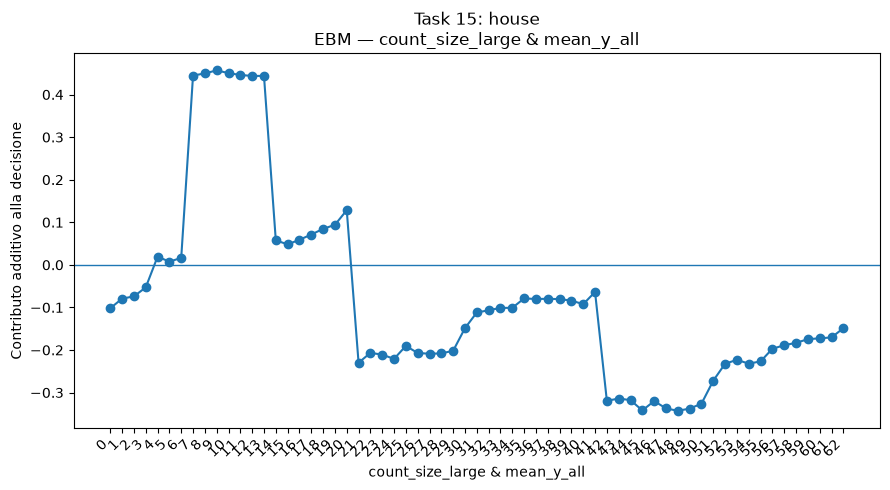

Salvato: ../results/interpretable_models/plots/task_15_ebm_count_size_large_mean_y_all.png


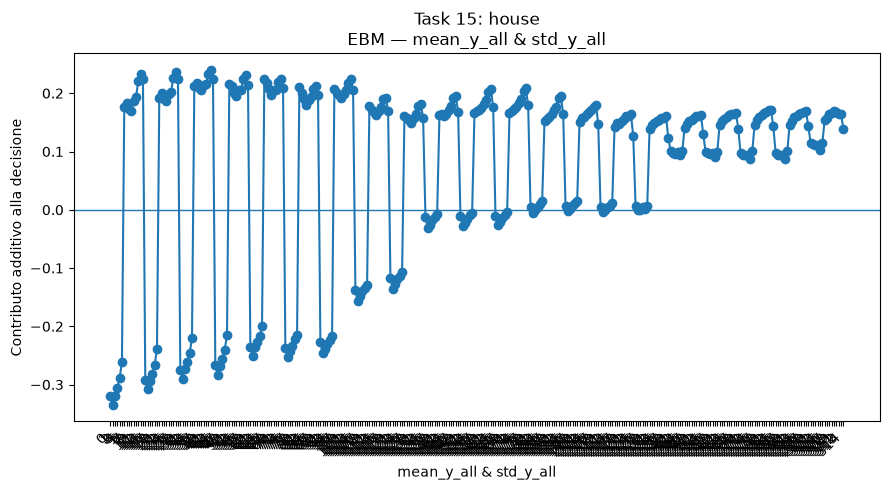

Salvato: ../results/interpretable_models/plots/task_15_ebm_mean_y_all_std_y_all.png


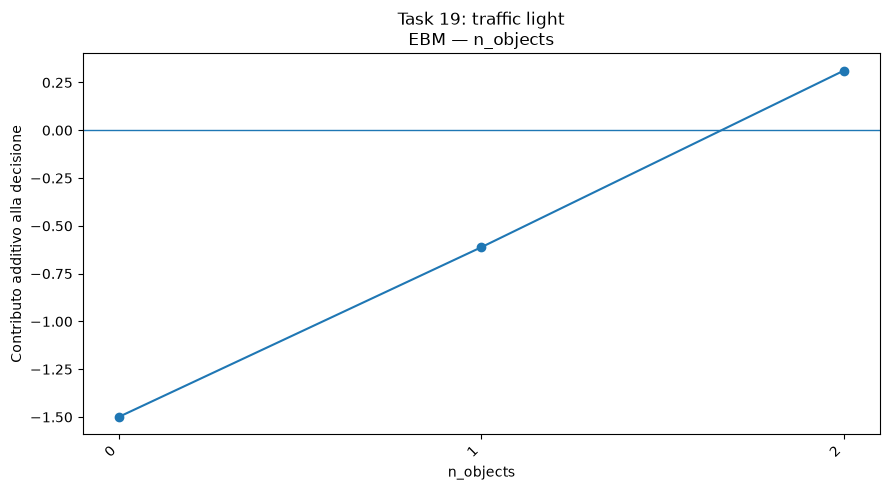

Salvato: ../results/interpretable_models/plots/task_19_ebm_n_objects.png


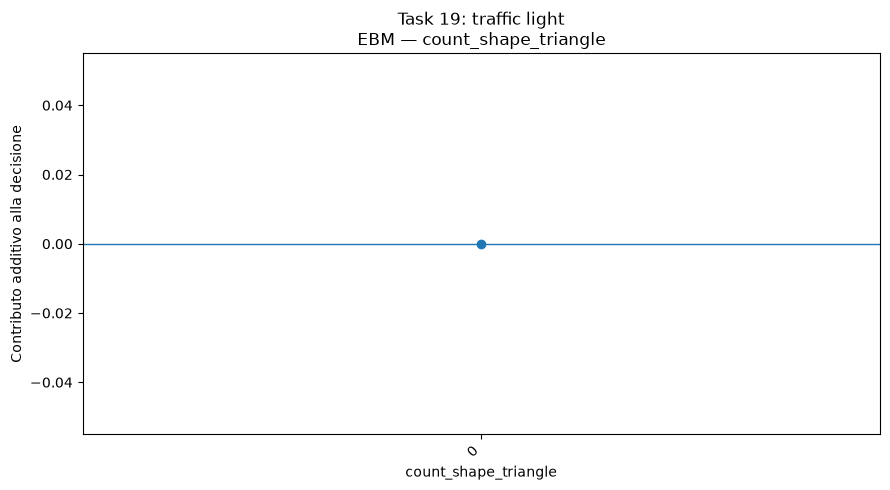

Salvato: ../results/interpretable_models/plots/task_19_ebm_count_shape_triangle.png


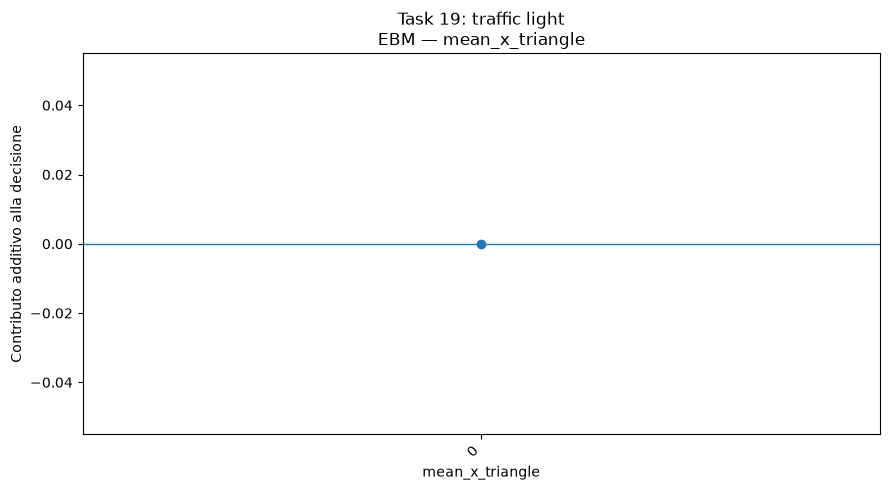

Salvato: ../results/interpretable_models/plots/task_19_ebm_mean_x_triangle.png


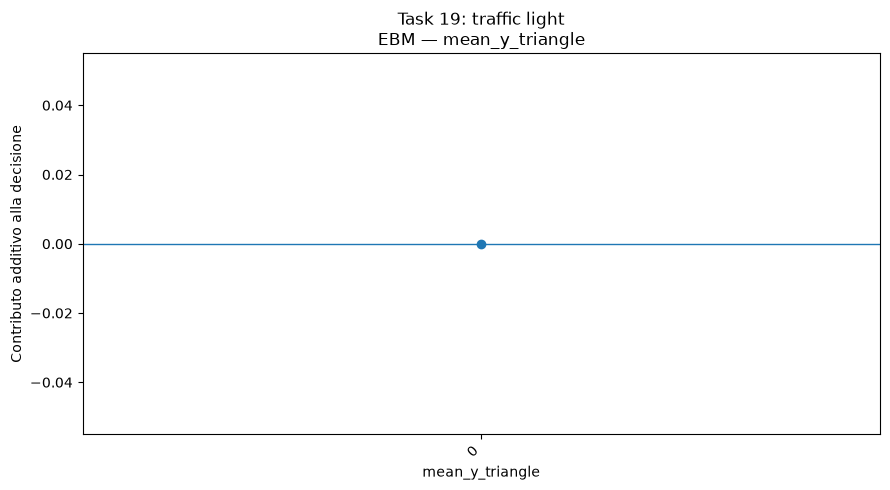

Salvato: ../results/interpretable_models/plots/task_19_ebm_mean_y_triangle.png


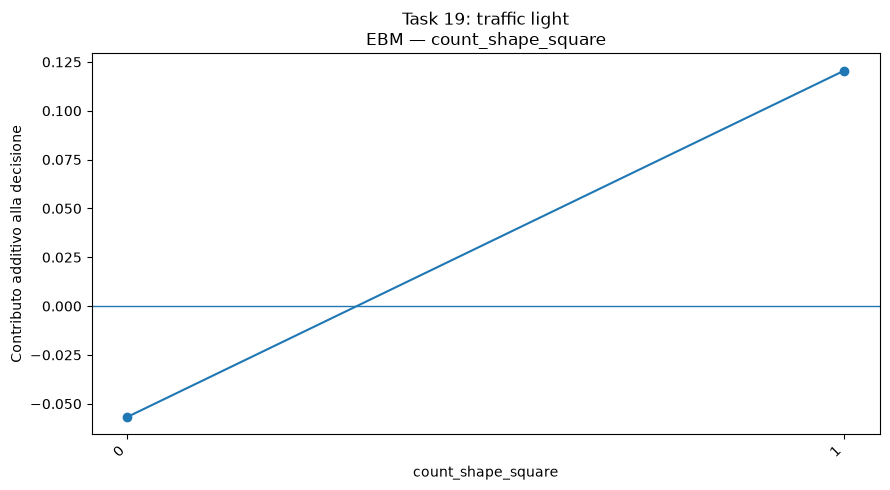

Salvato: ../results/interpretable_models/plots/task_19_ebm_count_shape_square.png


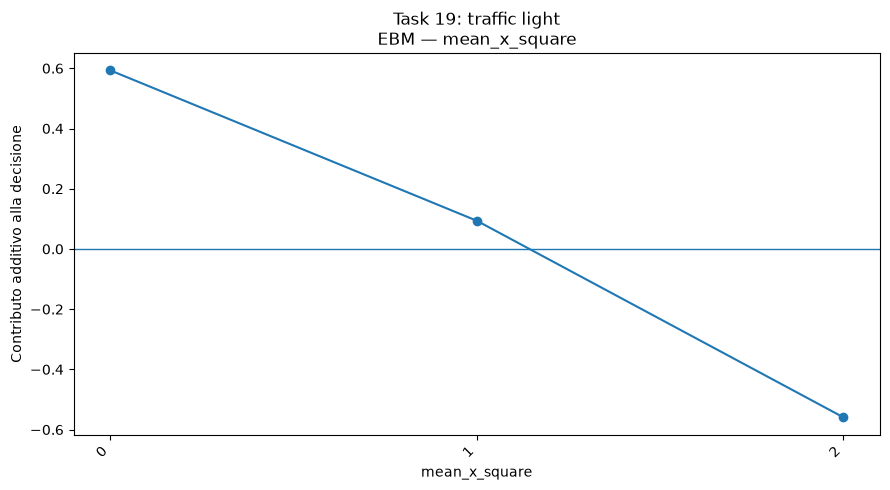

Salvato: ../results/interpretable_models/plots/task_19_ebm_mean_x_square.png


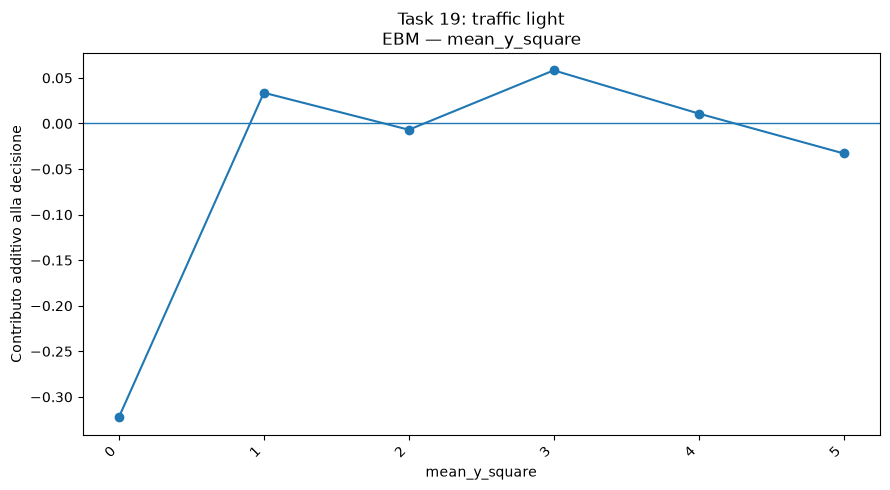

Salvato: ../results/interpretable_models/plots/task_19_ebm_mean_y_square.png


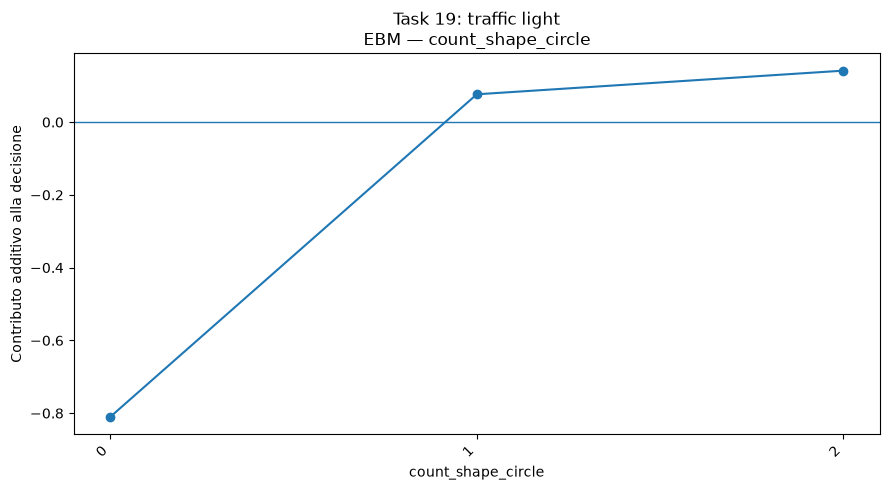

Salvato: ../results/interpretable_models/plots/task_19_ebm_count_shape_circle.png


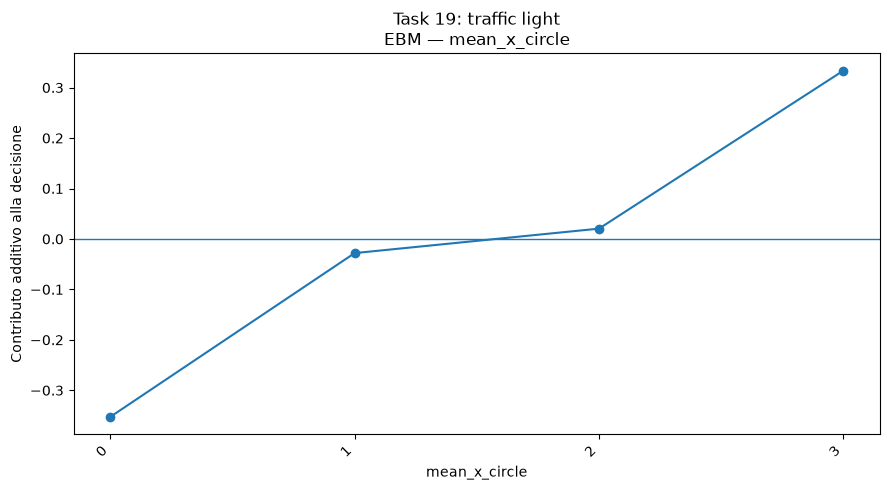

Salvato: ../results/interpretable_models/plots/task_19_ebm_mean_x_circle.png


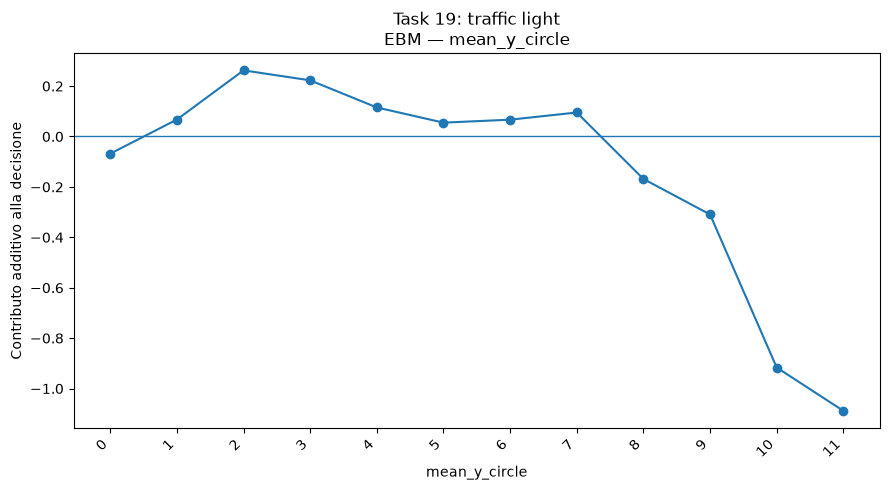

Salvato: ../results/interpretable_models/plots/task_19_ebm_mean_y_circle.png


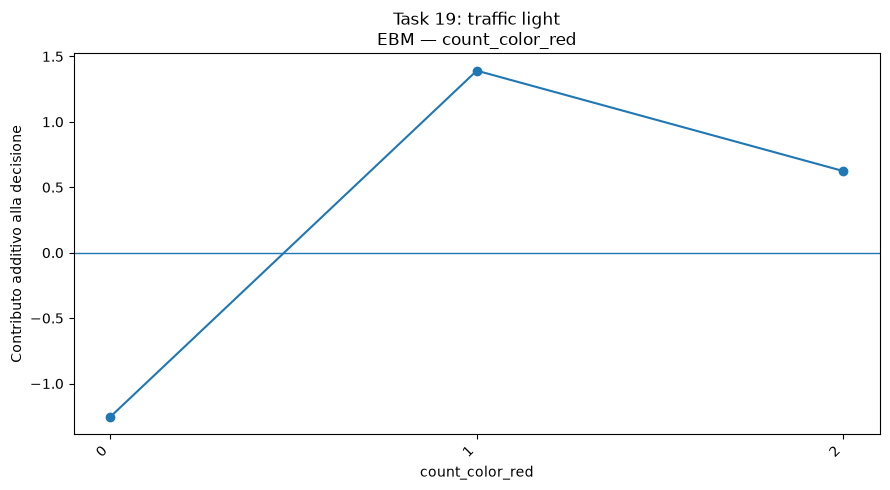

Salvato: ../results/interpretable_models/plots/task_19_ebm_count_color_red.png


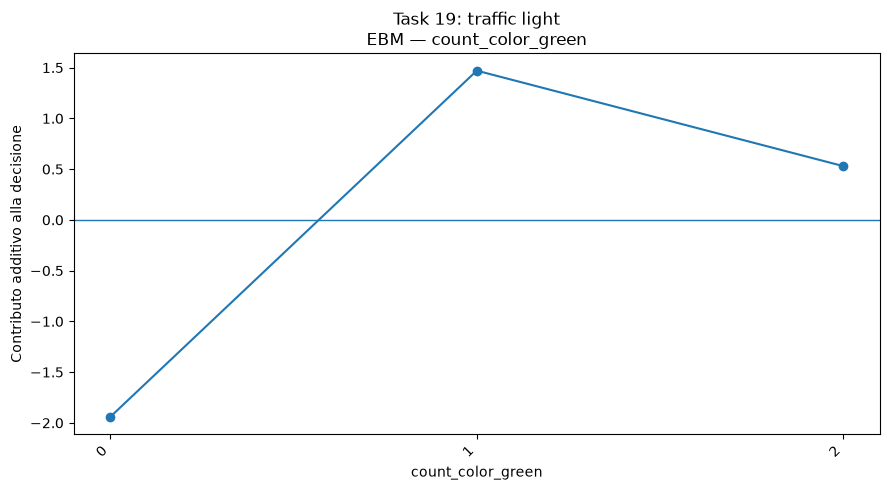

Salvato: ../results/interpretable_models/plots/task_19_ebm_count_color_green.png


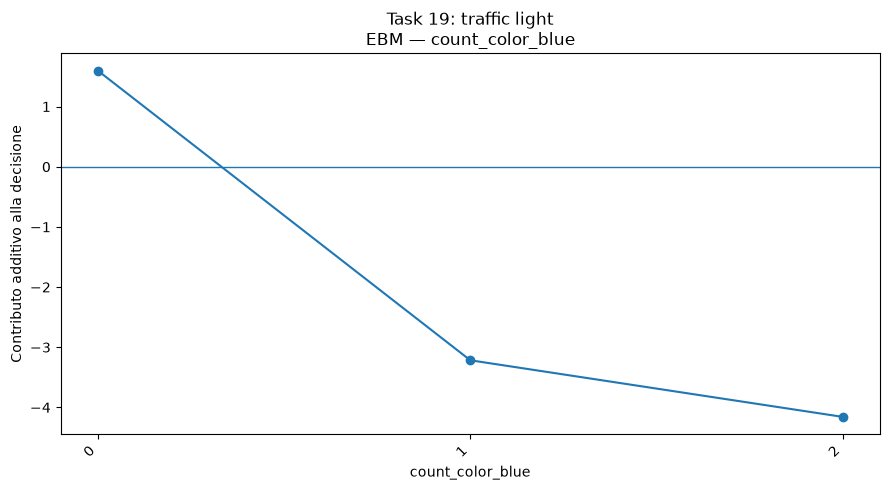

Salvato: ../results/interpretable_models/plots/task_19_ebm_count_color_blue.png


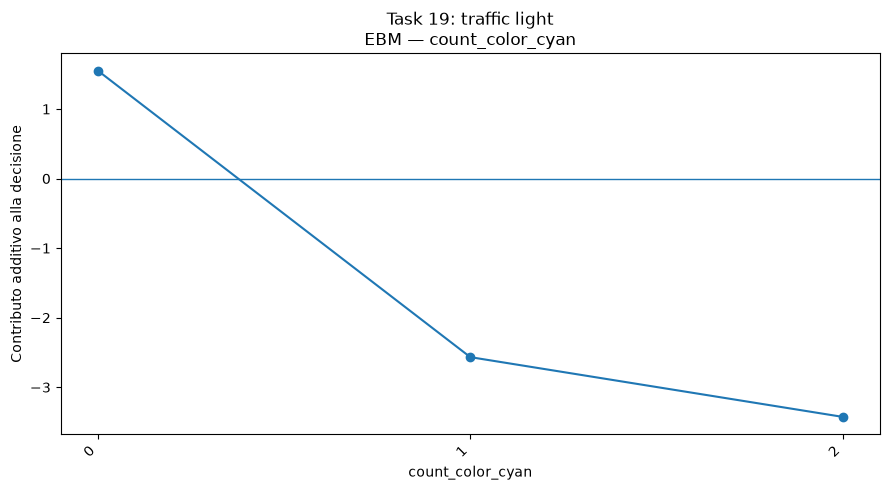

Salvato: ../results/interpretable_models/plots/task_19_ebm_count_color_cyan.png


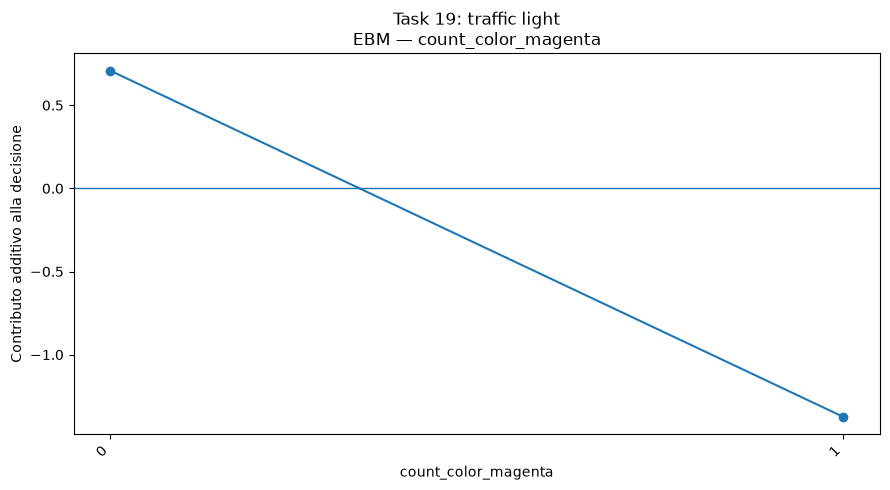

Salvato: ../results/interpretable_models/plots/task_19_ebm_count_color_magenta.png


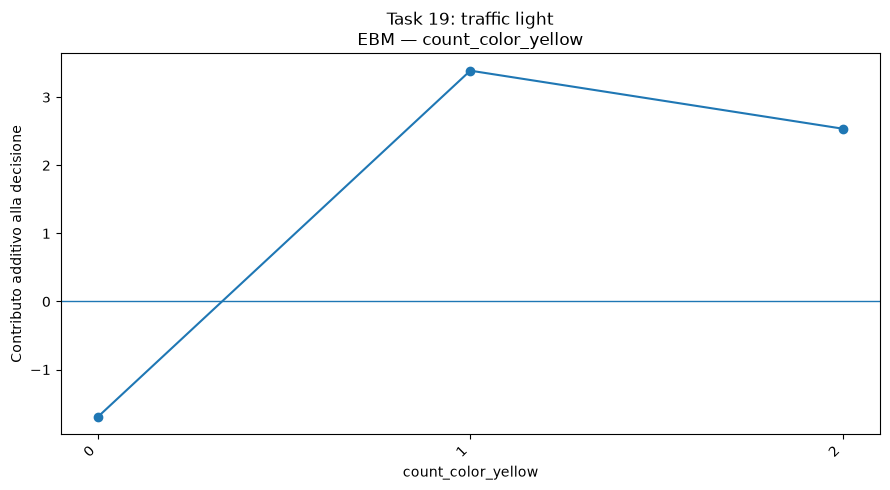

Salvato: ../results/interpretable_models/plots/task_19_ebm_count_color_yellow.png


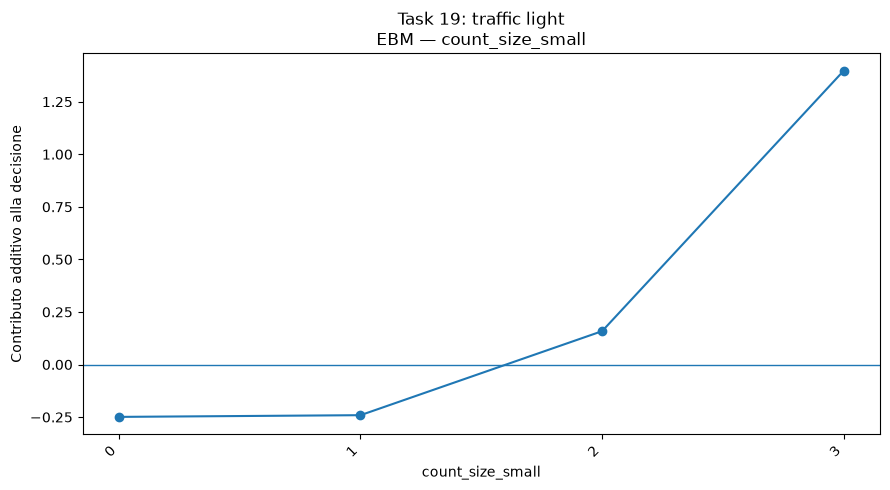

Salvato: ../results/interpretable_models/plots/task_19_ebm_count_size_small.png


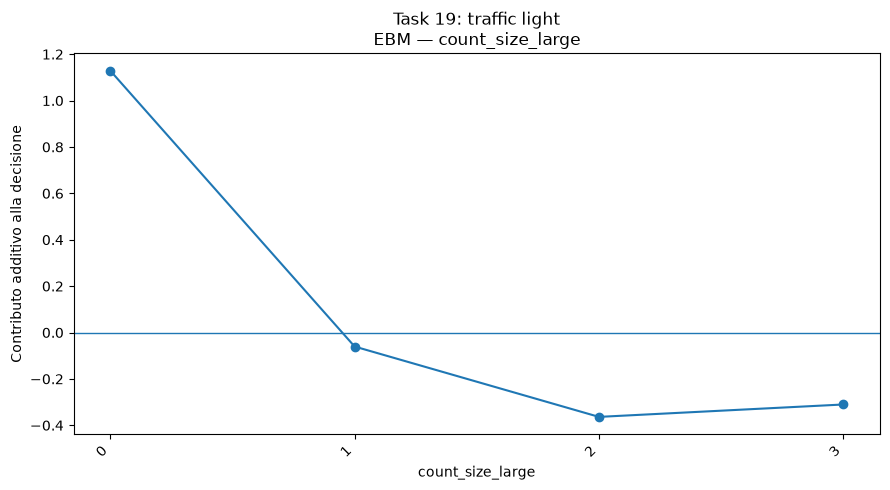

Salvato: ../results/interpretable_models/plots/task_19_ebm_count_size_large.png


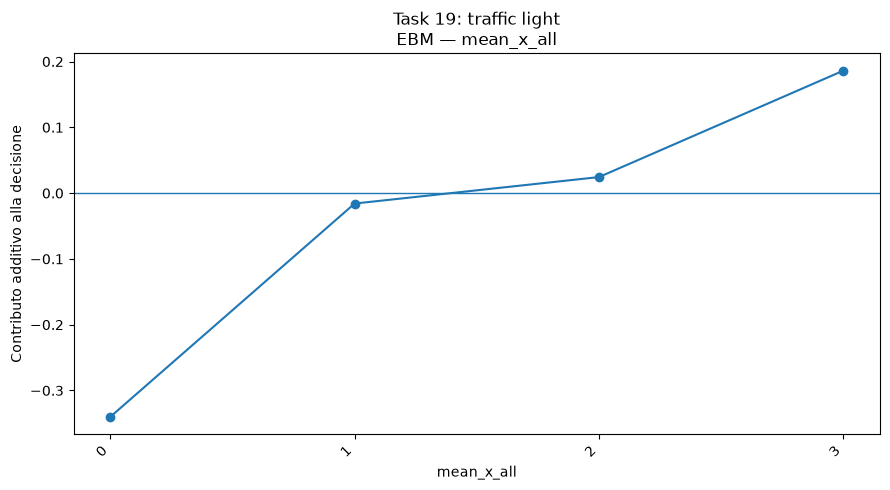

Salvato: ../results/interpretable_models/plots/task_19_ebm_mean_x_all.png


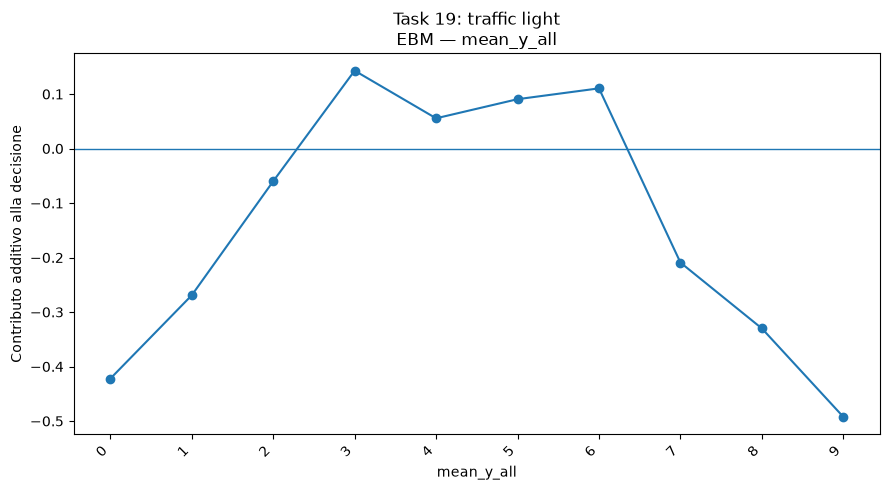

Salvato: ../results/interpretable_models/plots/task_19_ebm_mean_y_all.png


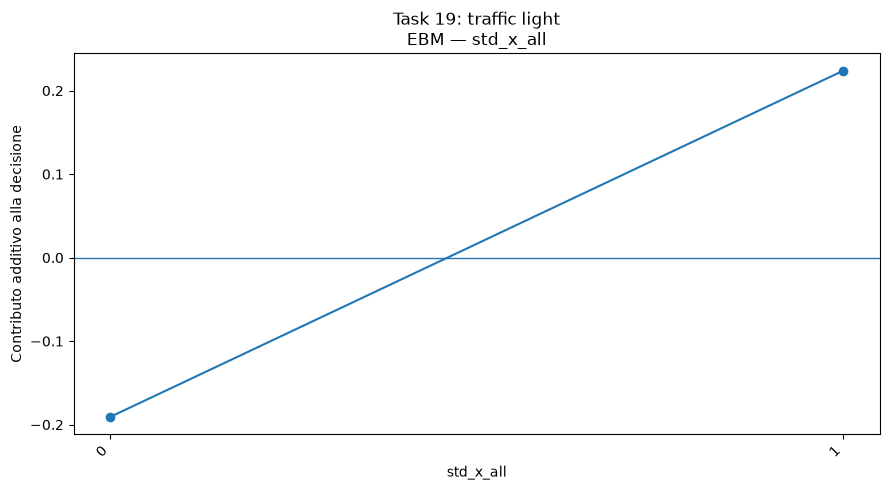

Salvato: ../results/interpretable_models/plots/task_19_ebm_std_x_all.png


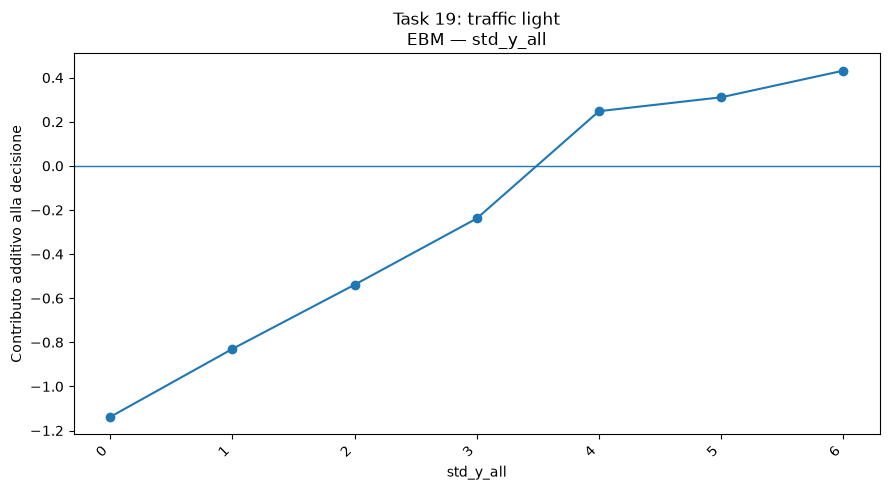

Salvato: ../results/interpretable_models/plots/task_19_ebm_std_y_all.png


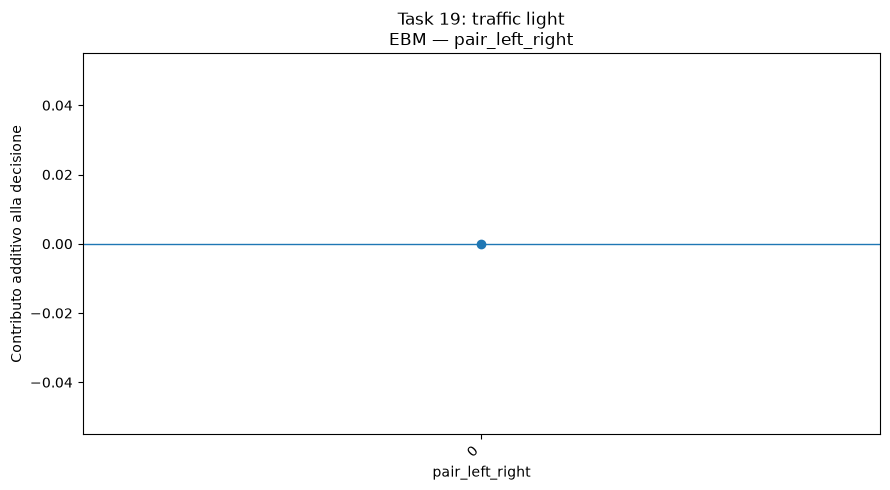

Salvato: ../results/interpretable_models/plots/task_19_ebm_pair_left_right.png


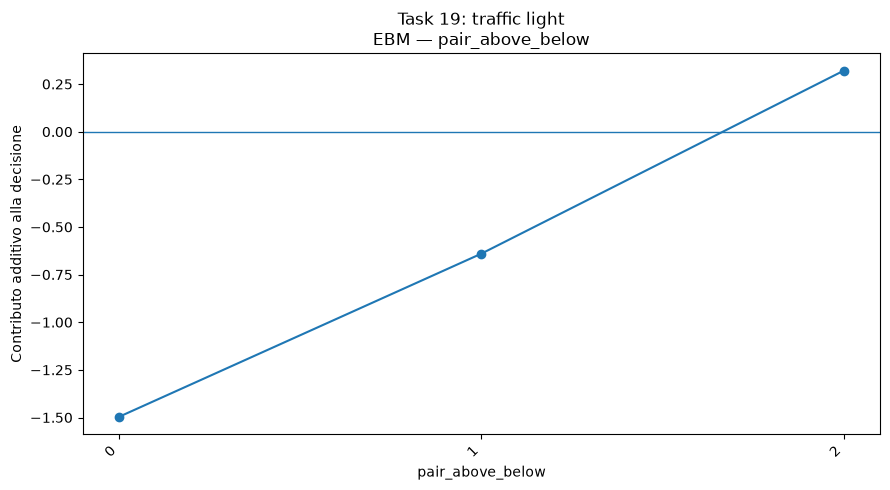

Salvato: ../results/interpretable_models/plots/task_19_ebm_pair_above_below.png


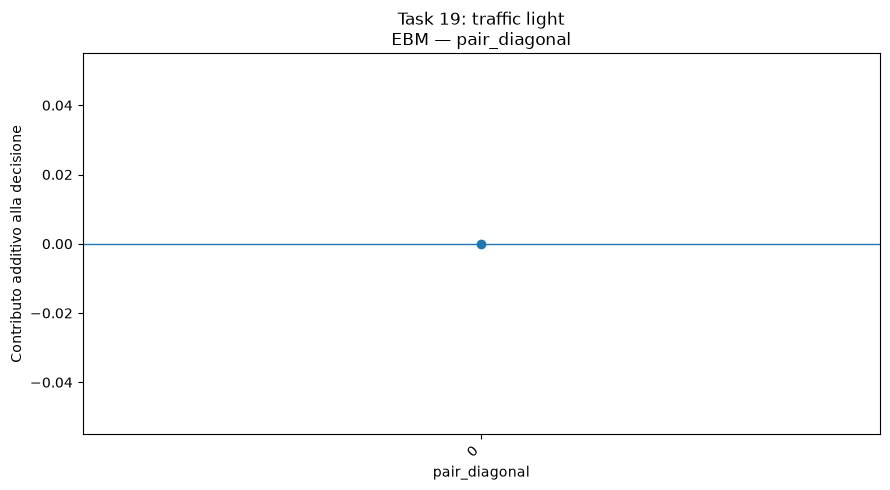

Salvato: ../results/interpretable_models/plots/task_19_ebm_pair_diagonal.png


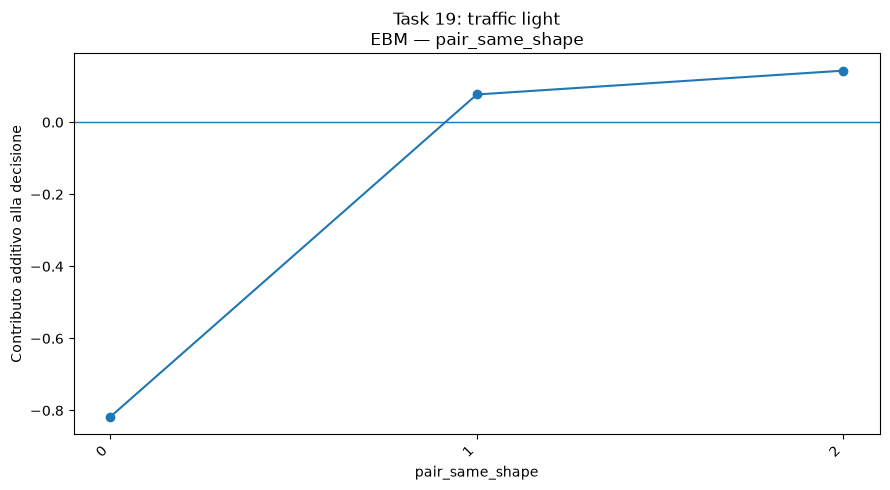

Salvato: ../results/interpretable_models/plots/task_19_ebm_pair_same_shape.png


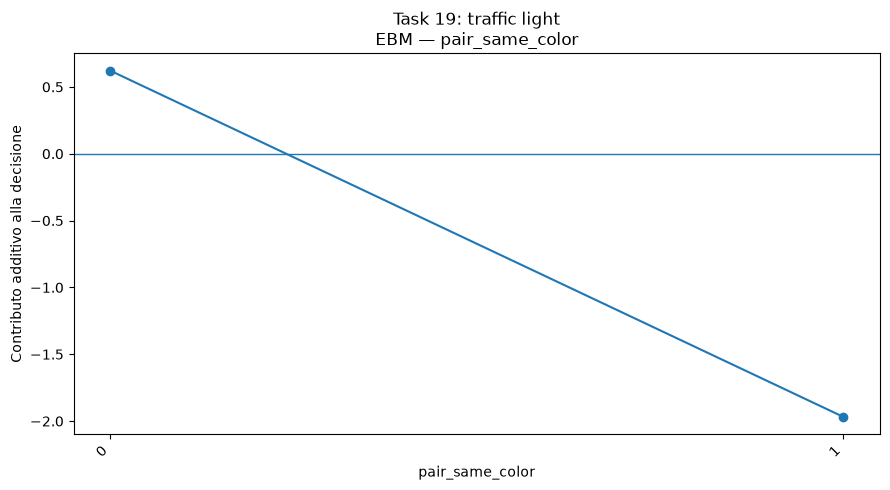

Salvato: ../results/interpretable_models/plots/task_19_ebm_pair_same_color.png


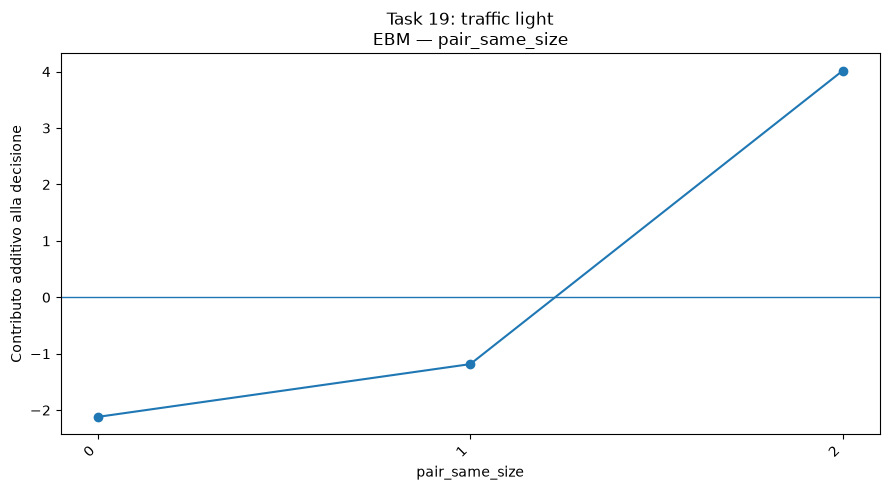

Salvato: ../results/interpretable_models/plots/task_19_ebm_pair_same_size.png


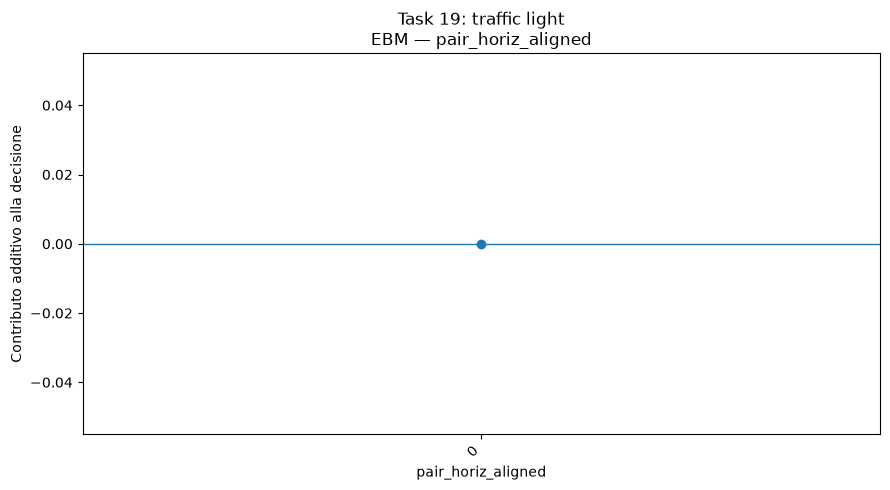

Salvato: ../results/interpretable_models/plots/task_19_ebm_pair_horiz_aligned.png


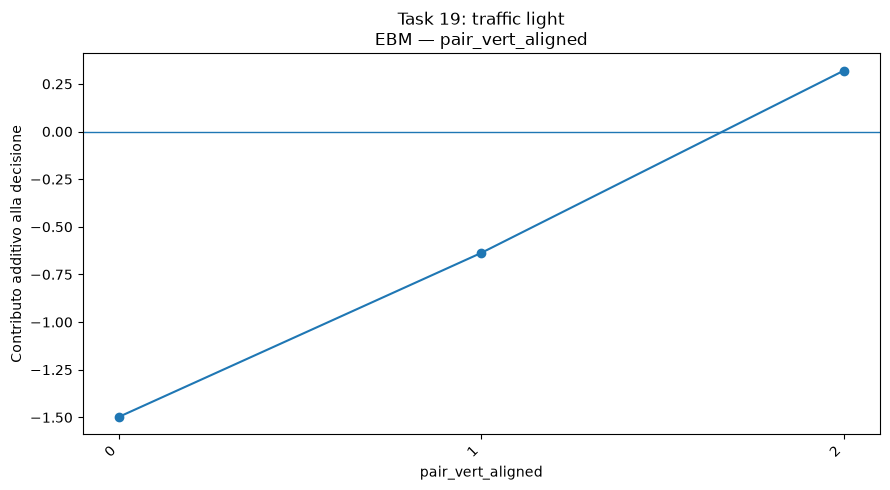

Salvato: ../results/interpretable_models/plots/task_19_ebm_pair_vert_aligned.png


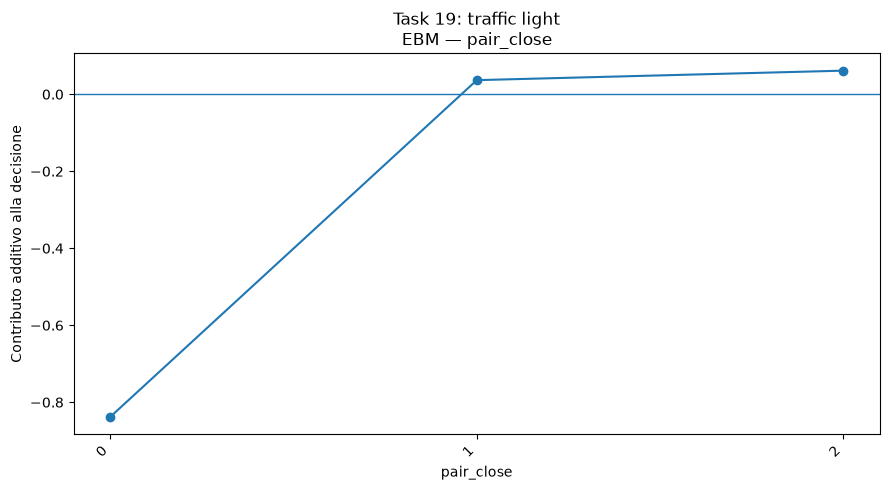

Salvato: ../results/interpretable_models/plots/task_19_ebm_pair_close.png


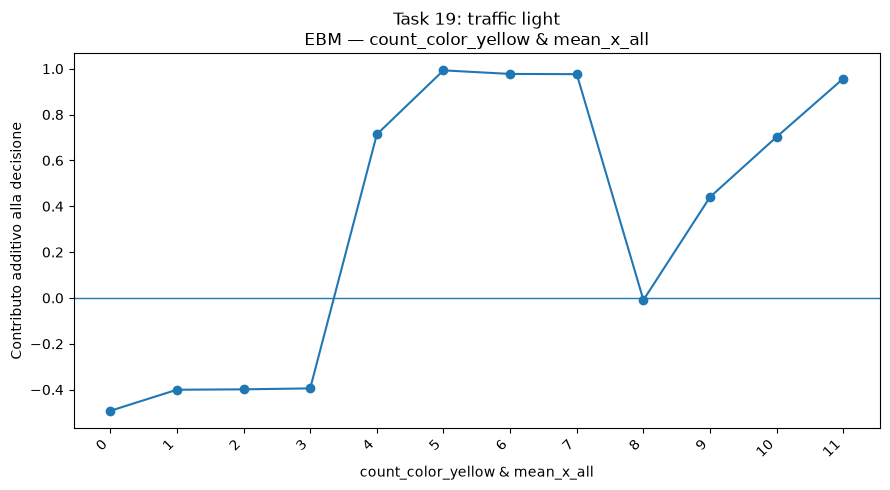

Salvato: ../results/interpretable_models/plots/task_19_ebm_count_color_yellow_mean_x_all.png


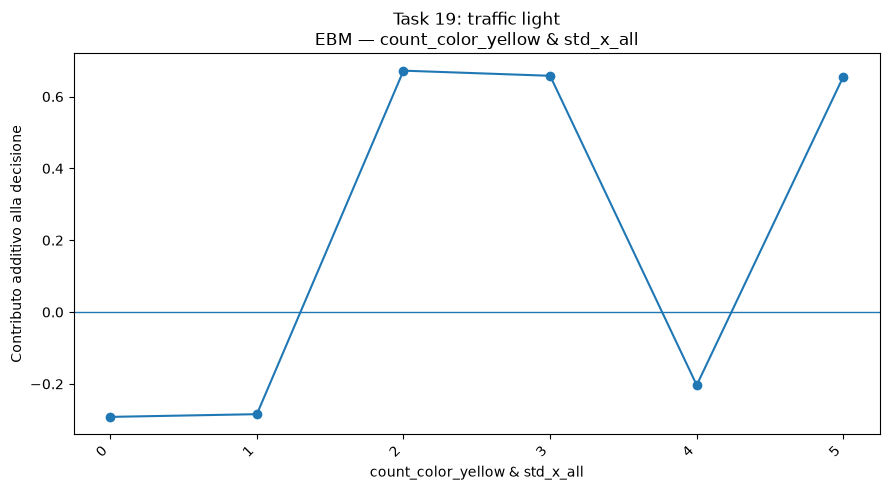

Salvato: ../results/interpretable_models/plots/task_19_ebm_count_color_yellow_std_x_all.png


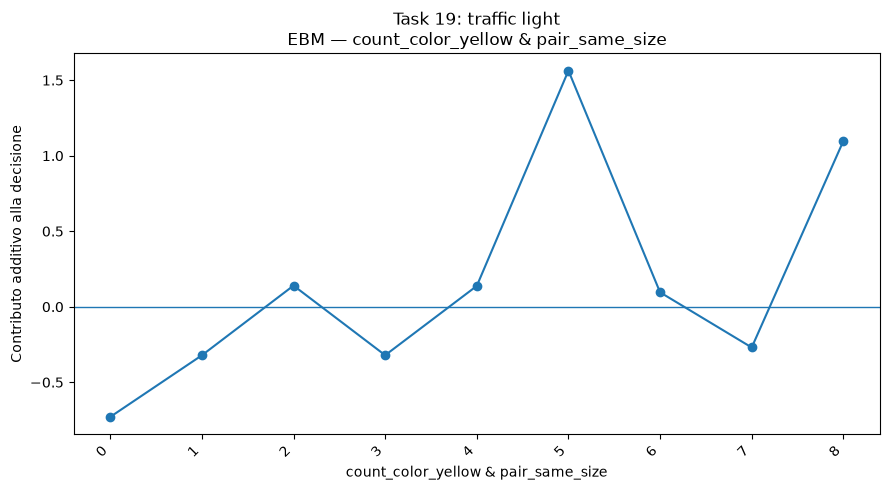

Salvato: ../results/interpretable_models/plots/task_19_ebm_count_color_yellow_pair_same_size.png


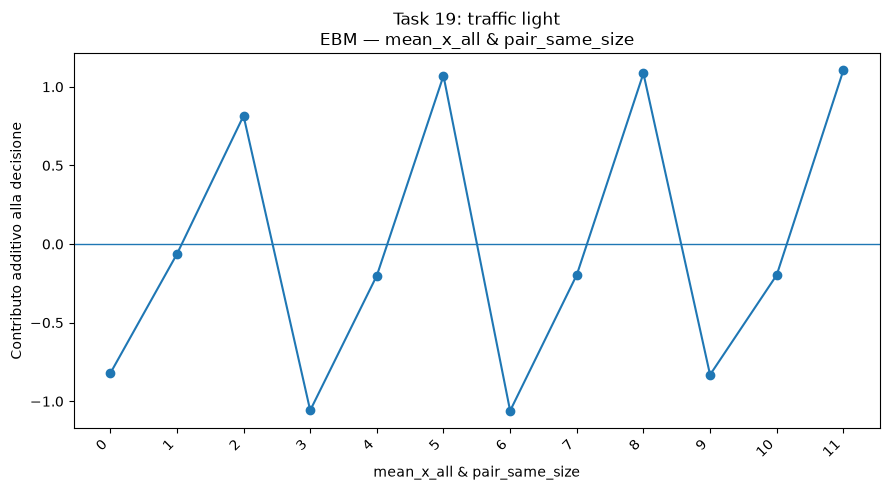

Salvato: ../results/interpretable_models/plots/task_19_ebm_mean_x_all_pair_same_size.png


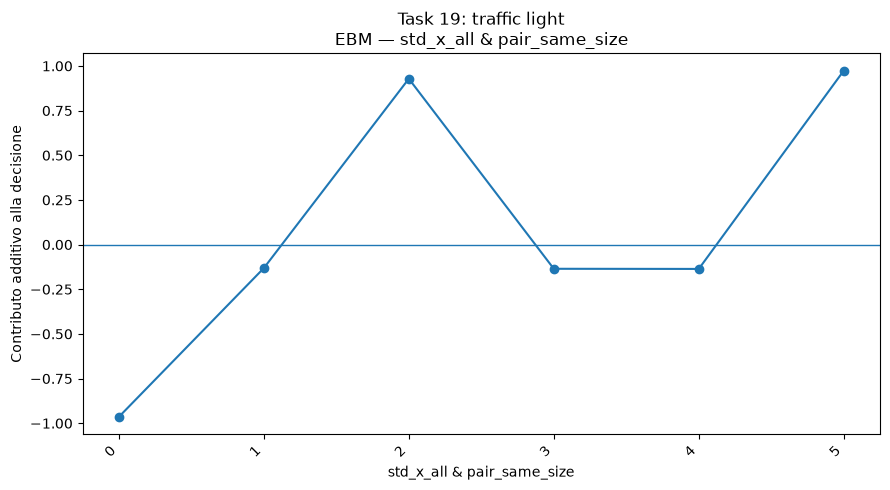

Salvato: ../results/interpretable_models/plots/task_19_ebm_std_x_all_pair_same_size.png

Operazione completata.
Cartella finale:
/home/cosimo/Downloads/kandy-xai/results/interpretable_models/plots


In [27]:
from pathlib import Path
import re
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# CARTELLA DI SALVATAGGIO
# ============================================================

PLOT_DIR = Path("../results/interpretable_models/plots")
PLOT_DIR.mkdir(parents=True, exist_ok=True)

print("Salvataggio grafici in:")
print(PLOT_DIR.resolve())


# ============================================================
# FUNZIONE PER RENDERE SICURO IL NOME DEL FILE
# ============================================================

def safe_filename(name):
    name = str(name)
    name = re.sub(r"[^\w\-]+", "_", name)
    return name.strip("_")


# ============================================================
# CURVE DEI TERMINI EBM
# ============================================================

def save_ebm_curves(model, task_id, save_dir):
    """
    Salva una figura separata per ogni termine dell'EBM.

    Per ogni termine vengono visualizzati:
    - valori sull'asse x;
    - contributo additivo sull'asse y;
    - linea orizzontale a 0.

    Il nome del file contiene il nome del termine.
    """

    if model is None:
        print(f"Task {task_id}: EBM non disponibile.")
        return

    explanation = model.explain_global()

    for term_idx, term_name in enumerate(model.term_names_):

        try:
            data = explanation.data(term_idx)

            names = data.get("names", [])
            scores = data.get("scores", [])

            if scores is None or len(scores) == 0:
                continue

            scores = np.asarray(scores, dtype=float)

            # ------------------------------------------------
            # Alcuni termini possono avere struttura più complessa.
            # Per il caso univariato standard tracciamo direttamente.
            # ------------------------------------------------

            if scores.ndim != 1:
                scores = np.ravel(scores)

            # Se names non è disponibile, usa gli indici
            if names is None or len(names) != len(scores):
                names = np.arange(len(scores))

            # ------------------------------------------------
            # Figura
            # ------------------------------------------------

            fig, ax = plt.subplots(figsize=(9, 5))

            x = np.arange(len(scores))

            ax.plot(
                x,
                scores,
                marker="o",
            )

            ax.axhline(
                0,
                linewidth=1,
            )

            ax.set_xticks(x)
            ax.set_xticklabels(
                [str(v) for v in names],
                rotation=45,
                ha="right",
            )

            ax.set_title(
                f"Task {task_id}: {TASK_NAMES[task_id]}\n"
                f"EBM — {term_name}"
            )

            ax.set_xlabel(str(term_name))
            ax.set_ylabel("Contributo additivo alla decisione")

            plt.tight_layout()

            # ------------------------------------------------
            # Nome file
            # ------------------------------------------------

            clean_name = safe_filename(term_name)

            filename = (
                f"task_{task_id}_ebm_{clean_name}.png"
            )

            path = save_dir / filename

            plt.savefig(
                path,
                dpi=200,
                bbox_inches="tight",
            )

            plt.show()
            plt.close(fig)

            print(f"Salvato: {path}")

        except Exception as e:

            print(
                f"Errore nel termine {term_idx} "
                f"({term_name}) del task {task_id}: {e}"
            )


# ============================================================
# ESECUZIONE SU TUTTI I TASK SCELTI
# ============================================================

for task_id in EXPLAIN_TASKS:

    _, _, ebm = explanation_models[task_id]

    save_ebm_curves(
        model=ebm,
        task_id=task_id,
        save_dir=PLOT_DIR,
    )

print("\nOperazione completata.")
print("Cartella finale:")
print(PLOT_DIR.resolve())

## 7. Confronto tra rappresentazioni

Confrontiamo direttamente le due rappresentazioni per capire se le relazioni generiche aggiungono informazione utile.

L'obiettivo non è ottenere un aumento artificiale della complessità, ma verificare quanto una descrizione percettiva generica riesca a catturare la struttura delle task.


In [19]:
left = results_perc[
    ["task_id", "task", "f1"]
].rename(
    columns={
        "f1": "f1_perceptual",
    }
)

right = results_all[
    ["task_id", "f1", "model"]
].rename(
    columns={
        "f1": "f1_perceptual_plus_relations",
        "model": "best_model",
    }
)

comparison = left.merge(
    right,
    on="task_id",
    how="outer",
    validate="one_to_one",
)

comparison["delta_f1"] = (
    comparison["f1_perceptual_plus_relations"]
    - comparison["f1_perceptual"]
)

display(
    comparison.sort_values("task_id")
)

summary = pd.DataFrame([
    {
        "representation": "perceptual",
        "mean_f1": results_perc["f1"].mean(),
        "median_f1": results_perc["f1"].median(),
        "mean_accuracy": results_perc["accuracy"].mean(),
    },
    {
        "representation": "perceptual + generic relations",
        "mean_f1": results_all["f1"].mean(),
        "median_f1": results_all["f1"].median(),
        "mean_accuracy": results_all["accuracy"].mean(),
    },
])

if len(results_ebm):
    summary.loc[len(summary)] = {
        "representation": "EBM",
        "mean_f1": results_ebm["f1"].mean(),
        "median_f1": results_ebm["f1"].median(),
        "mean_accuracy": results_ebm["accuracy"].mean(),
    }

display(summary)

,task_id,task,f1_perceptual,f1_perceptual_plus_relations,best_model,delta_f1
0,0,triangle vs any,0.923077,0.923077,logistic,0.000000
1,1,square vs any,0.750000,0.750000,logistic,0.000000
2,2,circle vs any,0.857143,0.857143,logistic,0.000000
3,3,red vs any,1.000000,1.000000,logistic,0.000000
4,4,green vs any,0.736842,0.736842,logistic,0.000000
5,5,blue vs any,0.960000,0.960000,logistic,0.000000
6,6,cyan vs any,1.000000,1.000000,logistic,0.000000
7,7,magenta vs any,0.923077,0.923077,logistic,0.000000
8,8,yellow vs any,0.909091,0.909091,logistic,0.000000
9,9,red triangle on the right,0.736842,0.800000,logistic,0.063158


,representation,mean_f1,median_f1,mean_accuracy
0,perceptual,0.782742,0.836007,0.814
1,perceptual + generic relations,0.805940,0.848485,0.842
2,EBM,0.834921,0.878571,0.862


## 8. Interpretabilità dei modelli

Uno dei vantaggi di questi modelli è che possiamo osservare direttamente **come prendono le decisioni**.

Per i Decision Tree visualizziamo le regole dell'albero.

Per Logistic Regression osserviamo i coefficienti delle feature.

Questo permette di capire se il modello sta utilizzando proprietà visive plausibili oppure se sta sfruttando correlazioni accidentali.


In [20]:
for task_id in [0, 9, 13, 15, 19]:
    model = models_all.get(task_id)

    print(
        f"\nTASK {task_id}: "
        f"{TASK_NAMES[task_id]}"
    )

    if isinstance(
        model,
        DecisionTreeClassifier,
    ):
        print(
            export_text(
                model,
                feature_names=ALL_FEATURES,
                max_depth=5,
            )
        )

    elif isinstance(model, Pipeline):
        coefficients = (
            pd.Series(
                model.named_steps["clf"].coef_[0],
                index=ALL_FEATURES,
            )
            .sort_values()
        )

        print(
            "Feature con coefficiente positivo:"
        )
        print(
            coefficients.tail(8)
            .round(3)
            .to_string()
        )

        print(
            "\nFeature con coefficiente negativo:"
        )
        print(
            coefficients.head(8)
            .round(3)
            .to_string()
        )


TASK 0: triangle vs any
Feature con coefficiente positivo:
mean_x_all              0.072
count_color_cyan        0.133
count_color_blue        0.138
mean_y_circle           0.150
n_objects               0.152
mean_y_square           0.283
mean_x_triangle         0.330
count_shape_triangle    1.729

Feature con coefficiente negativo:
count_shape_circle   -0.942
count_shape_square   -0.900
mean_y_triangle      -0.264
mean_x_circle        -0.170
count_color_yellow   -0.097
mean_x_square        -0.090
count_color_green    -0.089
pair_horiz_aligned    0.000

TASK 9: red triangle on the right
Feature con coefficiente positivo:
mean_y_triangle         0.028
pair_same_shape         0.143
mean_y_all              0.149
count_size_small        0.299
std_y_all               0.452
count_shape_triangle    0.552
mean_x_triangle         0.703
count_color_red         1.465

Feature con coefficiente negativo:
mean_x_square        -0.736
count_color_green    -0.721
count_color_cyan     -0.586
count_shap


## 9. Confronto grafico delle spiegazioni

Per rendere il confronto tra i tre modelli più leggibile, visualizziamo direttamente l'importanza delle feature usate nella decisione.

- **Logistic Regression:** coefficienti sullo spazio standardizzato. Il segno indica la direzione dell'effetto: valori positivi spingono verso la classe positiva, valori negativi verso la negativa.
- **Decision Tree:** non esistono coefficienti lineari; visualizziamo quindi la **feature importance** ottenuta dalla riduzione d'impurità.
- **EBM:** non utilizza un singolo coefficiente per feature. È un modello additivo che assegna un contributo anche non lineare ai singoli termini; visualizziamo quindi il **contributo assoluto medio** di ciascun termine alla decisione.

Per evitare una figura eccessivamente affollata, l'analisi viene mostrata per alcune task rappresentative. I modelli vengono comunque addestrati sulle stesse `ALL_FEATURES` utilizzate nel confronto precedente.


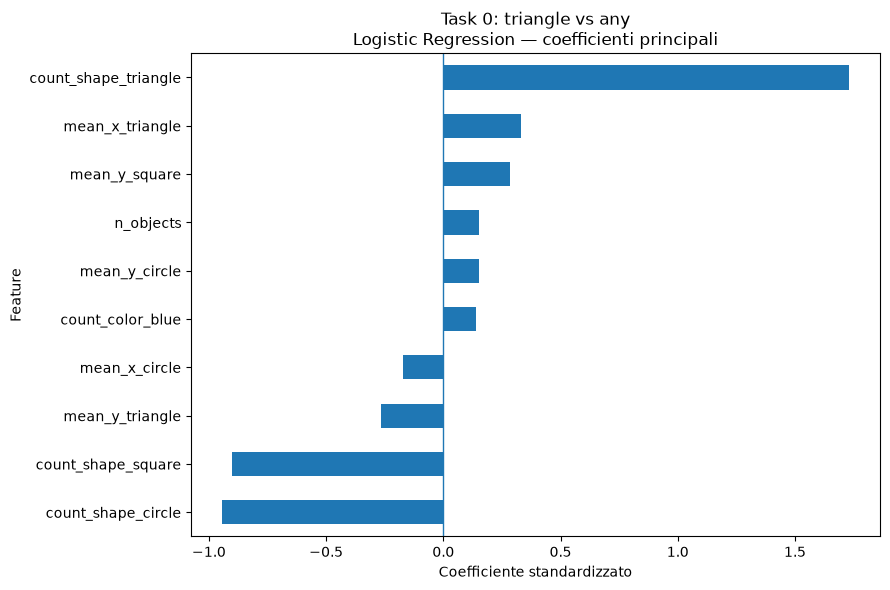

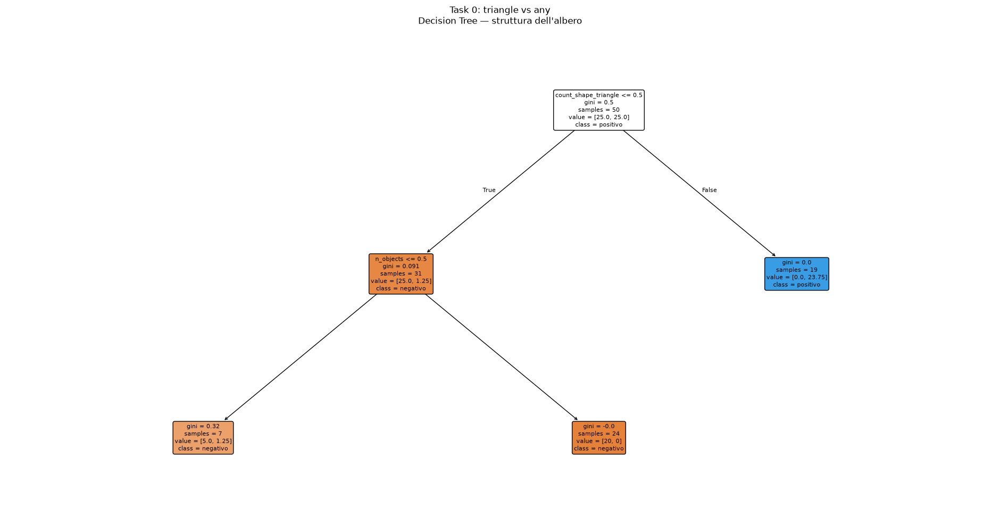

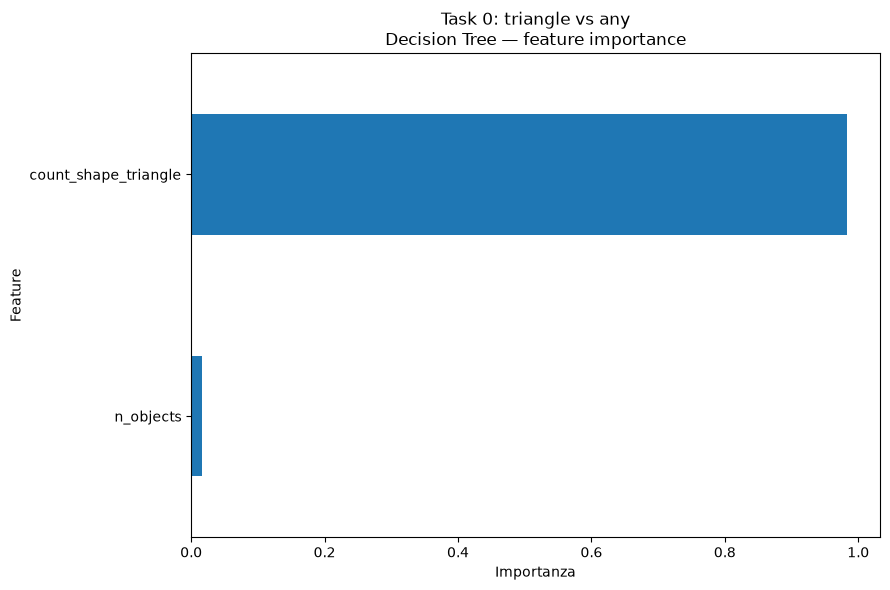

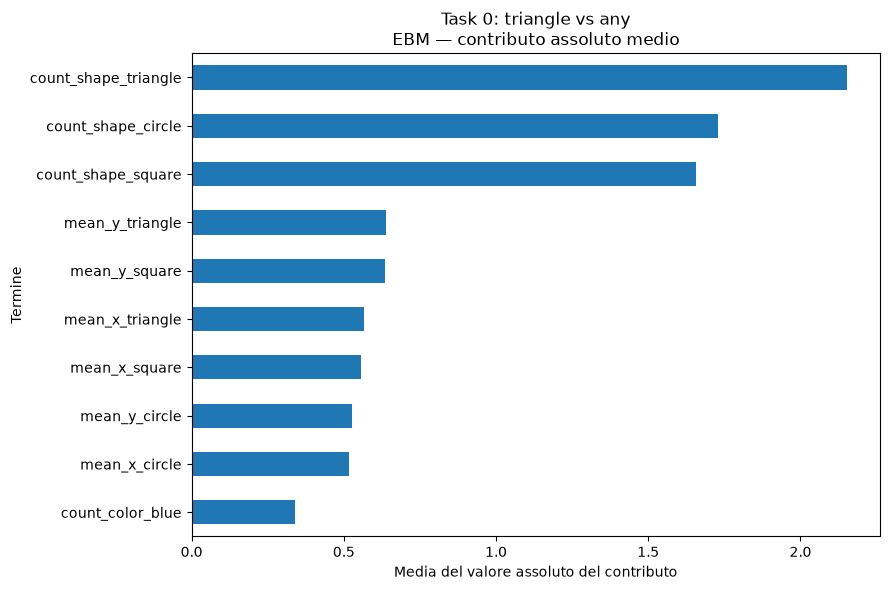

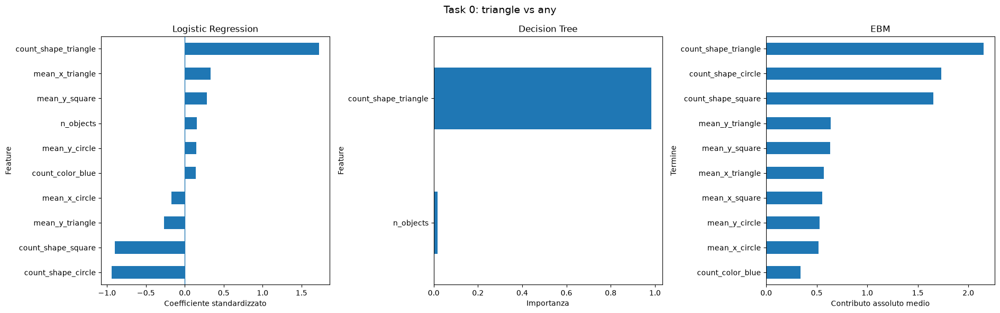

...

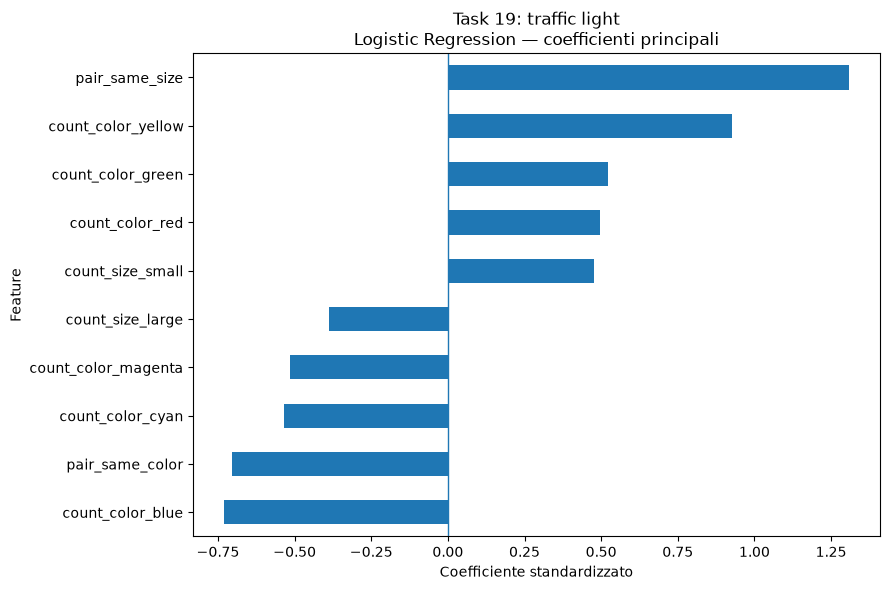

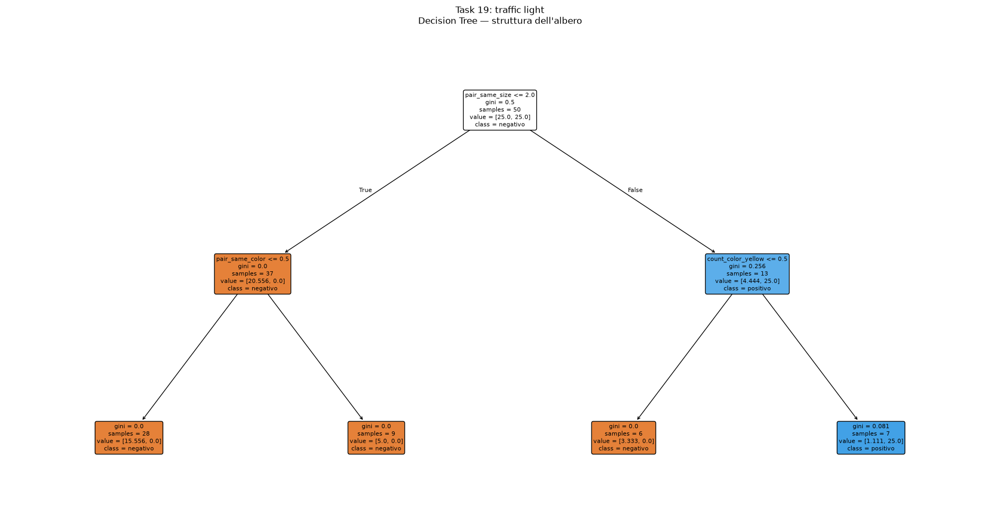

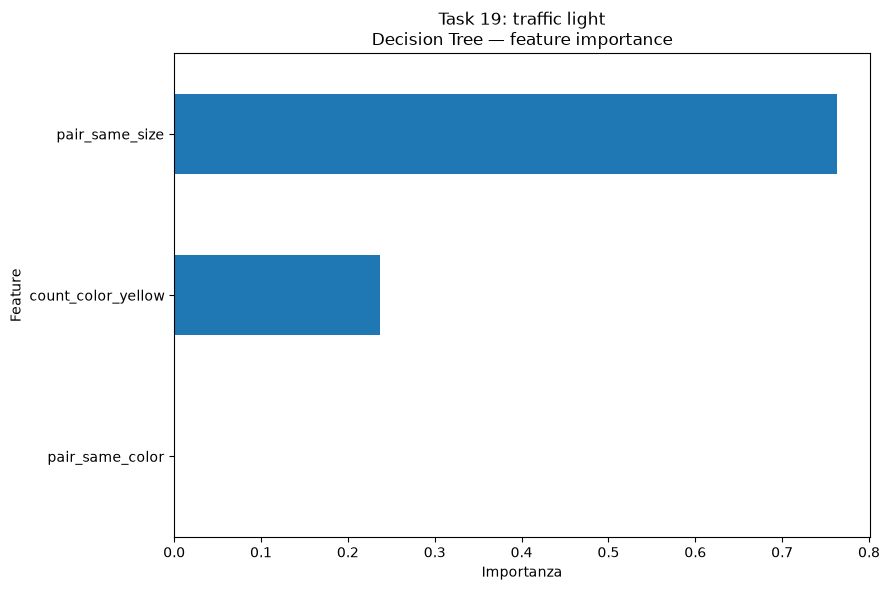

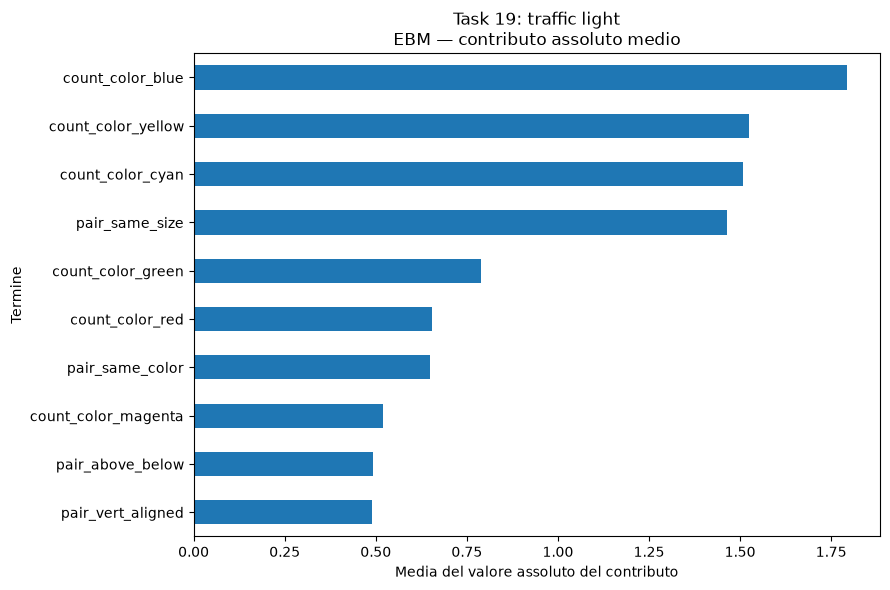

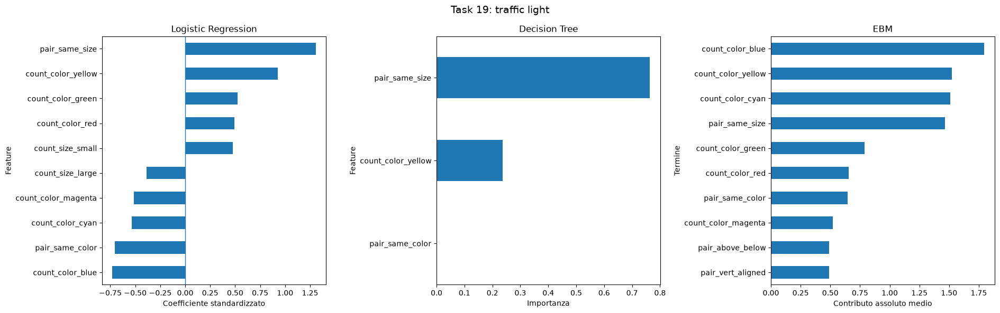


Grafici salvati in:
/home/cosimo/Downloads/kandy-xai/results/interpretable_models/plots


In [26]:
EXPLAIN_TASKS = [0, 9, 13, 15, 19]
TOP_N = 10

# Cartella in cui salvare tutti i grafici
PLOT_DIR = "../results/interpretable_models/plots"
os.makedirs(PLOT_DIR, exist_ok=True)

def fit_explanation_models(task_id, feature_columns=ALL_FEATURES):
    """Fit all three interpretable models for one task using the same features."""
    train = features_df[
        (features_df["split"] == "train")
        & (features_df["task_id"] == task_id)
        & (features_df["supervised"] == 1)
    ].copy()

    if len(train) == 0 or train["label"].nunique() < 2:
        return None, None, None

    # ---------------------------------------------------------
    # Logistic Regression
    # ---------------------------------------------------------
    logistic = Pipeline([
        ("scale", StandardScaler()),
        (
            "clf",
            LogisticRegression(
                max_iter=2000,
                class_weight="balanced",
                random_state=SEED,
            ),
        ),
    ])

    logistic.fit(
        train[feature_columns],
        train["label"],
    )

    # ---------------------------------------------------------
    # Decision Tree
    # ---------------------------------------------------------
    tree = DecisionTreeClassifier(
        max_depth=5,
        min_samples_leaf=4,
        class_weight="balanced",
        random_state=SEED,
    )

    tree.fit(
        train[feature_columns],
        train["label"],
    )

    # ---------------------------------------------------------
    # Explainable Boosting Machine
    # ---------------------------------------------------------
    ebm = None

    if ebm_available:
        ebm = ExplainableBoostingClassifier(
            interactions=5,
            max_bins=32,
            max_rounds=400,
            learning_rate=0.03,
            random_state=SEED,
        )

        ebm.fit(
            train[feature_columns],
            train["label"],
        )

    return logistic, tree, ebm


def ebm_term_importance(model):
    """
    Return:
        pandas.Series(term_name -> mean absolute additive contribution)

    Compatible with different Interpret versions.
    """
    if model is None:
        return pd.Series(dtype=float)

    # Route principale: versioni recenti di Interpret
    term_scores = getattr(model, "term_scores_", None)
    term_names = getattr(model, "term_names_", None)

    if term_scores is not None and term_names is not None:
        values = []

        for name, score in zip(term_names, term_scores):
            arr = np.asarray(score, dtype=float)

            values.append(
                (
                    str(name),
                    float(np.mean(np.abs(arr))),
                )
            )

        return (
            pd.Series(dict(values), dtype=float)
            .sort_values(ascending=False)
        )

    # Fallback attraverso explain_global()
    try:
        data = model.explain_global().data()

        names = data.get("names", [])
        scores = data.get("scores", [])

        values = []

        for name, score in zip(names, scores):
            arr = np.asarray(score, dtype=float)

            values.append(
                (
                    str(name),
                    float(np.mean(np.abs(arr))),
                )
            )

        return (
            pd.Series(dict(values), dtype=float)
            .sort_values(ascending=False)
        )

    except Exception:
        return pd.Series(dtype=float)


# =============================================================
# TRAINING DEI MODELLI
# =============================================================

explanation_models = {}

for task_id in EXPLAIN_TASKS:
    explanation_models[task_id] = fit_explanation_models(task_id)


# =============================================================
# GRAFICI
# =============================================================

for task_id in EXPLAIN_TASKS:

    logistic, tree, ebm = explanation_models[task_id]

    if logistic is None:
        print(f"Task {task_id}: modello non disponibile.")
        continue

    task_name = TASK_NAMES[task_id]

    # ---------------------------------------------------------
    # 1. LOGISTIC REGRESSION
    # ---------------------------------------------------------

    coef = pd.Series(
        logistic.named_steps["clf"].coef_[0],
        index=ALL_FEATURES,
    )

    coef = (
        coef.loc[
            coef.abs()
            .sort_values(ascending=False)
            .head(TOP_N)
            .index
        ]
        .sort_values()
    )

    fig, ax = plt.subplots(figsize=(9, 6))

    coef.plot(
        kind="barh",
        ax=ax,
    )

    ax.axvline(
        0,
        linewidth=1,
    )

    ax.set_title(
        f"Task {task_id}: {task_name}\n"
        "Logistic Regression — coefficienti principali"
    )

    ax.set_xlabel("Coefficiente standardizzato")
    ax.set_ylabel("Feature")

    plt.tight_layout()

    logistic_path = os.path.join(
        PLOT_DIR,
        f"task_{task_id}_logistic_coefficients.png",
    )

    plt.savefig(
        logistic_path,
        dpi=200,
        bbox_inches="tight",
    )

    plt.show()
    plt.close(fig)

    # ---------------------------------------------------------
    # 2. DECISION TREE — STRUTTURA COMPLETA
    # ---------------------------------------------------------

    fig, ax = plt.subplots(
        figsize=(24, 12)
    )

    plot_tree(
        tree,
        feature_names=ALL_FEATURES,
        class_names=["negativo", "positivo"],
        filled=True,
        rounded=True,
        fontsize=8,
        impurity=True,
        proportion=False,
        node_ids=False,
        ax=ax,
    )

    ax.set_title(
        f"Task {task_id}: {task_name}\n"
        "Decision Tree — struttura dell'albero"
    )

    tree_path = os.path.join(
        PLOT_DIR,
        f"task_{task_id}_decision_tree.png",
    )

    plt.savefig(
        tree_path,
        dpi=200,
        bbox_inches="tight",
    )

    plt.show()
    plt.close(fig)

    # ---------------------------------------------------------
    # 3. DECISION TREE — FEATURE IMPORTANCE
    # ---------------------------------------------------------

    tree_imp = pd.Series(
        tree.feature_importances_,
        index=ALL_FEATURES,
    )

    tree_imp = (
        tree_imp[tree_imp > 0]
        .sort_values(ascending=False)
        .head(TOP_N)
        .sort_values()
    )

    fig, ax = plt.subplots(figsize=(9, 6))

    if len(tree_imp):
        tree_imp.plot(
            kind="barh",
            ax=ax,
        )

    ax.set_title(
        f"Task {task_id}: {task_name}\n"
        "Decision Tree — feature importance"
    )

    ax.set_xlabel("Importanza")
    ax.set_ylabel("Feature")

    plt.tight_layout()

    tree_importance_path = os.path.join(
        PLOT_DIR,
        f"task_{task_id}_decision_tree_importance.png",
    )

    plt.savefig(
        tree_importance_path,
        dpi=200,
        bbox_inches="tight",
    )

    plt.show()
    plt.close(fig)

    # ---------------------------------------------------------
    # 4. EBM — IMPORTANZA DEI TERMINI
    # ---------------------------------------------------------

    ebm_imp = (
        ebm_term_importance(ebm)
        .head(TOP_N)
        .sort_values()
        if ebm is not None
        else pd.Series(dtype=float)
    )

    fig, ax = plt.subplots(figsize=(9, 6))

    if len(ebm_imp):

        ebm_imp.plot(
            kind="barh",
            ax=ax,
        )

        ax.set_title(
            f"Task {task_id}: {task_name}\n"
            "EBM — contributo assoluto medio"
        )

        ax.set_xlabel(
            "Media del valore assoluto del contributo"
        )

        ax.set_ylabel("Termine")

    else:

        ax.text(
            0.5,
            0.5,
            "EBM non disponibile",
            ha="center",
            va="center",
            transform=ax.transAxes,
        )

        ax.set_axis_off()

    plt.tight_layout()

    ebm_path = os.path.join(
        PLOT_DIR,
        f"task_{task_id}_ebm_importance.png",
    )

    plt.savefig(
        ebm_path,
        dpi=200,
        bbox_inches="tight",
    )

    plt.show()
    plt.close(fig)

    # ---------------------------------------------------------
    # 5. FIGURA RIASSUNTIVA DEI TRE MODELLI
    # ---------------------------------------------------------

    fig, axes = plt.subplots(
        1,
        3,
        figsize=(19, 6),
    )

    # Logistic
    coef.plot(
        kind="barh",
        ax=axes[0],
    )

    axes[0].axvline(
        0,
        linewidth=1,
    )

    axes[0].set_title(
        "Logistic Regression"
    )

    axes[0].set_xlabel(
        "Coefficiente standardizzato"
    )

    axes[0].set_ylabel(
        "Feature"
    )

    # Tree
    if len(tree_imp):
        tree_imp.plot(
            kind="barh",
            ax=axes[1],
        )

    axes[1].set_title(
        "Decision Tree"
    )

    axes[1].set_xlabel(
        "Importanza"
    )

    axes[1].set_ylabel(
        "Feature"
    )

    # EBM
    if len(ebm_imp):

        ebm_imp.plot(
            kind="barh",
            ax=axes[2],
        )

        axes[2].set_title(
            "EBM"
        )

        axes[2].set_xlabel(
            "Contributo assoluto medio"
        )

        axes[2].set_ylabel(
            "Termine"
        )

    else:

        axes[2].text(
            0.5,
            0.5,
            "EBM non disponibile",
            ha="center",
            va="center",
            transform=axes[2].transAxes,
        )

        axes[2].set_axis_off()

    fig.suptitle(
        f"Task {task_id}: {task_name}",
        fontsize=14,
    )

    plt.tight_layout()

    summary_path = os.path.join(
        PLOT_DIR,
        f"task_{task_id}_interpretable_models_summary.png",
    )

    plt.savefig(
        summary_path,
        dpi=200,
        bbox_inches="tight",
    )

    plt.show()
    plt.close(fig)


print()
print("Grafici salvati in:")
print(os.path.abspath(PLOT_DIR))


### Lettura delle figure

Le tre visualizzazioni non rappresentano esattamente la stessa quantità matematica, ed è importante non confonderle.

Per la Logistic Regression il coefficiente è direttamente interpretabile nella decisione lineare. Nel Decision Tree la quantità mostrata è invece l'importanza della feature nel processo di split. Nell'EBM il modello è additivo e può rappresentare relazioni non lineari; per questo usiamo il contributo assoluto medio dei termini, che indica quali termini modificano maggiormente il punteggio del modello.

Queste figure completano la stampa testuale delle regole dell'albero e dei coefficienti logistic, rendendo più immediato il confronto tra i tre paradigmi interpretabili.


## 10. Diagnostica post-hoc e analisi degli errori

Controlliamo nuovamente che `symbol` non sia mai entrato nella rappresentazione usata dai classificatori.

Poi analizziamo la distribuzione degli errori sul test set.

Questa analisi è utile per capire quali task rimangono difficili e per motivare il passaggio al modello neuro-simbolico.


In [ ]:
print(
    "symbol presente nel dataset:",
    "symbol" in splits["train"].columns,
)

print(
    "symbol usato come feature:",
    "symbol" in ALL_FEATURES,
)

assert "symbol" not in ALL_FEATURES

In [ ]:
errors = []

for task_id, model in models_all.items():
    test = features_df[
        (features_df["split"] == "test")
        & (features_df["task_id"] == task_id)
    ].copy()

    test["prediction"] = model.predict(
        test[ALL_FEATURES]
    )

    errors.append(
        test.loc[
            test["label"] != test["prediction"],
            [
                "filename",
                "task_id",
                "label",
                "prediction",
                "split",
            ],
        ]
    )

errors_df = (
    pd.concat(
        errors,
        ignore_index=True,
    )
    if errors
    else pd.DataFrame()
)

print(
    "Numero totale di errori:",
    len(errors_df),
)

if len(errors_df):
    display(
        errors_df
        .groupby("task_id")
        .size()
        .reset_index(
            name="n_errors"
        )
        .sort_values(
            "n_errors",
            ascending=False,
        )
    )

## 11. Salvataggio dei risultati

I risultati vengono salvati nella cartella `results/interpretable_models`.

In questo modo il Notebook 2 può essere confrontato direttamente con i benchmark dei notebook successivi.


In [ ]:
OUT = (
    ROOT
    / "results"
    / "interpretable_models"
)

OUT.mkdir(
    parents=True,
    exist_ok=True,
)

results_perc.to_csv(
    OUT / "kandy_interpretable_perceptual_final.csv",
    index=False,
)

results_all.to_csv(
    OUT / "kandy_interpretable_generic_relations_final.csv",
    index=False,
)

comparison.to_csv(
    OUT / "kandy_interpretable_comparison_final.csv",
    index=False,
)

diagnostic_summary.to_csv(
    OUT / "kandy_detector_diagnostic_final.csv"
)

if len(results_ebm):
    results_ebm.to_csv(
        OUT / "kandy_ebm_final.csv",
        index=False,
    )



# Salva anche una tabella compatta delle importanze usate nelle figure.
importance_rows = []
for task_id in EXPLAIN_TASKS:
    logistic, tree, ebm = explanation_models.get(task_id, (None, None, None))
    if logistic is None:
        continue

    coef = pd.Series(
        logistic.named_steps["clf"].coef_[0],
        index=ALL_FEATURES,
    )
    for feature, value in coef.items():
        importance_rows.append({
            "task_id": task_id,
            "task": TASK_NAMES[task_id],
            "model": "logistic",
            "term": feature,
            "importance_signed": float(value),
            "importance_abs": float(abs(value)),
        })

    if tree is not None:
        for feature, value in pd.Series(tree.feature_importances_, index=ALL_FEATURES).items():
            if value > 0:
                importance_rows.append({
                    "task_id": task_id,
                    "task": TASK_NAMES[task_id],
                    "model": "tree",
                    "term": feature,
                    "importance_signed": float(value),
                    "importance_abs": float(abs(value)),
                })

    if ebm is not None:
        for term, value in ebm_term_importance(ebm).items():
            importance_rows.append({
                "task_id": task_id,
                "task": TASK_NAMES[task_id],
                "model": "ebm",
                "term": term,
                "importance_signed": np.nan,
                "importance_abs": float(value),
            })

importance_df = pd.DataFrame(importance_rows)
if len(importance_df):
    importance_df.to_csv(
        OUT / "kandy_interpretable_feature_importances_final.csv",
        index=False,
    )

print(
    "Risultati salvati in:",
    OUT,
)

## Conclusione

Il Notebook 2 costruisce una baseline interpretabile **indipendente dalle annotazioni simboliche**.

La rappresentazione parte dalla percezione dell'immagine e arriva a feature comprensibili, come forma, colore, dimensione, posizione e relazioni spaziali generiche.

I risultati vanno interpretati in due livelli:

1. **qualità della percezione**, misurata separatamente tramite la diagnostica post-hoc;
2. **capacità dei modelli interpretabili di usare questa rappresentazione**, misurata con Logistic Regression, Decision Tree ed eventualmente EBM.

Se le task composizionali rimangono difficili nonostante una buona percezione di base, questo costituisce la motivazione per il passaggio al Notebook 5: una pipeline **neuro-simbolica** in cui la percezione visiva e il ragionamento logico vengono separati esplicitamente.
